#**0. Intro (ambiente)**

In [ ]:
!pip install kaleido -q
import kaleido #required
kaleido.__version__ #0.2.1

import plotly
plotly.__version__ #5.5.0

#now this works:
import plotly.graph_objects as go

fig = go.Figure()
fig.write_image('prova_do_not_consider.png')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import joblib

import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import statsmodels.api as sm
from scipy import stats

from sklearn.preprocessing import StandardScaler, LabelEncoder, PolynomialFeatures
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_val_predict, StratifiedKFold, KFold, cross_validate, learning_curve
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve, auc, precision_recall_curve, f1_score, precision_score, recall_score

import shap

In [ ]:
!pip install scikeras -q

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization, Input, LeakyReLU
from keras.utils import plot_model
from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau, LearningRateScheduler
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.regularizers import l1_l2
from scikeras.wrappers import KerasClassifier
from tensorflow.keras.metrics import AUC, Precision, Recall
#from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [ ]:
!pip install dash -q # Added -q for quiet installation
!pip install dash-bootstrap-components -q # Added -q for quiet installation

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 27.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.3/229.3 kB 5.7 MB/s eta 0:00:00


In [ ]:
import dash
import dash_bootstrap_components as dbc
from dash import dcc, html
from dash.dependencies import Input, Output, State

# **1. Preparazione**

##1.1. Importazione

In [ ]:
#data = pd.read_csv("/content/drive/MyDrive/Tesi/Dataset_partenza - Dataset_partenza.csv", sep=",")
#data= pd.read_csv("/content/drive/MyDrive/Tesi/dataset_dummy.csv", sep=",")
data2= pd.read_csv("/content/drive/MyDrive/Tesi/dataset_dummy_v2.csv", sep=",")
#data_conv= pd.read_csv("/content/drive/MyDrive/Tesi/dataset_conv.csv", sep=",")
data= pd.read_csv("/content/drive/MyDrive/Tesi/dataset_originale.csv", sep=",")

data.head()

,Genere,Classe d'età,Reddito familiare,Classe Reddito Familiare,Livello di istruzione,Casa di proprietà,Casa Indipendente,Numero persone in famiglia,Numero di auto in famiglia,Importanza di ridurre le emissioni di gas serra,Tipologia di auto precedente,Auto attuale,Tipologia di auto attuale,BEV dummy,Viaggio più lungo negli ultimi 12 mesi,Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi,Distanza casa-lavoro,VMT annuo
0,Maschio,65-74,275000,Molto alta,Laurea 1L,Si,Si,2.0,2.0,2.52,PHEV,Toyota Mirai FCEV,FCEV,0.0,483.14,1,0.01,14622
1,Maschio,65-74,275000,Molto alta,Laurea 2L o Dottorato,Si,Si,3.0,3.0,2.76,HEV,Toyota Mirai FCEV,FCEV,0.0,568.09,1,10.69,9197
2,Maschio,55-64,125000,Media,Diploma o Qualifica professionale,Si,Si,2.0,3.0,2.60,PHEV,Toyota Mirai FCEV,FCEV,0.0,255.16,1,17.63,5082
3,Maschio,75-79,175000,Alta,Laurea 2L o Dottorato,Si,Si,2.0,2.0,1.23,HEV,Toyota Mirai FCEV,FCEV,0.0,312.78,1,3.53,13025
4,Maschio,45-54,500000,Estremamente alta,Diploma o Qualifica professionale,Si,Si,3.0,3.0,1.08,HEV,Toyota Mirai FCEV,FCEV,0.0,125.79,0,28.05,18000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 18 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  object 
 1   Classe d'età                                                  10688 non-null  object 
 2   Reddito familiare                                             10688 non-null  int64  
 3   Classe Reddito Familiare                                      10688 non-null  object 
 4   Livello di istruzione                                         10688 non-null  object 
 5   Casa di proprietà                                             10688 non-null  object 
 6   Casa Indipendente                                             10688 non-null  object 
 7   Numero persone in famiglia                                    10688

## 1.2. Pulizia e preparazione variabili

In [ ]:
for col in data.columns:
    print(f'"{col}"')

"Genere"
"Classe d'età"
"Reddito familiare"
"Classe Reddito Familiare"
"Livello di istruzione"
"Casa di proprietà"
"Casa Indipendente"
"Numero persone in famiglia"
"Numero di auto in famiglia"
"Importanza di ridurre le emissioni di gas serra"
"Tipologia di auto precedente"
"Auto attuale"
"Tipologia di auto attuale"
"BEV dummy"
"Viaggio più lungo negli ultimi 12 mesi"
"Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi"
"Distanza casa-lavoro"
"VMT annuo"


In [ ]:
data = data.drop(["Auto attuale", "Tipologia di auto attuale"
                  ], axis=1)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 16 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  object 
 1   Classe d'età                                                  10688 non-null  object 
 2   Reddito familiare                                             10688 non-null  int64  
 3   Classe Reddito Familiare                                      10688 non-null  object 
 4   Livello di istruzione                                         10688 non-null  object 
 5   Casa di proprietà                                             10688 non-null  object 
 6   Casa Indipendente                                             10688 non-null  object 
 7   Numero persone in famiglia                                    10688

In [ ]:
for col in data.select_dtypes(include=['object']).columns:
    unique_col = data[col].unique()
    print(col, unique_col)

Genere ['Maschio' 'Femmina']
Classe d'età ['65-74' '55-64' '75-79' '45-54' '35-44' '<25' '25-34' '>80']
Classe Reddito Familiare ['Molto alta' 'Media' 'Alta' 'Estremamente alta' 'Bassa']
Livello di istruzione ['Laurea 1L' 'Laurea 2L o Dottorato' 'Diploma o Qualifica professionale'
 'Licenza Media']
Casa di proprietà ['Si' 'No']
Casa Indipendente ['Si' 'No']
Tipologia di auto precedente ['PHEV' 'HEV' 'ICE' 'BEV' 'GNC']


In [ ]:
Genere_mapping = {'Maschio':1, 'Femmina':0}
Eta_mapping = {'<25': 1, '25-34':2, '35-44':3, '45-54':4, '55-64':5, '65-74':6, '75-79':7, '>80':8}
Isruzione_mapping = {'Licenza Media':1, 'Diploma o Qualifica professionale':2, 'Laurea 1L':3, 'Laurea 2L o Dottorato':4}
Reddito_mapping = {'Bassa':1, 'Media':2, 'Alta':3, 'Molto alta':4, 'Estremamente alta':5}
casapro_mapping = {'Si':1, 'No':0}
casaind_mapping = {'Si':1, 'No':0}
#autoprec_mapping = {'PHEV':1, 'BEV':2, 'HEV':3, 'ICE':4, 'GNC':5}

data['Genere'] = data['Genere'].map(Genere_mapping).values
data["Classe d'età"] = data["Classe d'età"].map(Eta_mapping).values
data['Livello di istruzione'] = data['Livello di istruzione'].map(Isruzione_mapping).values
data['Classe Reddito Familiare'] = data['Classe Reddito Familiare'].map(Reddito_mapping).values
data['Casa di proprietà'] = data['Casa di proprietà'].map(casapro_mapping).values
data['Casa Indipendente'] = data['Casa Indipendente'].map(casaind_mapping).values

data['Tipologia di auto precedente: PHEV'] = (data['Tipologia di auto precedente'] == 'PHEV').astype(int)
data['Tipologia di auto precedente: BEV'] = (data['Tipologia di auto precedente'] == 'BEV').astype(int)
data['Tipologia di auto precedente: HEV'] = (data['Tipologia di auto precedente'] == 'HEV').astype(int)
data['Tipologia di auto precedente: ICE'] = (data['Tipologia di auto precedente'] == 'ICE').astype(int)
data['Tipologia di auto precedente: GNC'] = (data['Tipologia di auto precedente'] == 'GNC').astype(int)

data = data.drop('Tipologia di auto precedente', axis=1)

In [ ]:
data = data.drop("Classe Reddito Familiare", axis=1)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 19 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  int64  
 1   Classe d'età                                                  10688 non-null  int64  
 2   Reddito familiare                                             10688 non-null  int64  
 3   Livello di istruzione                                         10688 non-null  int64  
 4   Casa di proprietà                                             10688 non-null  int64  
 5   Casa Indipendente                                             10688 non-null  int64  
 6   Numero persone in famiglia                                    10688 non-null  float64
 7   Numero di auto in famiglia                                    10688

In [ ]:
data

,Genere,Classe d'età,Reddito familiare,Livello di istruzione,Casa di proprietà,Casa Indipendente,Numero persone in famiglia,Numero di auto in famiglia,Importanza di ridurre le emissioni di gas serra,BEV dummy,Viaggio più lungo negli ultimi 12 mesi,Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi,Distanza casa-lavoro,VMT annuo,Tipologia di auto precedente: PHEV,Tipologia di auto precedente: BEV,Tipologia di auto precedente: HEV,Tipologia di auto precedente: ICE,Tipologia di auto precedente: GNC
0,1,6,275000,3,1,1,2.0,2.0,2.52,0.0,483.14,1,0.01,14622,1,0,0,0,0
1,1,6,275000,4,1,1,3.0,3.0,2.76,0.0,568.09,1,10.69,9197,0,0,1,0,0
2,1,5,125000,2,1,1,2.0,3.0,2.60,0.0,255.16,1,17.63,5082,1,0,0,0,0
3,1,7,175000,4,1,1,2.0,2.0,1.23,0.0,312.78,1,3.53,13025,0,0,1,0,0
4,1,4,500000,2,1,1,3.0,3.0,1.08,0.0,125.79,0,28.05,18000,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10683,1,7,125000,2,1,1,2.0,4.0,2.99,0.0,625.38,3,44.72,16186,0,0,0,1,0
10684,1,6,125000,3,1,1,2.0,2.0,2.74,0.0,129.83,0,22.13,14409,0,0,1,0,0
10685,0,5,125000,4,1,1,1.0,1.0,2.83,0.0,496.00,3,8.07,20000,0,0,1,0,0
10686,0,5,325000,3,1,1,4.0,2.0,0.03,1.0,227.55,2,17.29,13000,0,1,0,0,0


## 1.3. Train Test split

In [ ]:
y = data['BEV dummy']
X = data.drop(columns=['BEV dummy'])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=343)

In [ ]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10688 entries, 0 to 10687
Data columns (total 18 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   Genere                                                        10688 non-null  int64  
 1   Classe d'età                                                  10688 non-null  int64  
 2   Reddito familiare                                             10688 non-null  int64  
 3   Livello di istruzione                                         10688 non-null  int64  
 4   Casa di proprietà                                             10688 non-null  int64  
 5   Casa Indipendente                                             10688 non-null  int64  
 6   Numero persone in famiglia                                    10688 non-null  float64
 7   Numero di auto in famiglia                                    10688

In [ ]:
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.fit_transform(X_test)

In [ ]:
X_train.shape

(8550, 18)

In [ ]:
X_test.shape

(2138, 18)

In [ ]:
correlation_matrix = X.corr()
original_columns = list(correlation_matrix.columns)
original_columns

['Genere',
 "Classe d'età",
 'Reddito familiare',
 'Livello di istruzione',
 'Casa di proprietà',
 'Casa Indipendente',
 'Numero persone in famiglia',
 'Numero di auto in famiglia',
 'Importanza di ridurre le emissioni di gas serra',
 'Viaggio più lungo negli ultimi 12 mesi',
 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi',
 'Distanza casa-lavoro',
 'VMT annuo',
 'Tipologia di auto precedente: PHEV',
 'Tipologia di auto precedente: BEV',
 'Tipologia di auto precedente: HEV',
 'Tipologia di auto precedente: ICE',
 'Tipologia di auto precedente: GNC']

In [ ]:
abbreviated_columns = [
    'Genere', 'Classe Età', 'Reddito', 'Istruzione', 'Casa prop.', 'Casa Indip.', 'N. persone in fam.', 'N. auto in fam.', 'Sensibilità Ambiente',
    'Viaggio più lungo', 'N. viaggi lunghi', 'Distanza Casa-Lav.', 'VMT',
    'PHEV precedente', 'BEV precedente', 'HEV precedente', 'ICE precedente', 'GNC precedente',

]
abbreviated_columns

['Genere',
 'Classe Età',
 'Reddito',
 'Istruzione',
 'Casa prop.',
 'Casa Indip.',
 'N. persone in fam.',
 'N. auto in fam.',
 'Sensibilità Ambiente',
 'Viaggio più lungo',
 'N. viaggi lunghi',
 'Distanza Casa-Lav.',
 'VMT',
 'PHEV precedente',
 'BEV precedente',
 'HEV precedente',
 'ICE precedente',
 'GNC precedente']

In [ ]:
fig_cm = ff.create_annotated_heatmap(
    z=correlation_matrix.values,
    x=abbreviated_columns,
    y=abbreviated_columns,
    annotation_text=np.around(correlation_matrix.values, decimals=2),
    showscale=True
)

fig_cm.update_layout(
    title={
        'text': "Correlation Matrix",
        'x': 0.5,
        'xanchor': 'center',  # Ancoraggio al centro
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'},
        #'pad': {'t': 10}
    },
    margin=dict(t=200, b=0, l=0, r=0),
    height=600,
    width=1200,
)
fig_cm.show()

In [ ]:
#fig_cm.write_image("Correlation_Matrix.png", scale=5)

In [ ]:
X_train

array([[ 0.5756396 , -0.42531959,  2.53261534, ...,  1.97405856,
        -1.14545213, -0.06855912],
       [ 0.5756396 ,  1.90825208, -0.25098757, ...,  1.97405856,
        -1.14545213, -0.06855912],
       [ 0.5756396 , -1.20317682, -0.67923417, ...,  1.97405856,
        -1.14545213, -0.06855912],
       ...,
       [ 0.5756396 ,  1.13039485,  1.46199883, ..., -0.50657058,
         0.87301772, -0.06855912],
       [-1.73719807, -0.42531959, -0.67923417, ..., -0.50657058,
        -1.14545213, -0.06855912],
       [ 0.5756396 , -1.20317682, -0.67923417, ..., -0.50657058,
        -1.14545213, -0.06855912]])

## 1.4 Feature Selection

In [ ]:
X_scaled = sc.fit_transform(X)

selector = SelectKBest(score_func=f_classif, k='all')
X_selected = selector.fit_transform(X_scaled, y)

scores = selector.scores_ # punteggi delle caratteristiche
print(f"Le feature selezionate sono: {X.columns[selector.get_support()].tolist()}")
print("\nPunteggi delle caratteristiche:", scores)

ploy = PolynomialFeatures(degree=2)
X_poly = ploy.fit_transform(X_selected)
#print(f"Le feature polinomiali sono: {ploy.get_feature_names_out()}")
print("Numero di caratteristiche polinomiali:", X_poly.shape[1])

Le feature selezionate sono: ['Genere', "Classe d'età", 'Reddito familiare', 'Livello di istruzione', 'Casa di proprietà', 'Casa Indipendente', 'Numero persone in famiglia', 'Numero di auto in famiglia', 'Importanza di ridurre le emissioni di gas serra', 'Viaggio più lungo negli ultimi 12 mesi', 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi', 'Distanza casa-lavoro', 'VMT annuo', 'Tipologia di auto precedente: PHEV', 'Tipologia di auto precedente: BEV', 'Tipologia di auto precedente: HEV', 'Tipologia di auto precedente: ICE', 'Tipologia di auto precedente: GNC']

Punteggi delle caratteristiche: [ 18.71527942  14.44337123 240.76784195  83.25862048  34.65080483
  29.18867082  67.03931426  45.0821969   47.80388404   1.44862639
  91.29501945  18.80735045 112.19461497  34.54532221 247.73280432
  84.89743415   1.63148845   0.32717681]
Le feature polinomiali sono: ['1' 'x0' 'x1' 'x2' 'x3' 'x4' 'x5' 'x6' 'x7' 'x8' 'x9' 'x10' 'x11' 'x12'
 'x13' 'x14' 'x15' 'x16' 'x17' 'x0^2' 'x0 

In [ ]:
k_values = range(1, X_scaled.shape[1] + 1)

best_k = 0
best_score = 0
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier()


for k in k_values: #validazione incrociata per ogni valore di k
    selector = SelectKBest(score_func=f_classif, k=k)
    X_selected = selector.fit_transform(X_scaled, y)

    score = cross_val_score(gb, X_selected, y, cv=5, scoring='accuracy').mean()

    if score > best_score:
        best_score = score
        best_k = k

print(f"Il miglior numero di caratteristiche (k) è: {best_k} con un punteggio di {best_score}")

Il miglior numero di caratteristiche (k) è: 11 con un punteggio di 0.6699104337011967


Cross validation per trovare il numero ottimale di feature da inserire nel modello. Il risultato riporta 11 varibili rilevanti.

In [ ]:
selector = SelectKBest(score_func=f_classif, k=best_k)
X_selected = selector.fit_transform(X_scaled, y)

scores = selector.scores_ # punteggi delle caratteristiche
print(f"Le feature selezionate sono: {X.columns[selector.get_support()].tolist()}")
print("\nPunteggi delle caratteristiche:", scores)

Le feature selezionate sono: ['Reddito familiare', 'Livello di istruzione', 'Casa di proprietà', 'Numero persone in famiglia', 'Numero di auto in famiglia', 'Importanza di ridurre le emissioni di gas serra', 'Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi', 'VMT annuo', 'Tipologia di auto precedente: PHEV', 'Tipologia di auto precedente: BEV', 'Tipologia di auto precedente: HEV']

Punteggi delle caratteristiche: [ 18.71527942  14.44337123 240.76784195  83.25862048  34.65080483
  29.18867082  67.03931426  45.0821969   47.80388404   1.44862639
  91.29501945  18.80735045 112.19461497  34.54532221 247.73280432
  84.89743415   1.63148845   0.32717681]


In [ ]:
ploy = PolynomialFeatures(degree=2)
X_poly = ploy.fit_transform(X_selected)
print(f"Le feature polinomiali sono: {ploy.get_feature_names_out()}")
print("\nNumero di caratteristiche polinomiali:", X_poly.shape[1])

Le feature polinomiali sono: ['1' 'x0' 'x1' 'x2' 'x3' 'x4' 'x5' 'x6' 'x7' 'x8' 'x9' 'x10' 'x0^2'
 'x0 x1' 'x0 x2' 'x0 x3' 'x0 x4' 'x0 x5' 'x0 x6' 'x0 x7' 'x0 x8' 'x0 x9'
 'x0 x10' 'x1^2' 'x1 x2' 'x1 x3' 'x1 x4' 'x1 x5' 'x1 x6' 'x1 x7' 'x1 x8'
 'x1 x9' 'x1 x10' 'x2^2' 'x2 x3' 'x2 x4' 'x2 x5' 'x2 x6' 'x2 x7' 'x2 x8'
 'x2 x9' 'x2 x10' 'x3^2' 'x3 x4' 'x3 x5' 'x3 x6' 'x3 x7' 'x3 x8' 'x3 x9'
 'x3 x10' 'x4^2' 'x4 x5' 'x4 x6' 'x4 x7' 'x4 x8' 'x4 x9' 'x4 x10' 'x5^2'
 'x5 x6' 'x5 x7' 'x5 x8' 'x5 x9' 'x5 x10' 'x6^2' 'x6 x7' 'x6 x8' 'x6 x9'
 'x6 x10' 'x7^2' 'x7 x8' 'x7 x9' 'x7 x10' 'x8^2' 'x8 x9' 'x8 x10' 'x9^2'
 'x9 x10' 'x10^2']

Numero di caratteristiche polinomiali: 78


# **2. Analisi Predittiva: ML**

## 2.1. Bilanciamento Target

In [ ]:
color_map = {0: "lightgreen", 1: "lightcoral"}
fig = px.histogram(data,
                   x ='BEV dummy',
                   color='BEV dummy',
                   title='distribuzione assoluta della variabile BEV dummy',
                   color_discrete_map=color_map
                   )

fig.update_layout (xaxis_title='valore',
                   yaxis_title='occorrenze' ,
                   legend_title='BEV dummy')

fig.show ()

print(f"\nDistribuzione relativa della variabile BEV dummy: {data ['BEV dummy'].value_counts (normalize=True)}" )
print(f"\nDistribuzione relativa della variabile BEV dummy nel TRAIN SET: {y_train.value_counts (normalize=True)}" )
print(f"\nDistribuzione relativa della variabile BEV dummy nel TEST SET: {y_test.value_counts (normalize=True)}" )


Distribuzione relativa della variabile BEV dummy: BEV dummy
1.0    0.54229
0.0    0.45771
Name: proportion, dtype: float64

Distribuzione relativa della variabile BEV dummy nel TRAIN SET: BEV dummy
1.0    0.544327
0.0    0.455673
Name: proportion, dtype: float64

Distribuzione relativa della variabile BEV dummy nel TEST SET: BEV dummy
1.0    0.534144
0.0    0.465856
Name: proportion, dtype: float64


In [ ]:
fig.write_image('Bilancimento_Target.pdf')

In [ ]:
"""
from imblearn.over_sampling import SMOTE, ADASYN
from collections import Counter
#smote = SMOTE(random_state=23)
#X_resampled, y_resampled = smote.fit_resample(X, y)
#print("SMOTE:", sorted(Counter(y_resampled).items()))
adasyn = ADASYN(random_state=23, sampling_strategy='minority')
X_resampled, y_resampled = adasyn.fit_resample(X, y)
print("ADASYN:", sorted(Counter(y_resampled).items()))
"""

## 2.2. Creazione modelli

In [ ]:
!pip install --upgrade scikit-learn xgboost
!pip install --upgrade xgboost

In [ ]:
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier, Perceptron
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier

import xgboost as xgb
import lightgbm as lgb

/usr/local/lib/python3.11/dist-packages/dask/dataframe/__init__.py:42: FutureWarning:


Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.




In [ ]:
lg= LogisticRegression()
knn = KNeighborsClassifier()
svm = SVC(probability=True)
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()

#base_classifier = LogisticRegression(max_iter=1000)
#base_classifier = SVC(kernel='linear', probability=True)
#base_classifier = Perceptron(max_iter=1000)
base_classifier = DecisionTreeClassifier(max_depth=1)
ad = AdaBoostClassifier(base_classifier)
#ad = AdaBoostClassifier()

gb = GradientBoostingClassifier()
nb = BernoulliNB() #GaussianNB()
lda = LinearDiscriminantAnalysis()
qda = QuadraticDiscriminantAnalysis()
mlp = MLPClassifier()
sgd = SGDClassifier()
rdg = RidgeClassifier()

"""
        "K-Nearest Neighbors": KNeighborsClassifier(),
        "SVM": SVC(),
        "Decision Tree": DecisionTreeClassifier(),
        "Random Forest": RandomForestClassifier(),
        "Gradient Boosting": GradientBoostingClassifier(),
        "AdaBoost": AdaBoostClassifier(),
        "Naive Bayes": GaussianNB(),
        "XGBoost": xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss'),
        "LightGBM": lgb.LGBMClassifier(),
        'Linear Discriminant Analysis (LDA)': LinearDiscriminantAnalysis(),
        'Quadratic Discriminant Analysis (QDA)': QuadraticDiscriminantAnalysis(),
        'Neural Network (MLP)': MLPClassifier(max_iter=1000)
"""

'\n        "K-Nearest Neighbors": KNeighborsClassifier(),\n        "SVM": SVC(),\n        "Decision Tree": DecisionTreeClassifier(),\n        "Random Forest": RandomForestClassifier(),\n        "Gradient Boosting": GradientBoostingClassifier(),\n        "AdaBoost": AdaBoostClassifier(),\n        "Naive Bayes": GaussianNB(),\n        "XGBoost": xgb.XGBClassifier(use_label_encoder=False, eval_metric=\'logloss\'),\n        "LightGBM": lgb.LGBMClassifier(),\n        \'Linear Discriminant Analysis (LDA)\': LinearDiscriminantAnalysis(),\n        \'Quadratic Discriminant Analysis (QDA)\': QuadraticDiscriminantAnalysis(),\n        \'Neural Network (MLP)\': MLPClassifier(max_iter=1000)\n'

## 2.3. Confronto Modelli

In [ ]:
models = []
models.append(('Logistica', lg))
models.append(('KNN', knn))
models.append(('Naive Bayes', nb))
models.append(('Decision Tree', dt))
models.append(('Random Forest', rf))
models.append(('SVM', svm))
models.append(('Ridge', rdg))
models.append(('SGD', sgd))
#models.append(('XGBoost', xgb))
models.append(('Gradient Boosting', gb))
models.append(('AdaBoost', ad))
models.append(('LDA', lda))
models.append(('QDA', qda))
models.append(('MLP', mlp))

n_folds = 10 # numero di split
results = [] # lista dove salvare le performance
names = [] # lista dove salvare i nomi dei modelli per la visualizzazione
accuratezza = []

In [ ]:
nan_values = np.isnan(X_train).any()

if nan_values.any():
    print("NaN values found in X_train.")
    print(np.where(np.isnan(X_train)))  # Print indices of NaN values
else:
    print("No NaN values found in X_train.")

No NaN values found in X_train.


In [ ]:
# iniziamo il ciclo dove andremo a testare ogni modello

from sklearn import model_selection
from sklearn.impute import SimpleImputer

#for Logistica, lg in models:
for name, model in models:
    kfold = model_selection.KFold(n_splits=n_folds)
    print("Testing model:", name)
    # Imputer per sostituire i NaN values con la media
    #imputer = SimpleImputer(strategy='mean')
    cv_results = model_selection.cross_val_score(
        model,
        X_train,
        y_train,
        cv=kfold,
        scoring="accuracy",
        verbose=0,
        n_jobs=-1)
    results.append(cv_results)
    names.append(name)# append Logistica in names, lista vuota
    msg = "%s: %f (%f)" % (name, cv_results.mean(), cv_results.std())

    print(msg+"\n")
    #nella stampa abbiamo
    #1 il nome del modello con -> %s:  -> name
    #2 i valori che abbiamo ottenuto da questa operazione con -> %f (%f)
    #   2.1 %f -> corrisponde a cv_results.mean() -> ovvero la media dell'acc che abbiamo trovato
    #   2.2 (%f) -> corrisponde a cv_results.std() -> ovver l'err standard trovato

Testing model: Logistica
Logistica: 0.628070 (0.017062)

Testing model: KNN
KNN: 0.591930 (0.010700)

Testing model: Naive Bayes
Naive Bayes: 0.644327 (0.013319)

Testing model: Decision Tree
Decision Tree: 0.587368 (0.017448)

Testing model: Random Forest
Random Forest: 0.668655 (0.010656)

Testing model: SVM
SVM: 0.653216 (0.015789)

Testing model: Ridge
Ridge: 0.624912 (0.016383)

Testing model: SGD
SGD: 0.609942 (0.015807)

Testing model: Gradient Boosting
Gradient Boosting: 0.682105 (0.010894)

Testing model: AdaBoost
AdaBoost: 0.671228 (0.013961)

Testing model: LDA
LDA: 0.624912 (0.016383)

Testing model: QDA
QDA: 0.596374 (0.019250)

Testing model: MLP
MLP: 0.646784 (0.011531)



In [ ]:
results_flat = np.concatenate(results)
names_repeated = [[name] * len(result) for name, result in zip(names, results)]
names_flat = np.concatenate(names_repeated)
df_algoritmi = pd.DataFrame({'Model': names_flat, 'Accuracy': results_flat})

fig_comp_modelli = px.box(df_algoritmi, x="Model", y="Accuracy")
fig_comp_modelli.update_layout (xaxis_title='Modelli',
                   yaxis_title='Accuratezza dei modelli' ,
                   title={'text': "BOX PLOT: Modelli a confronto",
                          'x': 0.5,
                          'xanchor': 'center',
                          'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                    height=600,
                    width=1200,
                   )

fig_comp_modelli.show()

In [ ]:
fig_comp_modelli.write_image('Confronto_Modelli.pdf')

In [ ]:
fig = go.Figure()
#fold_in_idx: nuova var diversa da fold_idx per evitare confusione
for fold_in_idx, (train_idx, test_idx) in enumerate(stratified_kfold.split(X_train, y_train)):
    if fold_in_idx >= n_folds:  # Interrompe il ciclo dopo 10 fold
        break

    # Training set
    fig.add_trace(go.Scatter(
        x=train_idx,
        y=[fold_in_idx + 1] * len(train_idx),
        mode='markers',
        marker=dict(color='blue', size=10),
        name=f'Fold {fold_in_idx + 1} - Train',
        legendgroup=f'Fold {fold_in_idx + 1}',  # Raggruppa i fold
    ))

    # Test set
    fig.add_trace(go.Scatter(
        x=test_idx,
        y=[fold_in_idx + 1] * len(test_idx),
        mode='markers',
        marker=dict(color='red', size=10),
        name=f'Fold {fold_in_idx + 1} - Test',
        legendgroup=f'Fold {fold_in_idx + 1}',  # Raggruppa i fold
    ))

fig.update_layout(
    title={'text': "Visualizzazione dei 10 Stratified KFold",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis=dict(title="Sample Index"),
    yaxis=dict(title="Fold", tickvals=list(range(1, n_folds + 1))),
    legend_title="Dataset - Train"
)

fig.show()

# **3. Modelli: ML**

## 3.1. Gradient Boosting

### 3.1.1. Modello Base

In [ ]:
gb.fit(X_train, y_train)
y_pred_gb_base = gb.predict(X_test)
accuracy_gb_base = accuracy_score(y_test, y_pred_gb_base)
print(f"Accuratezza del modello base: {accuracy_gb_base:.4f}")

Accuratezza del modello base: 0.6553


In [ ]:
print("\nReport di classificazione:")
class_repost_gb_base=classification_report(y_test, y_pred_gb_base)
print(class_repost_gb_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.54      0.59       996
         1.0       0.65      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.65      2138



In [ ]:
cm_gb_base = confusion_matrix(y_test, y_pred_gb_base)
fig_cm_gb_base = go.Figure(data=go.Heatmap(
    z=cm_gb_base,
    x=list(set(y_pred_gb_base)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_gb_base)):
    for j in range(len(cm_gb_base[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_gb_base[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_gb_base.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_gb_base.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_gb_base)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: modello base",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_gb_base.show()

### 3.1.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 57 min
```



In [ ]:
param_grid = {
    'n_estimators': [200, 250,300],  # Numero di alberi
    'learning_rate': [0.01, 0.05, 0.1, 1],  # Tasso di apprendimento
    'max_depth': [1, 2, 3],  # Profondità massima degli alberi
    'subsample': [0.5, 0.7, 0.8],  # Percentuale di dati da usare per ogni albero
    'min_samples_split': [2, 5, 10]  # Minimo numero di campioni richiesti per dividere un nodo
}

# Utilizzo di GridSearchCV per ottimizzare i parametri
grid_search_gb = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_gb.fit(X_train, y_train)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(), n_jobs=-1,
             param_grid={'learning_rate': [0.01, 0.05, 0.1, 1],
                         'max_depth': [1, 2, 3],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [200, 250, 300],
                         'subsample': [0.5, 0.7, 0.8]},
             scoring='accuracy', verbose=1)



```
Fitting 5 folds for each of 324 candidates, totalling 1620 fits
Migliori parametri: {'learning_rate': 0.05, 'max_depth': 3, 'min_samples_split': 5, 'n_estimators': 200, 'subsample': 0.7}

Miglior punteggio (ACC): 0.6853
Accuratezza dell modello con Grid Search: 0.6600
```



In [ ]:
#SAVE MODEL su google drive ....

"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/'

joblib.dump(grid_search_gb.best_params_, drive_path + 'best_params_gb_gs.pkl')
joblib.dump(grid_search_gb.best_score_, drive_path + 'best_score_gb_gs.pkl')
joblib.dump(grid_search_gb.best_estimator_, drive_path + 'best_estimator_gb_gs.pkl')
joblib.dump(grid_search_gb, drive_path + 'best_model_gb.pkl')

"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_model_gb.pkl']

In [ ]:
best_params_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_params_gb_gs.pkl')
best_score_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_score_gb_gs.pkl')
best_estimator_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_estimator_gb_gs.pkl')

best_model_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_model_gb.pkl')

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DummyClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator GradientBoostingClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid r

In [ ]:
best_estimator_gb

GradientBoostingClassifier(learning_rate=0.05, n_estimators=250, subsample=0.5)

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_gb
      #grid_search.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {best_score_gb:.4f}") #grid_search_gb.best_score_

y_pred_gb_gs = best_estimator_gb.predict(X_test) #grid_search_gb.best_estimator_.predict
accuracy_gb_gs = accuracy_score(y_test, y_pred_gb_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_gb_gs:.4f}")

Migliori parametri: {'learning_rate': 0.05, 'max_depth': 3, 'min_samples_split': 2, 'n_estimators': 250, 'subsample': 0.5}

Miglior punteggio (accuracy): 0.6858
Accuratezza dell modello con Grid Search: 0.6600


In [ ]:
# Best Model con i migliori iperparametri
#best_model_gb = best_estimator_gb #grid_search_gb.best_estimator_

In [ ]:
print("\nReport di classificazione:")
class_repost_gb_gs=classification_report(y_test, y_pred_gb_gs)
print(class_repost_gb_gs)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138



In [ ]:
cm_gb_gs = confusion_matrix(y_test, y_pred_gb_gs)
fig_cm_gb_gs = go.Figure(data=go.Heatmap(
    z=cm_gb_gs,
    x=list(set(y_pred_gb_gs)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),))

# aggiunta dellle etichette alla cm
for i in range(len(cm_gb_gs)):
    for j in range(len(cm_gb_gs[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_gb_gs[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_gb_gs.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_gb_gs.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_gb_gs)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: modello base",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_gb_gs.show()

### 3.1.3. G.B. usando cross_val

In [ ]:
best_estimator_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_estimator_gb_gs.pkl')

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DummyClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator GradientBoostingClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid r

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/'

#DOWNLOAD MODEL
"""
joblib.dump(cv_results_gb1, drive_path + 'cv_results_gb1.pkl')
"""
#UPLOAD MODEL

cv_results_gb1 = joblib.load(drive_path + 'cv_results_gb1.pkl')
#"""

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DummyClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator GradientBoostingClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid r

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
#cv_results_gb1 = cross_validate(best_estimator_gb, X_train, y_train, cv=stratified_kfold, return_estimator=True)

# Accuratezza media sui fold
accuracy_gb1  = np.mean(cv_results_gb1 ['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_gb1 :.4f}")

# Predizione con il miglior modello ottenuto dalla cross-validation
best_model_gb1  = cv_results_gb1 ['estimator'][np.argmax(cv_results_gb1 ['test_score'])]
y_pred_gb1 = best_model_gb1.predict(X_test)

# Confusion Matrix
conf_matrix_gb1  = confusion_matrix(y_test, y_pred_gb1)
print(f"\ny_pred: {y_pred_gb1}")
print(f"\nMatrice di confusione:\n{conf_matrix_gb1}")

# Accuratezza finale sul test set
test_accuracy_gb1 = accuracy_score(y_test, y_pred_gb1)
print(f"\nAccuratezza finale sul test set: {test_accuracy_gb1:.4f}")
f1score_gb1 = f1_score(y_test, y_pred_gb1)
print(f"\nF1 Score: {f1score_gb1:.4f}")
recallscore_gb1 = recall_score(y_test, y_pred_gb1)
print(f"\nRecall: {recallscore_gb1:.4f}")
precisionscore_gb1 = precision_score(y_test, y_pred_gb1)
print(f"\nPrecision: {precisionscore_gb1:.4f}")

# Probabilità predette per la classe positiva
y_prob_gb1 = best_model_gb1.predict_proba(X_test)[:, 1]  # La seconda colonna corrisponde alla probabilità della classe positiva

#ROC curve
fpr_gb1, tpr_gb1, thresholds_gb1 = roc_curve(y_test, y_prob_gb1)

precision_gb1, recall_gb1, thresholds_p_gb1 = precision_recall_curve(y_test, y_prob_gb1)

#AUC (Area Under the Curve)
auc_gb1 = roc_auc_score(y_test, y_prob_gb1)
print(f"AUC (Area Under the Curve): {auc_gb1:.4f}")

Accuratezza media (cross-validation): 0.6796

y_pred: [1. 0. 1. ... 0. 1. 1.]

Matrice di confusione:
[[558 438]
 [288 854]]

Accuratezza finale sul test set: 0.6604

F1 Score: 0.7017

Recall: 0.7478

Precision: 0.6610
AUC (Area Under the Curve): 0.7112


In [ ]:
fig = go.Figure()

# Aggiungi i dati di ciascun fold
for fold_idx, (train_idx, test_idx) in enumerate(stratified_kfold.split(X_train, y_train)):
    # Training set
    fig.add_trace(go.Scatter(
        x=train_idx,
        y=[fold_idx + 1] * len(train_idx),
        mode='markers',
        marker=dict(color='blue', size=10),
        name=f'Fold {fold_idx + 1} - Train',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

    # Test set
    fig.add_trace(go.Scatter(
        x=test_idx,
        y=[fold_idx + 1] * len(test_idx),
        mode='markers',
        marker=dict(color='red', size=10),
        name=f'Fold {fold_idx + 1} - Test',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

# Configurazione asse e titolo
fig.update_layout(
    title={'text': "Visualizzazione dei 15 Stratified KFold",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis=dict(title="Sample Index"),
    yaxis=dict(title="Fold", tickvals=list(range(1, n_splits + 1))),
    legend_title="Dataset"
)

# Mostra il grafico
fig.show()

In [ ]:
fig.write_image('Divisione_fold_CV.pdf')

In [ ]:
print("Report di classificazione:")
report_gb1 = classification_report(y_test, y_pred_gb1, output_dict=True)
class_repost_gb1 = classification_report(y_test, y_pred_gb1)
recall_class_gb1_0 = report_gb1['0.0']['recall']
recall_class_gb1_1 = report_gb1['1.0']['recall']
precision_class_gb1_0 = report_gb1['0.0']['precision']
precision_class_gb1_1 = report_gb1['1.0']['precision']
f1_class_gb1_0 = report_gb1['0.0']['f1-score']
f1_class_gb1_1 = report_gb1['1.0']['f1-score']
print(class_repost_gb1)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.56      0.61       996
         1.0       0.66      0.75      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138



In [ ]:
cm_gb1 = confusion_matrix(y_test, y_pred_gb1)
fig_cm_gb1 = go.Figure(data=go.Heatmap(
    z=cm_gb1,
    x=list(set(y_pred_gb1)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_gb1)):
    for j in range(len(cm_gb1[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_gb1[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_gb1.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_gb1.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_gb1)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_gb1.show()

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_gb1 = px.area(
    x=fpr_gb1, y=tpr_gb1,
    title=f'ROC Curve (AUC={auc_gb1:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig_gb1.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig_gb1.update_yaxes(scaleanchor="x", scaleratio=1)
fig_gb1.update_xaxes(constrain='domain')
fig_gb1.show()

In [ ]:
# The histogram of scores compared to true labels
fig_hist_gb1 = px.histogram(
    x=y_prob_gb1, color=y_test, nbins=50,
    labels=dict(color='True Labels', x='Score')
)

fig_hist_gb1.show()

In [ ]:
# Evaluating model performance at various thresholds
df = pd.DataFrame({
    'False Positive Rate': fpr_gb1,
    'True Positive Rate': tpr_gb1
}, index=thresholds_gb1)
df.index.name = "Thresholds"
df.columns.name = "Rate"

fig_thresh_gb1 = px.line(
    df, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh_gb1.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_gb1.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh_gb1.show()

In [ ]:
fig_precision_gb1 = px.area(
    x=recall_gb1, y=precision_gb1,
    title=f'Precision-Recall Curve (AUC={auc(recall_gb1, precision_gb1):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500,
    #name = f"PR Curve (AUC={round(auc(recall_gb1, precision_gb1),2):.4f})"
)
fig_precision_gb1.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig_precision_gb1.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_gb1.update_xaxes(constrain='domain')

fig_precision_gb1.show()

#### plot riassuntivi

In [ ]:
fig_hist_gb1.show()

fig_riassunto_gb1 = make_subplots(
    rows=1, cols=3,
    #row_heights=[0.7, 0.3],
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_gb1,2):.2f})", f"PR Curve (AUC={round(auc(recall_gb1, precision_gb1),2):.2f})")
    #column_widths=[1, , 0.33],
)
for d in fig_thresh_gb1.data:  # Add traces from fig_thresh_gb1
    fig_riassunto_gb1.add_trace(d, row=1, col=1)

for d in fig_gb1.data:  # Add traces from fig_gb1
    fig_riassunto_gb1.add_trace(d, row=1, col=2)

for d in fig_precision_gb1.data:  # Add traces from fig_precision_gb1
    fig_riassunto_gb1.add_trace(d, row=1, col=3)



#Linee diagonali x 2 e 3 subplots
diagonal_line_1 = go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    line=dict(dash='dash', color='black')
)
diagonal_line_2 = go.Scatter(
    x=[0, 1], y=[1, 0],
    mode='lines',
    line=dict(dash='dash', color='black')
)
fig_riassunto_gb1.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_gb1.add_trace(diagonal_line_2, row=1, col=3)

#Agg. layout
fig_riassunto_gb1.update_layout(
    height=500,  # Altezza totale della figura
    width=1200,  # Larghezza totale della figura
    #title_text="Gradient Boosting: ROC and PR",
    showlegend=True  # Se non vuoi che appaia la legenda
)

#Lables x e y dei subplots
fig_riassunto_gb1.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_gb1.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_gb1.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_gb1.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_gb1.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_gb1.update_yaxes(title_text="Precision", row=1, col=3)

# Mostra il grafico
fig_riassunto_gb1.show()

In [ ]:
#fig_hist_gb1.write_image('True_Lable_GB.pdf')
fig_riassunto_gb1.write_image('Riassunto_GB.pdf')

### 3.1.4. Confronto

In [ ]:
"""
colorscale = [
    [0.0, 'rgb(255,255,255)'],  # Il valore più basso è bianco
    [0.2, 'rgb(230,230,255)'],  # Blu molto chiaro
    [0.4, 'rgb(170,170,255)'],  # Blu chiaro
    [0.6, 'rgb(100,100,255)'],  # Blu medio
    [0.8, 'rgb(30,30,255)'],    # Blu scuro
    [1.0, 'rgb(0,0,255)']       # Il valore più alto è blu intenso
]
"""

fig_combined = make_subplots(
    rows=1, cols=3,  # 1 riga, 3 colonne
    subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'],
    shared_yaxes=True  # Condividi l'asse Y tra i grafici
)

# Funzione per aggiungere la heatmap con numeri nelle celle
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(
        go.Heatmap(
            z=cm,  # Dati della matrice di confusione
            x=['Pred: 0', 'Pred: 1'],
            y=['True: 0', 'True: 1'],
            colorscale= 'Blues',
            colorbar=dict(title='Count'),
            showscale=True,
            text=cm,  # Inserisce i valori nelle celle
            texttemplate="%{text}",  # Mostra il conteggio direttamente nelle celle
            hoverinfo='text'  # Mostra il testo al passaggio del mouse
        ),
        row=row, col=col
    )

# Aggiungere ciascuna matrice di confusione nei rispettivi sottotrame
add_confusion_matrix_with_values(fig_combined, fig_cm_gb_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, fig_cm_gb_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_gb1.data[0]['z'], 1, 3, 'Modello con Cross-Validation')

# Invertire l'asse delle y per ogni sottotrama
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)  # Invertire l'asse Y per il terzo grafico

# Aggiornare layout generale (opzionale)
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=False,
    height=400,
    width=1200
)

# Mostrare la figura combinata
fig_combined.show()


In [ ]:
fig_combined.write_image("Confronto_Matrici_GB.png", scale=5)

In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_gb_base:.4f}")
print("Report di classificazione:")
print(class_repost_gb_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_gb_gs:.4f}")
print("Report di classificazione:")
print(class_repost_gb_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_gb1:.4f}")
print("Report di classificazione:")
print(class_repost_gb1)

Modello base
Accuratezza: 0.6553
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.54      0.59       996
         1.0       0.65      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.65      2138


Modello con Grid Search
Accuratezza: 0.6600
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138


Modello con Cross-Validation
Accuratezza: 0.6562
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66     

## 3.2. AdaBoost

### 3.2.1. Modello Base

In [ ]:
ad.fit(X_train, y_train)
y_pred_ad_base = ad.predict(X_test)
accuracy_ad_base = accuracy_score(y_test, y_pred_ad_base)
print(f"Accuratezza del modello base: {accuracy_ad_base:.4f}")

Accuratezza del modello base: 0.6604




```
Logistica weak classifer -> 0.6179. Tempo <1 sec
SVC weak classifier ->  acc: 0.6099. Tempo 9 min
Perceptron weak classifer -> 0.5982. Tempo <1 sec
```



In [ ]:
print("\nReport di classificazione:")
class_repost_ad_base=classification_report(y_test, y_pred_ad_base)
print(class_repost_ad_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.57      0.61       996
         1.0       0.66      0.74      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138



In [ ]:
cm_ad_base = confusion_matrix(y_test, y_pred_ad_base)
fig_cm_ad_base = go.Figure(data=go.Heatmap(
    z=cm_ad_base,
    x=list(set(y_pred_ad_base)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_ad_base)):
    for j in range(len(cm_ad_base[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_ad_base[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_ad_base.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_ad_base.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_ad_base)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: modello base",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_ad_base.show()

###3.2.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 11 min
```



In [ ]:
param_grid = {
    'estimator': [DecisionTreeClassifier(max_depth=1, max_features=None),
                       DecisionTreeClassifier(max_depth=1, max_features=0.5),
                       DecisionTreeClassifier(max_depth=1, max_features=0.8)],
    'n_estimators': [50, 100, 150, 200],
    'learning_rate': [0.01, 0.1, 0.5, 1],
}

# Utilizzo di GridSearchCV per ottimizzare i parametri
grid_search_ad = GridSearchCV(estimator=ad, param_grid=param_grid, cv=10, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_ad.fit(X_train, y_train)

# Migliori parametri
print("Migliori parametri:", grid_search_ad.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {grid_search_ad.best_score_:.4f}") #

y_pred_ad_gs = grid_search_ad.best_estimator_.predict(X_test)
accuracy_ad_gs = accuracy_score(y_test, y_pred_ad_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_ad_gs:.4f}")

Fitting 10 folds for each of 48 candidates, totalling 480 fits
Migliori parametri: {'estimator': DecisionTreeClassifier(max_depth=1, max_features=0.5), 'learning_rate': 0.5, 'n_estimators': 150}

Miglior punteggio (accuracy): 0.6751
Accuratezza dell modello con Grid Search: 0.6492




```
Fitting 10 folds for each of 48 candidates, totalling 480 fits
Migliori parametri: {'estimator': DecisionTreeClassifier(max_depth=1, max_features=0.8), 'learning_rate': 0.5, 'n_estimators': 100}

Miglior punteggio (accuracy): 0.6739
Accuratezza dell modello con Grid Search: 0.6553

v2
Fitting 10 folds for each of 16 candidates, totalling 160 fits
/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:514: FutureWarning: The parameter 'algorithm' is deprecated in 1.6 and has no effect. It will be removed in version 1.8.
  warnings.warn(
Migliori parametri: {'algorithm': 'SAMME', 'learning_rate': 1, 'n_estimators': 200}

Miglior punteggio (accuracy): 0.6738
Accuratezza dell modello con Grid Search: 0.6576
```



In [ ]:
#SAVE MODEL su google drive ....

"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/'

joblib.dump(grid_search_ad.best_params_, drive_path + 'best_params_ad_gs.pkl')
joblib.dump(grid_search_ad.best_score_, drive_path + 'best_score_ad_gs.pkl')
joblib.dump(grid_search_ad.best_estimator_, drive_path + 'best_estimator_ad_gs.pkl')
joblib.dump(grid_search_ad, drive_path + 'best_model_ad.pkl')

"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_model_ad.pkl']

In [ ]:
#LOAD da google drive...

best_params_ad = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_params_ad_gs.pkl')
best_score_ad = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_score_ad_gs.pkl')
best_estimator_ad = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_estimator_ad_gs.pkl')

best_model_ad = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_model_ad.pkl')

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_ad
      #grid_search.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {best_score_ad:.4f}") #grid_search.best_score_

y_pred_ad_gs = best_estimator_ad.predict(X_test) #grid_search.best_estimator_.predict
accuracy_ad_gs = accuracy_score(y_test, y_pred_ad_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_ad_gs:.4f}")

Migliori parametri: {'estimator': DecisionTreeClassifier(max_depth=1, max_features=0.8), 'learning_rate': 0.5, 'n_estimators': 100}

Miglior punteggio (accuracy): 0.6739
Accuratezza dell modello con Grid Search: 0.6553


In [ ]:
# Best Model con i migliori iperparametri
best_model_ad = best_model_ad #grid_search.best_estimator_

In [ ]:
print("\nReport di classificazione:")
class_repost_ad_gs=classification_report(y_test, y_pred_ad_gs)
print(class_repost_ad_gs)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.54      0.59       996
         1.0       0.65      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.65      2138



In [ ]:
cm_ad_gs = confusion_matrix(y_test, y_pred_ad_gs)
figcm_ad_gs = go.Figure(data=go.Heatmap(
    z=cm_ad_gs,
    x=list(set(y_pred_ad_base)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_ad_gs)):
    for j in range(len(cm_ad_gs[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_ad_gs[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        figcm_ad_gs.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

figcm_ad_gs.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_ad_gs)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: modello base",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


figcm_ad_gs.show()

###3.2.3. A.D. usando cross_val

In [ ]:
best_estimator_ad = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_estimator_ad_gs.pkl')

AdaBoostClassifier(estimator=DecisionTreeClassifier(max_depth=1,
                                                    max_features=0.8),
                   learning_rate=0.5, n_estimators=100)

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/'

#DOWNLOAD MODEL
"""
joblib.dump(cv_results_ad, drive_path + 'cv_results_ad.pkl')
"""
#UPLOAD MODEL

cv_results_ad = joblib.load(drive_path + 'cv_results_ad.pkl')
#"""

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
#cv_results_ad = cross_validate(best_estimator_ad, X_train, y_train, cv=stratified_kfold, return_estimator=True)

# Accuratezza media sui fold
accuracy_ad  = np.mean(cv_results_ad ['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_ad :.4f}")

# Predizione con il miglior modello ottenuto dalla cross-validation
best_model_ad1  = cv_results_ad ['estimator'][np.argmax(cv_results_ad ['test_score'])]
y_pred_ad = best_model_ad1.predict(X_test)

# Confusion Matrix
conf_matrix_ad  = confusion_matrix(y_test, y_pred_ad)
print(f"\ny_pred: {y_pred_ad}")
print(f"\nMatrice di confusione:\n{conf_matrix_ad}")

# Accuratezza finale sul test set
test_accuracy_ad = accuracy_score(y_test, y_pred_ad)
print(f"\nAccuratezza finale sul test set: {test_accuracy_ad:.4f}")
f1score_ad = f1_score(y_test, y_pred_ad)
print(f"\nF1 Score: {f1score_ad:.4f}")
recallscore_ad = recall_score(y_test, y_pred_ad)
print(f"\nRecall: {recallscore_ad:.4f}")
precisionscore_ad = precision_score(y_test, y_pred_ad)
print(f"\nPrecision: {precisionscore_ad:.4f}")

# Probabilità predette per la classe positiva
y_prob_ad = best_model_ad1.predict_proba(X_test)[:, 1]  # La seconda colonna corrisponde alla probabilità della classe positiva

#ROC curve
fpr_ad, tpr_ad, thresholds_ad = roc_curve(y_test, y_prob_ad)

precision_ad, recall_ad, thresholds_p_ad = precision_recall_curve(y_test, y_prob_ad)

#AUC (Area Under the Curve)
auc_ad = roc_auc_score(y_test, y_prob_ad)
print(f"AUC (Area Under the Curve): {auc_ad:.4f}")

Accuratezza media (cross-validation): 0.6737

y_pred: [1. 0. 1. ... 0. 0. 1.]

Matrice di confusione:
[[550 446]
 [293 849]]

Accuratezza finale sul test set: 0.6543

F1 Score: 0.6968

Recall: 0.7434

Precision: 0.6556
AUC (Area Under the Curve): 0.6976


In [ ]:
#AUC (Area Under the Curve)
auc_ad = roc_auc_score(y_test, y_prob_ad)
print(f"AUC (Area Under the Curve): {auc_ad:.4f}")

AUC (Area Under the Curve): 0.6976


In [ ]:
#############prova

#cross_val_predict è utile per ottenere le previsioni attraverso la cross-validation sui dati di addestramento,
#ma non va utilizzato per calcolare l'accuratezza su y_test, poiché è relativo ai dati di addestramento.
#https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.cross_val_predict.html#sklearn.model_selection.cross_val_predict

#y_pred_addestramento_1 = cross_val_predict(gb, X_train, y_train, cv=5)
#test_accuracy_addestramento_1 = accuracy_score(y_train, y_pred_addestramento_1)
#print(f"\nAccuratezza nella fase di addestramento: {test_accuracy_addestramento_1:.4f}")

#y_pred_addestramento_2 = cross_val_predict(gb, X, y, cv=5)
#test_accuracy_addestramento_2 = accuracy_score(y, y_pred_addestramento_2)
#print(f"\nAccuratezza nella fase di addestramento: {test_accuracy_addestramento_2:.4f}")

In [ ]:
fig = go.Figure()

# Aggiungi i dati di ciascun fold
for fold_idx, (train_idx, test_idx) in enumerate(stratified_kfold.split(X_train, y_train)):
    # Training set
    fig.add_trace(go.Scatter(
        x=train_idx,
        y=[fold_idx + 1] * len(train_idx),
        mode='markers',
        marker=dict(color='blue', size=10),
        name=f'Fold {fold_idx + 1} - Train',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

    # Test set
    fig.add_trace(go.Scatter(
        x=test_idx,
        y=[fold_idx + 1] * len(test_idx),
        mode='markers',
        marker=dict(color='red', size=10),
        name=f'Fold {fold_idx + 1} - Test',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

# Configurazione asse e titolo
fig.update_layout(
    title={'text': "Visualizzazione dei 15 Stratified KFold",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis=dict(title="Sample Index"),
    yaxis=dict(title="Fold", tickvals=list(range(1, n_splits + 1))),
    legend_title="Dataset"
)

# Mostra il grafico
fig.show()

In [ ]:
print("Report di classificazione:")
report_ad = classification_report(y_test, y_pred_ad, output_dict=True)
class_repost_ad = classification_report(y_test, y_pred_ad)
recall_class_ad_0 = report_ad['0.0']['recall']
recall_class_ad_1 = report_ad['1.0']['recall']
precision_class_ad_0 = report_ad['0.0']['precision']
precision_class_ad_1 = report_ad['1.0']['precision']
f1_class_ad_0 = report_ad['0.0']['f1-score']
f1_class_ad_1 = report_ad['1.0']['f1-score']
print(class_repost_ad)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.55      0.60       996
         1.0       0.66      0.74      0.70      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.65      0.65      2138
weighted avg       0.65      0.65      0.65      2138



In [ ]:
cm_ad = confusion_matrix(y_test, y_pred_ad)
fig_cm_ad = go.Figure(data=go.Heatmap(
    z=cm_ad,
    x=list(set(y_pred_ad)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_ad)):
    for j in range(len(cm_ad[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_ad[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_ad.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_ad.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_ad)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_ad.show()

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_ad = px.area(
    x=fpr_ad, y=tpr_ad,
    title=f'ROC Curve (AUC={auc_ad:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig_ad.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig_ad.update_yaxes(scaleanchor="x", scaleratio=1)
fig_ad.update_xaxes(constrain='domain')
fig_ad.show()

In [ ]:
# The histogram of scores compared to true labels
fig_hist_ad = px.histogram(
    x=y_prob_ad, color=y_test, nbins=50,
    labels=dict(color='True Labels', x='Score')
)

fig_hist_ad.show()

In [ ]:
# Evaluating model performance at various thresholds
df_ad = pd.DataFrame({
    'False Positive Rate': fpr_ad,
    'True Positive Rate': tpr_ad
}, index=thresholds_ad)
df_ad.index.name = "Thresholds"
df_ad.columns.name = "Rate"

fig_thresh_ad = px.line(
    df_ad, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh_ad.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_ad.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh_ad.show()

In [ ]:
fig_precision_ad = px.area(
    x=recall_ad, y=precision_ad,
    title=f'Precision-Recall Curve (AUC={auc(recall_ad, precision_ad):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500,
    #name = f"PR Curve (AUC={round(auc(recall_gb1, precision_gb1),2):.4f})"
)
fig_precision_ad.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig_precision_ad.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_ad.update_xaxes(constrain='domain')

fig_precision_ad.show()

#### plot riassuntivi

In [ ]:
fig_hist_ad.show()

fig_riassunto_ad = make_subplots(
    rows=1, cols=3,
    #row_heights=[0.7, 0.3],
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_ad,2):.2f})", f"PR Curve (AUC={round(auc(recall_ad, precision_ad),2):.2f})")
    #column_widths=[1, , 0.33],
)
for d in fig_thresh_ad.data:  # Add traces from fig_thresh_gb1
    fig_riassunto_ad.add_trace(d, row=1, col=1)

for d in fig_ad.data:  # Add traces from fig_gb1
    fig_riassunto_ad.add_trace(d, row=1, col=2)

for d in fig_precision_ad.data:  # Add traces from fig_precision_gb1
    fig_riassunto_ad.add_trace(d, row=1, col=3)



#Linee diagonali x 2 e 3 subplots
diagonal_line_1 = go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    line=dict(dash='dash', color='black')
)
diagonal_line_2 = go.Scatter(
    x=[0, 1], y=[1, 0],
    mode='lines',
    line=dict(dash='dash', color='black')
)
fig_riassunto_ad.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_ad.add_trace(diagonal_line_2, row=1, col=3)

#Agg. layout
fig_riassunto_ad.update_layout(
    height=500,  # Altezza totale della figura
    width=1200,  # Larghezza totale della figura
    #title_text="Gradient Boosting: ROC and PR",
    showlegend=True  # Se non vuoi che appaia la legenda
)

#Lables x e y dei subplots
fig_riassunto_ad.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_ad.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_ad.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_ad.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_ad.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_ad.update_yaxes(title_text="Precision", row=1, col=3)

# Mostra il grafico
fig_riassunto_ad.show()

In [ ]:
fig_hist_ad.write_image("True_Lable_AB.pdf")
fig_riassunto_ad.write_image("Riassunto_AB.pdf",
                         #scale=5
                         )

#### save and load

In [ ]:
#import joblib
#joblib.dump(best_model_ad, 'best_ada_boost_model.pkl')

#loaded_model = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_gradient_boosting_model.pkl')
#y_new_pred = loaded_model.predict(new_data)  # Nuove predizioni

###3.2.4. Confronto

In [ ]:
colorscale = [
    [0.0, 'rgb(255,255,255)'],  # Il valore più basso è bianco
    [0.2, 'rgb(230,230,255)'],  # Blu molto chiaro
    [0.4, 'rgb(170,170,255)'],  # Blu chiaro
    [0.6, 'rgb(100,100,255)'],  # Blu medio
    [0.8, 'rgb(30,30,255)'],    # Blu scuro
    [1.0, 'rgb(0,0,255)']       # Il valore più alto è blu intenso
]

fig_combined = make_subplots(
    rows=1, cols=3,  # 1 riga, 3 colonne
    subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'],
    shared_yaxes=True  # Condividi l'asse Y tra i grafici
)

# Funzione per aggiungere la heatmap con numeri nelle celle
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(
        go.Heatmap(
            z=cm,  # Dati della matrice di confusione
            x=['Pred: 0', 'Pred: 1'],
            y=['True: 0', 'True: 1'],
            colorscale= 'Blues',
            colorbar=dict(title='Count'),
            showscale=False,
            text=cm,  # Inserisce i valori nelle celle
            texttemplate="%{text}",  # Mostra il conteggio direttamente nelle celle
            hoverinfo='text'  # Mostra il testo al passaggio del mouse
        ),
        row=row, col=col
    )

# Aggiungere ciascuna matrice di confusione nei rispettivi sottotrame
add_confusion_matrix_with_values(fig_combined, fig_cm_ad_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, figcm_ad_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_ad.data[0]['z'], 1, 3, 'Modello con Cross-Validation')

# Invertire l'asse delle y per ogni sottotrama
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)  # Invertire l'asse Y per il terzo grafico

# Aggiornare layout generale (opzionale)
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True,
    height=400,
    width=1200
)

# Mostrare la figura combinata
fig_combined.show()


In [ ]:
fig_combined.write_image("Confronto_Matrici_AB.png", scale=5)

In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_ad_base:.4f}")
print("Report di classificazione:")
print(class_repost_ad_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_ad_gs:.4f}")
print("Report di classificazione:")
print(class_repost_ad_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_ad:.4f}")
print("Report di classificazione:")
print(class_repost_ad)

Modello base
Accuratezza: 0.6604
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.57      0.61       996
         1.0       0.66      0.74      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138


Modello con Grid Search
Accuratezza: 0.6553
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.54      0.59       996
         1.0       0.65      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.65      2138


Modello con Cross-Validation
Accuratezza: 0.6558
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66     

## 3.3. Random Forest

### 3.3.1. Modello Base

In [ ]:
rf.fit(X_train, y_train)
y_pred_rf_base = rf.predict(X_test)
accuracy_rf_base = accuracy_score(y_test, y_pred_rf_base)
print(f"Accuratezza del modello base: {accuracy_rf_base:.4f}")

Accuratezza del modello base: 0.6572


In [ ]:
print("\nReport di classificazione:")
class_repost_rf_base=classification_report(y_test, y_pred_rf_base)
print(class_repost_rf_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.58      0.61       996
         1.0       0.67      0.72      0.69      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138



In [ ]:
cm_rf_base = confusion_matrix(y_test, y_pred_rf_base)
fig_cm_rf_base = go.Figure(data=go.Heatmap(
    z=cm_rf_base,
    x=list(set(y_pred_rf_base)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_rf_base)):
    for j in range(len(cm_rf_base[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_rf_base[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_rf_base.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_rf_base.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_rf_base)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: modello base",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_rf_base.show()

###3.3.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 57 min
```



In [ ]:
param_grid = {
    'n_estimators': [10, 100, 200, 300],  # Numero di alberi
    'max_features': ['None', 'sqrt', 'log2'],  # Numero massimo di caratteristiche da considerare per la divisione
    'max_depth': [None, 10, 20, 50],  # Profondità massima degli alberi
    'min_samples_split': [2, 5, 10],  # Minimo numero di campioni per dividere un nodo
    'min_samples_leaf': [ 2, 5, 10],  # Minimo numero di campioni in una foglia
    'bootstrap': [True],  # Se usare il campionamento con sostituzione
    #'criterion': ['gini', 'entropy'],  # Criterio di divisione
    #'oob_score': [True, False]
}

# Utilizzo di GridSearchCV per ottimizzare i parametri
grid_search_rf = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)

# Migliori parametri
print("Migliori parametri:", grid_search_rf.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {grid_search_rf.best_score_:.4f}") #

y_pred_rf_gs = grid_search_rf.best_estimator_.predict(X_test)
accuracy_rf_gs = accuracy_score(y_test, y_pred_rf_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_rf_gs:.4f}")

Fitting 5 folds for each of 432 candidates, totalling 2160 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


720 fits failed out of a total of 2160.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
95 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1382, in

Migliori parametri: {'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 300}

Miglior punteggio (accuracy): 0.6861
Accuratezza dell modello con Grid Search: 0.6543




```
Migliori parametri: {'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 300}

Miglior punteggio (accuracy): 0.6861
Accuratezza dell modello con Grid Search: 0.6543

```



In [ ]:
#SAVE MODEL su google drive ....

"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/'

joblib.dump(grid_search_rf.best_params_, drive_path + 'best_params_rf_gs.pkl')
joblib.dump(grid_search_rf.best_score_, drive_path + 'best_score_rf_gs.pkl')
joblib.dump(grid_search_rf.best_estimator_, drive_path + 'best_estimator_rf_gs.pkl')
joblib.dump(grid_search_rf, drive_path + 'best_model_rf.pkl')

"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_model_rf.pkl']

In [ ]:
best_params_rf = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_params_rf_gs.pkl')
best_score_rf = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_score_rf_gs.pkl')
best_estimator_rf = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_estimator_rf_gs.pkl')

best_model_rf = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_model_rf.pkl')

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator RandomForestClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator GridSearchCV from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_rf
      #grid_search.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {best_score_rf:.4f}") #grid_search.best_score_

y_pred_rf_gs = best_estimator_rf.predict(X_test) #grid_search.best_estimator_.predict
accuracy_rf_gs = accuracy_score(y_test, y_pred_rf_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_rf_gs:.4f}")

Migliori parametri: {'bootstrap': True, 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 5, 'n_estimators': 300}

Miglior punteggio (accuracy): 0.6861
Accuratezza dell modello con Grid Search: 0.6543


In [ ]:
# Best Model con i migliori iperparametri
#best_model_ad = best_model_ad #grid_search.best_estimator_

In [ ]:
print("\nReport di classificazione:")
class_repost_rf_gs=classification_report(y_test, y_pred_rf_gs)
print(class_repost_rf_gs)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.55      0.60       996
         1.0       0.66      0.75      0.70      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.65      0.65      2138
weighted avg       0.65      0.65      0.65      2138



In [ ]:
cm_rf_gs = confusion_matrix(y_test, y_pred_rf_gs)
figcm_rf_gs = go.Figure(data=go.Heatmap(
    z=cm_rf_gs,
    x=list(set(y_pred_rf_gs)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_rf_gs)):
    for j in range(len(cm_rf_gs[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_rf_gs[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        figcm_rf_gs.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

figcm_rf_gs.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_rf_gs)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: modello base",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


figcm_rf_gs.show()

###3.3.3. R.F. usando cross_val

In [ ]:
best_estimator_rf = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_estimator_rf_gs.pkl')

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/'

#DOWNLOAD MODEL
"""
joblib.dump(cv_results_rf, drive_path + 'cv_results_rf.pkl')
"""
#UPLOAD MODEL

cv_results_rf = joblib.load(drive_path + 'cv_results_rf.pkl')
#"""

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator RandomForestClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations



In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
#cv_results_rf = cross_validate(best_estimator_rf, X_train, y_train, cv=stratified_kfold, return_estimator=True)

accuracy_rf  = np.mean(cv_results_rf ['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_rf :.4f}")

# Predizione con il miglior modello ottenuto dalla cross-validation
best_model_rf1  = cv_results_rf ['estimator'][np.argmax(cv_results_rf ['test_score'])]
y_pred_rf = best_model_rf1.predict(X_test)

# Confusion Matrix
conf_matrix_rf  = confusion_matrix(y_test, y_pred_rf)
print(f"\ny_pred: {y_pred_rf}")
print(f"\nMatrice di confusione:\n{conf_matrix_rf}")

# Accuratezza finale sul test set
test_accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"\nAccuratezza finale sul test set: {test_accuracy_rf:.4f}")
f1score_rf = f1_score(y_test, y_pred_rf)
print(f"\nF1 Score: {f1score_rf:.4f}")
recallscore_rf = recall_score(y_test, y_pred_rf)
print(f"\nRecall: {recallscore_rf:.4f}")
precisionscore_rf = precision_score(y_test, y_pred_rf)
print(f"\nPrecision: {precisionscore_rf:.4f}")

# Probabilità predette per la classe positiva
y_prob_rf = best_model_rf1.predict_proba(X_test)[:, 1]  # La seconda colonna corrisponde alla probabilità della classe positiva

#ROC curve
fpr_rf, tpr_rf, thresholds_rf = roc_curve(y_test, y_prob_rf)

precision_rf, recall_rf, thresholds_p_rf = precision_recall_curve(y_test, y_prob_rf)

#AUC (Area Under the Curve)
auc_rf = roc_auc_score(y_test, y_prob_rf)
print(f"\nAUC (Area Under the Curve): {auc_rf:.4f}")

Accuratezza media (cross-validation): 0.6822

y_pred: [1. 1. 1. ... 0. 1. 1.]

Matrice di confusione:
[[537 459]
 [293 849]]

Accuratezza finale sul test set: 0.6483

F1 Score: 0.6931

Recall: 0.7434

Precision: 0.6491

AUC (Area Under the Curve): 0.7118


In [ ]:
print("Report di classificazione:")
report_rf = classification_report(y_test, y_pred_rf, output_dict=True)
class_repost_rf = classification_report(y_test, y_pred_rf)
recall_class_rf_0 = report_rf['0.0']['recall']
recall_class_rf_1 = report_rf['1.0']['recall']
precision_class_rf_0 = report_rf['0.0']['precision']
precision_class_rf_1 = report_rf['1.0']['precision']
f1_class_rf_0 = report_rf['0.0']['f1-score']
f1_class_rf_1 = report_rf['1.0']['f1-score']
print(class_repost_rf)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.54      0.59       996
         1.0       0.65      0.74      0.69      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.64      0.64      2138
weighted avg       0.65      0.65      0.64      2138



In [ ]:
cm_rf = confusion_matrix(y_test, y_pred_rf)
fig_cm_rf = go.Figure(data=go.Heatmap(
    z=cm_rf,
    x=list(set(y_pred_rf)),
    y=list(set(y_test)),
    colorscale='Blues', #Viridis
    colorbar=dict(title='Conteggio'),
))

# aggiunta dellle etichette alla cm
for i in range(len(cm_rf)):
    for j in range(len(cm_rf[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_rf[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700  else 'black'  #-> cm_gb1.max() / 2

        # Aggiungi l'annotazione alla cella
        fig_cm_rf.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_rf.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_rf)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione",
            'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)


fig_cm_rf.show()

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_rf = px.area(
    x=fpr_rf, y=tpr_rf,
    title=f'ROC Curve (AUC={auc_rf:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)
fig_rf.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig_rf.update_yaxes(scaleanchor="x", scaleratio=1)
fig_rf.update_xaxes(constrain='domain')
fig_rf.show()

In [ ]:
# The histogram of scores compared to true labels
fig_hist_rf = px.histogram(
    x=y_prob_rf, color=y_test, nbins=50,
    labels=dict(color='True Labels', x='Score')
)

fig_hist_rf.show()

In [ ]:
# Evaluating model performance at various thresholds
df_rf = pd.DataFrame({
    'False Positive Rate': fpr_rf,
    'True Positive Rate': tpr_rf
}, index=thresholds_rf)
df_rf.index.name = "Thresholds"
df_rf.columns.name = "Rate"

fig_thresh_rf = px.line(
    df_rf, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh_rf.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_rf.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh_rf.show()

In [ ]:
fig_precision_rf = px.area(
    x=recall_rf, y=precision_rf,
    title=f'Precision-Recall Curve (AUC={auc(recall_rf, precision_rf):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500,
    #name = f"PR Curve (AUC={round(auc(recall_gb1, precision_gb1),2):.4f})"
)
fig_precision_rf.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)
fig_precision_rf.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_rf.update_xaxes(constrain='domain')

fig_precision_rf.show()

#### plot riassuntivi

In [ ]:
fig_hist_rf.show()

fig_riassunto_rf = make_subplots(
    rows=1, cols=3,
    #row_heights=[0.7, 0.3],
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_rf,2):.2f})", f"PR Curve (AUC={round(auc(recall_rf, precision_rf),2):.2f})")
    #column_widths=[1, , 0.33],
)
for d in fig_thresh_rf.data:  # Add traces from fig_thresh_gb1
    fig_riassunto_rf.add_trace(d, row=1, col=1)

for d in fig_rf.data:  # Add traces from fig_gb1
    fig_riassunto_rf.add_trace(d, row=1, col=2)

for d in fig_precision_rf.data:  # Add traces from fig_precision_gb1
    fig_riassunto_rf.add_trace(d, row=1, col=3)



#Linee diagonali x 2 e 3 subplots
diagonal_line_1 = go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    line=dict(dash='dash', color='black')
)
diagonal_line_2 = go.Scatter(
    x=[0, 1], y=[1, 0],
    mode='lines',
    line=dict(dash='dash', color='black')
)
fig_riassunto_rf.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_rf.add_trace(diagonal_line_2, row=1, col=3)


fig_riassunto_rf.update_layout(
    height=500,  # Altezza totale della figura
    width=1200,  # Larghezza totale della figura
    #title_text="Gradient Boosting: ROC and PR",
    showlegend=True  # Se non vuoi che appaia la legenda
)

#Lables x e y dei subplots
fig_riassunto_rf.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_rf.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_rf.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_rf.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_rf.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_rf.update_yaxes(title_text="Precision", row=1, col=3)

# Mostra il grafico
fig_riassunto_rf.show()

In [ ]:
#fig_hist_rf.write_image("True_Lable_RF.pdf")
fig_riassunto_rf.write_image("Riassunto_RF.pdf",
                         #scale=5
                         )

###3.3.4. Confronto

In [ ]:
fig_combined = make_subplots(
    rows=1, cols=3,  # 1 riga, 3 colonne
    subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'],
    shared_yaxes=True  # Condividi l'asse Y tra i grafici
)

# Funzione per aggiungere la heatmap con numeri nelle celle
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(
        go.Heatmap(
            z=cm,  # Dati della matrice di confusione
            x=['Pred: 0', 'Pred: 1'],
            y=['True: 0', 'True: 1'],
            colorscale='Blues',
            colorbar=dict(title='Count'),
            showscale=False,
            text=cm,  # Inserisce i valori nelle celle
            texttemplate="%{text}",  # Mostra il conteggio direttamente nelle celle
            hoverinfo='text'  # Mostra il testo al passaggio del mouse
        ),
        row=row, col=col
    )

# Aggiungere ciascuna matrice di confusione nei rispettivi sottotrame
add_confusion_matrix_with_values(fig_combined, fig_cm_rf_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, figcm_rf_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_rf.data[0]['z'], 1, 3, 'Modello con Cross-Validation')

# Invertire l'asse delle y per ogni sottotrama
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)  # Invertire l'asse Y per il terzo grafico

# Aggiornare layout generale (opzionale)
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True,
    height=400,
    width=1200
)

# Mostrare la figura combinata
fig_combined.show()


In [ ]:
fig_combined.write_image("Confronto_Matrici_RF.png", scale=5)

In [ ]:
print(cm_rf_base)
print()
print(cm_rf_gs)
print()
print(cm_rf)

[[571 425]
 [332 810]]

[[548 448]
 [291 851]]

[[550 446]
 [283 859]]


In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_rf_base:.4f}")
print("Report di classificazione:")
print(class_repost_rf_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_rf_gs:.4f}")
print("Report di classificazione:")
print(class_repost_rf_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_rf:.4f}")
print("Report di classificazione:")
print(class_repost_rf)

Modello base
Accuratezza: 0.6459
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.63      0.57      0.60       996
         1.0       0.66      0.71      0.68      1142

    accuracy                           0.65      2138
   macro avg       0.64      0.64      0.64      2138
weighted avg       0.64      0.65      0.64      2138


Modello con Grid Search
Accuratezza: 0.6543
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.55      0.60       996
         1.0       0.66      0.75      0.70      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.65      0.65      2138
weighted avg       0.65      0.65      0.65      2138


Modello con Cross-Validation
Accuratezza: 0.6590
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66     

## 3.4. Support Vector Machines

### 3.4.1. Modello Base

In [ ]:
svm.fit(X_train, y_train)
y_pred_svm_base = svm.predict(X_test)
accuracy_svm_base = accuracy_score(y_test, y_pred_svm_base)
print(f"Accuratezza del modello base: {accuracy_svm_base:.4f}")

Accuratezza del modello base: 0.6333


In [ ]:
print("\nReport di classificazione:")
class_repost_svm_base=classification_report(y_test, y_pred_svm_base)
print(class_repost_svm_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.46      0.54       996
         1.0       0.63      0.78      0.69      1142

    accuracy                           0.63      2138
   macro avg       0.64      0.62      0.62      2138
weighted avg       0.64      0.63      0.62      2138



In [ ]:
cm_svm_base = confusion_matrix(y_test, y_pred_svm_base)

# Crea la figura per la heatmap
fig_cm_svm_base = go.Figure(data=go.Heatmap(
    z=cm_svm_base,
    x=list(set(y_pred_svm_base)),
    y=list(set(y_test)),
    colorscale='Blues',  # Puoi anche usare 'Viridis' se preferisci
    colorbar=dict(title='Conteggio'),
))

for i in range(len(cm_svm_base)):
    for j in range(len(cm_svm_base[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_svm_base[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Puoi regolare questa soglia

        # Aggiungi l'annotazione alla cella
        fig_cm_svm_base.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_svm_base.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y per visualizzare la classe alta in cima
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_svm_base)),  # Imposta i valori visibili sull'asse X
    ),
    title= {
        'text': "Matrice di Confusione: modello SVM",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
    },
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

fig_cm_svm_base.show()

###3.4.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 60 min
```



In [ ]:
param_grid = {
    'C': [0.1, 1.0, 10.0],
    'kernel': ['rbf'],  #'linear', 'rbf', 'poly', 'sigmoid'
    'gamma': ['scale', 'auto', 0.01, 0.1], #solo per rbf, poly e sigmoid.   - , 0.01, 0.1
    #'degree': [2, 3], #solo poly
    #'coef0': [0.0, 0.1], #solo per poly e sigmoid
    'shrinking': [True, False],
    'probability': [True, False],
    'class_weight': [None, 'balanced']
}

# Utilizzo di GridSearchCV per ottimizzare i parametri
grid_search_svm = GridSearchCV(estimator=svm, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_svm.fit(X_train, y_train)

# Migliori parametri
print("Migliori parametri:", grid_search_svm.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {grid_search_svm.best_score_:.4f}") #

y_pred_svm_gs = grid_search_svm.best_estimator_.predict(X_test)
accuracy_svm_gs = accuracy_score(y_test, y_pred_svm_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_svm_gs:.4f}")

Fitting 5 folds for each of 96 candidates, totalling 480 fits
Migliori parametri: {'C': 10.0, 'class_weight': None, 'gamma': 0.01, 'kernel': 'rbf', 'probability': True, 'shrinking': False}

Miglior punteggio (accuracy): 0.6544
Accuratezza dell modello con Grid Search: 0.6370




```
SIGMOID
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Migliori parametri: {'C': 0.1, 'gamma': 'scale', 'kernel': 'sigmoid', 'probability': True, 'shrinking': True}

Miglior punteggio (accuracy): 0.6147
Accuratezza dell modello con Grid Search: 0.5917
```





```
RBF
Fitting 5 folds for each of 24 candidates, totalling 120 fits
Migliori parametri: {'C': 1, 'class_weight': None, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}

Miglior punteggio (accuracy): 0.6519
Accuratezza dell modello con Grid Search: 0.6375
```





```
LINEAR
Fitting 5 folds for each of 12 candidates, totalling 60 fits
Migliori parametri: {'C': 1.0, 'kernel': 'linear', 'probability': True, 'shrinking': False}

Miglior punteggio (accuracy): 0.6304
Accuratezza dell modello con Grid Search: 0.6174
```



In [ ]:
#SAVE MODEL su google drive ....

"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/'

joblib.dump(grid_search_svm.best_params_, drive_path + 'best_params_svm_gs.pkl')
joblib.dump(grid_search_svm.best_score_, drive_path + 'best_score_svm_gs.pkl')
joblib.dump(grid_search_svm.best_estimator_, drive_path + 'best_estimator_svm_gs.pkl')
joblib.dump(grid_search_svm, drive_path + 'best_model_svm.pkl')

"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_model_svm.pkl']

In [ ]:
best_params_svm = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_params_svm_gs.pkl')
best_score_svm = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_score_svm_gs.pkl')
best_estimator_svm = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_estimator_svm_gs.pkl')

best_model_svm = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_model_svm.pkl')

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_svm
      #grid_search.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {best_score_svm:.4f}") #grid_search.best_score_

y_pred_svm_gs = best_estimator_svm.predict(X_test) #grid_search.best_estimator_.predict
accuracy_svm_gs = accuracy_score(y_test, y_pred_svm_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_svm_gs:.4f}")

Migliori parametri: {'C': 10.0, 'class_weight': None, 'gamma': 0.01, 'kernel': 'rbf', 'probability': True, 'shrinking': False}

Miglior punteggio (accuracy): 0.6544
Accuratezza dell modello con Grid Search: 0.6370


In [ ]:
# Best Model con i migliori iperparametri
#best_model_ad = best_model_ad #grid_search.best_estimator_

In [ ]:
print("\nReport di classificazione:")
class_repost_svm_gs=classification_report(y_test, y_pred_svm_gs)
print(class_repost_svm_gs)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.46      0.54       996
         1.0       0.63      0.80      0.70      1142

    accuracy                           0.64      2138
   macro avg       0.64      0.63      0.62      2138
weighted avg       0.64      0.64      0.63      2138



In [ ]:
cm_svm_gs = confusion_matrix(y_test, y_pred_svm_gs)

# Creazione della figura della matrice di confusione con il modello SVM
figcm_svm_gs = go.Figure(data=go.Heatmap(
    z=cm_svm_gs,
    x=list(set(y_pred_svm_gs)),
    y=list(set(y_test)),
    colorscale='Blues',  # Viridis
    colorbar=dict(title='Conteggio'),
))

# Aggiunta delle etichette alla matrice di confusione
for i in range(len(cm_svm_gs)):
    for j in range(len(cm_svm_gs[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_svm_gs[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Soglia personalizzabile

        # Aggiungi l'annotazione alla cella
        figcm_svm_gs.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

# Aggiornamento del layout del grafico
figcm_svm_gs.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_svm_gs)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: Modello SVM",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

# Visualizzazione del grafico
figcm_svm_gs.show()

###3.4.3. SVM usando cross_val

In [ ]:
best_estimator_svm = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_estimator_svm_gs.pkl')

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/'

#DOWNLOAD MODEL
"""
joblib.dump(cv_results_svm, drive_path + 'cv_results_svm.pkl')
"""
#UPLOAD MODEL

cv_results_svm = joblib.load(drive_path + 'cv_results_svm.pkl')
#"""

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
#cv_results_svm = cross_validate(best_estimator_svm, X_train, y_train, cv=stratified_kfold, return_estimator=True)

# Accuratezza media sui fold
accuracy_svm  = np.mean(cv_results_svm['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_svm:.4f}")

# Predizione con il miglior modello ottenuto dalla cross-validation
best_model_svm = cv_results_svm['estimator'][np.argmax(cv_results_svm['test_score'])]
y_pred_svm = best_model_svm.predict(X_test)

# Confusion Matrix
conf_matrix_svm = confusion_matrix(y_test, y_pred_svm)
print(f"\ny_pred: {y_pred_svm}")
print(f"\nMatrice di confusione:\n{conf_matrix_svm}")

# Accuratezza finale sul test set
test_accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"\nAccuratezza finale sul test set: {test_accuracy_svm:.4f}")
f1score_svm = f1_score(y_test, y_pred_svm)
print(f"\nF1 Score: {f1score_svm:.4f}")
recallscore_svm = recall_score(y_test, y_pred_svm)
print(f"\nRecall: {recallscore_svm:.4f}")
precisionscore_svm = precision_score(y_test, y_pred_svm)
print(f"\nPrecision: {precisionscore_svm:.4f}")

# Probabilità predette per la classe positiva
y_prob_svm = best_model_svm.predict_proba(X_test)[:, 1]

# ROC curve
fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test, y_prob_svm)

# Precision-Recall curve
precision_svm, recall_svm, thresholds_p_svm = precision_recall_curve(y_test, y_prob_svm)

# AUC (Area Under the Curve)
auc_svm = roc_auc_score(y_test, y_prob_svm)
print(f"\nAUC (Area Under the Curve): {auc_svm:.4f}")

Accuratezza media (cross-validation): 0.6570

y_pred: [1. 1. 1. ... 0. 1. 1.]

Matrice di confusione:
[[440 556]
 [228 914]]

Accuratezza finale sul test set: 0.6333

F1 Score: 0.6998

Recall: 0.8004

Precision: 0.6218

AUC (Area Under the Curve): 0.6828


In [ ]:
# @title
fig = go.Figure()

# Aggiungi i dati di ciascun fold
for fold_idx, (train_idx, test_idx) in enumerate(stratified_kfold.split(X_train, y_train)):
    # Training set
    fig.add_trace(go.Scatter(
        x=train_idx,
        y=[fold_idx + 1] * len(train_idx),
        mode='markers',
        marker=dict(color='blue', size=10),
        name=f'Fold {fold_idx + 1} - Train',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

    # Test set
    fig.add_trace(go.Scatter(
        x=test_idx,
        y=[fold_idx + 1] * len(test_idx),
        mode='markers',
        marker=dict(color='red', size=10),
        name=f'Fold {fold_idx + 1} - Test',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

# Configurazione asse e titolo
fig.update_layout(
    title={'text': "Visualizzazione dei 15 Stratified KFold",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis=dict(title="Sample Index"),
    yaxis=dict(title="Fold", tickvals=list(range(1, n_splits + 1))),
    legend_title="Dataset"
)

# Mostra il grafico
fig.show()

In [ ]:
print("Report di classificazione:")
report_svm = classification_report(y_test, y_pred_svm, output_dict=True)
class_repost_svm = classification_report(y_test, y_pred_svm)
recall_class_svm_0 = report_svm['0.0']['recall']
recall_class_svm_1 = report_svm['1.0']['recall']
precision_class_svm_0 = report_svm['0.0']['precision']
precision_class_svm_1 = report_svm['1.0']['precision']
f1_class_svm_0 = report_svm['0.0']['f1-score']
f1_class_svm_1 = report_svm['1.0']['f1-score']
print(class_repost_rf)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.54      0.59       996
         1.0       0.65      0.74      0.69      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.64      0.64      2138
weighted avg       0.65      0.65      0.64      2138



In [ ]:
# Calcolare la matrice di confusione
cm_svm = confusion_matrix(y_test, y_pred_svm)

# Creare il grafico della matrice di confusione usando Plotly
fig_cm_svm = go.Figure(data=go.Heatmap(
    z=cm_svm,
    x=list(set(y_pred_svm)),
    y=list(set(y_test)),
    colorscale='Blues',  # Puoi cambiare 'Blues' in 'Viridis' o altri colori
    colorbar=dict(title='Conteggio'),
))

# Aggiunta delle etichette alla matrice di confusione
for i in range(len(cm_svm)):
    for j in range(len(cm_svm[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_svm[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Puoi personalizzare la soglia

        # Aggiungi l'annotazione alla cella
        fig_cm_svm.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

# Configurazione finale del layout
fig_cm_svm.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_svm)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione (SVM)",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

# Mostra il grafico
fig_cm_svm.show()

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_svm = px.area(
    x=fpr_svm, y=tpr_svm,
    title=f'ROC Curve (AUC={auc_svm:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)

# Aggiungi la linea di riferimento (diagonale) per la ROC curve
fig_svm.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

# Configura gli assi per la visualizzazione
fig_svm.update_yaxes(scaleanchor="x", scaleratio=1)
fig_svm.update_xaxes(constrain='domain')

# Mostra il grafico
fig_svm.show()

In [ ]:
# The histogram of scores compared to true labels
fig_hist_svm = px.histogram(
    x=y_prob_svm, color=y_test, nbins=50,
    labels=dict(color='True Labels', x='Score')
)

fig_hist_svm.show()

In [ ]:
# Evaluating model performance at various thresholds
df_svm = pd.DataFrame({
    'False Positive Rate': fpr_svm,
    'True Positive Rate': tpr_svm
}, index=thresholds_svm)
df_svm.index.name = "Thresholds"
df_svm.columns.name = "Rate"

fig_thresh_svm = px.line(
    df_svm, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh_svm.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_svm.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh_svm.show()

In [ ]:
fig_precision_svm = px.area(
    x=recall_svm, y=precision_svm,
    title=f'Precision-Recall Curve (AUC={auc(recall_svm, precision_svm):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)

fig_precision_svm.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)

fig_precision_svm.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_svm.update_xaxes(constrain='domain')
fig_precision_svm.show()

#### plot riassuntivi

In [ ]:
fig_hist_svm.show()

fig_riassunto_svm = make_subplots(
    rows=1, cols=3,
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_svm,2):.2f})", f"PR Curve (AUC={round(auc(recall_svm, precision_svm),2):.2f})")
)

for d in fig_thresh_svm.data:
    fig_riassunto_svm.add_trace(d, row=1, col=1)
for d in fig_svm.data:
    fig_riassunto_svm.add_trace(d, row=1, col=2)
for d in fig_precision_svm.data:
    fig_riassunto_svm.add_trace(d, row=1, col=3)


diagonal_line_1 = go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    line=dict(dash='dash', color='black')
)
diagonal_line_2 = go.Scatter(
    x=[0, 1], y=[1, 0],
    mode='lines',
    line=dict(dash='dash', color='black')
)
fig_riassunto_svm.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_svm.add_trace(diagonal_line_2, row=1, col=3)

fig_riassunto_svm.update_layout(
    showlegend=True,  # Enable legend if needed
    height=500,
    width=1200
)


fig_riassunto_svm.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_svm.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_svm.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_svm.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_svm.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_svm.update_yaxes(title_text="Precision", row=1, col=3)

fig_riassunto_svm.show()

In [ ]:
fig_hist_svm.write_image("True_Lable_SVM.pdf")
fig_riassunto_svm.write_image("Riassunto_SVM.pdf",
                         #scale=5
                         )

#### save and load

In [ ]:
"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/'

joblib.dump(best_model_rf1, drive_path + 'best_model_rf_cv.pkl')
"""
#loaded_model = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_gradient_boosting_model.pkl')
#y_new_pred = loaded_model.predict(new_data)  # Nuove predizioni

"\ndrive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/'\n\njoblib.dump(best_model_rf1, drive_path + 'best_model_rf_cv.pkl')\n"

###3.4.4. Confronto

In [ ]:
# Creare una figura con 1 riga e 3 colonne per combinare i grafici
fig_combined = make_subplots(
    rows=1, cols=3,  # 1 riga, 3 colonne
    subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'],
    shared_yaxes=True  # Condividi l'asse Y tra i grafici
)

# Funzione per aggiungere la heatmap con numeri nelle celle
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(
        go.Heatmap(
            z=cm,  # Dati della matrice di confusione
            x=['Pred: 0', 'Pred: 1'],
            y=['True: 0', 'True: 1'],
            colorscale='Blues',
            colorbar=dict(title='Count'),
            showscale=False,
            text=cm,  # Inserisce i valori nelle celle
            texttemplate="%{text}",  # Mostra il conteggio direttamente nelle celle
            hoverinfo='text'  # Mostra il testo al passaggio del mouse
        ),
        row=row, col=col
    )

# Aggiungere ciascuna matrice di confusione nei rispettivi sottotrame
add_confusion_matrix_with_values(fig_combined, fig_cm_svm_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, figcm_svm_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_svm.data[0]['z'], 1, 3, 'Modello con Cross-Validation')

# Invertire l'asse delle y per ogni sottotrama
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)  # Invertire l'asse Y per il terzo grafico

# Aggiornare layout generale (opzionale)
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True,
    height=400,
    width=1200
)

# Mostrare la figura combinata
fig_combined.show()


In [ ]:
fig_combined.write_image("Confronto_Matrici_SVM.png", scale=5)

In [ ]:
print(cm_svm_base)
print()
print(cm_svm_gs)
print()
print(cm_svm)

[[461 535]
 [249 893]]

[[454 542]
 [234 908]]

[[440 556]
 [228 914]]


In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_svm_base:.4f}")
print("Report di classificazione:")
print(class_repost_svm_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_svm_gs:.4f}")
print("Report di classificazione:")
print(class_repost_svm_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_svm:.4f}")
print("Report di classificazione:")
print(class_repost_svm)

Modello base
Accuratezza: 0.6333
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.46      0.54       996
         1.0       0.63      0.78      0.69      1142

    accuracy                           0.63      2138
   macro avg       0.64      0.62      0.62      2138
weighted avg       0.64      0.63      0.62      2138


Modello con Grid Search
Accuratezza: 0.6370
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.46      0.54       996
         1.0       0.63      0.80      0.70      1142

    accuracy                           0.64      2138
   macro avg       0.64      0.63      0.62      2138
weighted avg       0.64      0.64      0.63      2138


Modello con Cross-Validation
Accuratezza: 0.6333
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.44      0.53       996
         1.0       0.62     

## 3.5. MLPClassifier

### 3.5.1. Modello Base

In [ ]:
mlp.fit(X_train, y_train)
y_pred_mlp_base = mlp.predict(X_test)
accuracy_mlp_base = accuracy_score(y_test, y_pred_mlp_base)
print(f"Accuratezza del modello base: {accuracy_mlp_base:.4f}")

Accuratezza del modello base: 0.6282


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [ ]:
print("\nReport di classificazione:")
class_repost_mlp_base=classification_report(y_test, y_pred_mlp_base)
print(class_repost_mlp_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.62      0.53      0.57       996
         1.0       0.63      0.72      0.67      1142

    accuracy                           0.63      2138
   macro avg       0.63      0.62      0.62      2138
weighted avg       0.63      0.63      0.62      2138



In [ ]:
cm_mlp_base = confusion_matrix(y_test, y_pred_mlp_base)
fig_cm_mlp_base = go.Figure(data=go.Heatmap(
    z=cm_mlp_base,
    x=list(set(y_pred_mlp_base)),
    y=list(set(y_test)),
    colorscale='Blues',  # Puoi anche usare 'Viridis' se preferisci
    colorbar=dict(title='Conteggio'),
))

for i in range(len(cm_mlp_base)):
    for j in range(len(cm_mlp_base[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_mlp_base[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Puoi regolare questa soglia

        # Aggiungi l'annotazione alla cella
        fig_cm_mlp_base.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_mlp_base.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y per visualizzare la classe alta in cima
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_mlp_base)),  # Imposta i valori visibili sull'asse X
    ),
    title= {
        'text': "Matrice di Confusione: modello MLP",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
    },
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

fig_cm_mlp_base.show()

###3.5.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 20/28 min
```



In [ ]:
from scipy.stats import uniform
from sklearn.model_selection import RandomizedSearchCV

param_dist = {
    'hidden_layer_sizes': [(100,), (50, 50), (200,)],
    'activation': ['relu', 'tanh', 'logistic'],
    'solver': ['adam', 'sgd'],
    'alpha': uniform(1e-5, 1e-2),  # Distribuzione uniforme
    'learning_rate_init': uniform(0.001, 0.1),  # Distribuzione uniforme
}

randomized_search_mlp = RandomizedSearchCV(estimator=mlp, param_distributions=param_dist, n_iter=50, n_jobs=-1, cv=3, random_state=42)
randomized_search_mlp.fit(X_train, y_train)
y_pred_mlp_gs = randomized_search_mlp.best_estimator_.predict(X_test)
accuracy_mlp_gs = accuracy_score(y_test, y_pred_mlp_gs)
print("Migliori parametri:", randomized_search_mlp.best_params_)
print(f"Accuratezza dell modello con Grid Search: {accuracy_mlp_gs:.4f}")

Migliori parametri: {'activation': 'relu', 'alpha': 0.006021150117432088, 'hidden_layer_sizes': (200,), 'learning_rate_init': 0.0030584494295802446, 'solver': 'sgd'}
Accuratezza dell modello con Grid Search: 0.6469


/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.





```
Migliori parametri: {'activation': 'relu', 'alpha': 0.006021150117432088, 'hidden_layer_sizes': (200,), 'learning_rate_init': 0.0030584494295802446, 'solver': 'sgd'}
Accuratezza dell modello con Grid Search: 0.6469
*/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:*

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
```



In [ ]:
#SAVE MODEL su google drive ....

#"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/'

joblib.dump(randomized_search_mlp.best_params_, drive_path + 'best_params_mlp_gs.pkl')
joblib.dump(randomized_search_mlp.best_score_, drive_path + 'best_score_mlp_gs.pkl')
joblib.dump(randomized_search_mlp.best_estimator_, drive_path + 'best_estimator_mlp_gs.pkl')
joblib.dump(randomized_search_mlp, drive_path + 'best_model_mlp.pkl')

#"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_model_mlp.pkl']

In [ ]:
best_params_mlp = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_params_mlp_gs.pkl')
best_score_mlp = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_score_mlp_gs.pkl')
best_estimator_mlp = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_estimator_mlp_gs.pkl')

best_model_mlp = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_model_mlp.pkl')

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_mlp
      #grid_search.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {best_score_mlp:.4f}") #grid_search.best_score_

y_pred_mlp_gs = best_estimator_mlp.predict(X_test) #grid_search.best_estimator_.predict
accuracy_mlp_gs = accuracy_score(y_test, y_pred_mlp_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_mlp_gs:.4f}")

Migliori parametri: {'activation': 'relu', 'alpha': 0.006021150117432088, 'hidden_layer_sizes': (200,), 'learning_rate_init': 0.0030584494295802446, 'solver': 'sgd'}

Miglior punteggio (accuracy): 0.6586
Accuratezza dell modello con Grid Search: 0.6469


In [ ]:
print("\nReport di classificazione:")
class_repost_mlp_gs=classification_report(y_test, y_pred_mlp_gs)
print(class_repost_mlp_gs)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.52      0.58       996
         1.0       0.64      0.75      0.70      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.64      0.64      2138
weighted avg       0.65      0.65      0.64      2138



In [ ]:
cm_mlp_gs = confusion_matrix(y_test, y_pred_mlp_gs)
figcm_mlp_gs = go.Figure(data=go.Heatmap(z=cm_mlp_gs, x=list(set(y_pred_mlp_gs)), y=list(set(y_test)), colorscale='Blues',colorbar=dict(title='Conteggio'),))
for i in range(len(cm_mlp_gs)):
    for j in range(len(cm_mlp_gs[i])):
        cell_value = cm_mlp_gs[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        figcm_mlp_gs.add_annotation(x=j, y=i, text=str(cell_value),  showarrow=False, font=dict(size=16, color=text_color),  align="center" )
figcm_mlp_gs.update_layout(
    yaxis=dict(autorange='reversed',  tickmode='array', tickvals=sorted(set(y_test)),),
    xaxis=dict(tickmode='array',  tickvals=sorted(set(y_pred_mlp_gs)),),
    title= {'text': "Matrice di Confusione: Modello MLP",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,)
figcm_mlp_gs.show()

###3.5.3. MLP usando cross_val

In [ ]:
best_estimator_mlp = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_estimator_mlp_gs.pkl')

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/'

#DOWNLOAD MODEL
"""
joblib.dump(cv_results_mlp, drive_path + 'cv_results_mlp.pkl')
"""
#UPLOAD MODEL

cv_results_mlp = joblib.load(drive_path + 'cv_results_mlp.pkl')
#"""

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
#cv_results_mlp = cross_validate(best_estimator_mlp, X_train, y_train, cv=stratified_kfold, return_estimator=True)

accuracy_mlp = np.mean(cv_results_mlp['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_mlp:.4f}")

best_model_mlp = cv_results_mlp['estimator'][np.argmax(cv_results_mlp['test_score'])]
y_pred_mlp = best_model_mlp.predict(X_test)

conf_matrix_mlp = confusion_matrix(y_test, y_pred_mlp)
print(f"\nMatrice di confusione:\n{conf_matrix_mlp}")

test_accuracy_mlp = accuracy_score(y_test, y_pred_mlp)
print(f"\nAccuratezza finale sul test set: {test_accuracy_mlp:.4f}")

f1score_mlp = f1_score(y_test, y_pred_mlp)
print(f"\nF1 Score: {f1score_mlp:.4f}")

recallscore_mlp = recall_score(y_test, y_pred_mlp)
print(f"\nRecall: {recallscore_mlp:.4f}")

precisionscore_mlp = precision_score(y_test, y_pred_mlp)
print(f"\nPrecision: {precisionscore_mlp:.4f}")

y_prob_mlp = best_model_mlp.predict_proba(X_test)[:, 1]

fpr_mlp, tpr_mlp, thresholds_mlp = roc_curve(y_test, y_prob_mlp)

precision_mlp, recall_mlp, thresholds_p_mlp = precision_recall_curve(y_test, y_prob_mlp)

auc_mlp = roc_auc_score(y_test, y_prob_mlp)
print(f"\nAUC (Area Under the Curve): {auc_mlp:.4f}")

Accuratezza media (cross-validation): 0.6634

Matrice di confusione:
[[523 473]
 [274 868]]

Accuratezza finale sul test set: 0.6506

F1 Score: 0.6992

Recall: 0.7601

Precision: 0.6473

AUC (Area Under the Curve): 0.6945


In [ ]:
print("Report di classificazione:")
report_mlp = classification_report(y_test, y_pred_mlp, output_dict=True)
class_repost_mlp = classification_report(y_test, y_pred_svm)
recall_class_mlp_0 = report_mlp['0.0']['recall']
recall_class_mlp_1 = report_mlp['1.0']['recall']
precision_class_mlp_0 = report_mlp['0.0']['precision']
precision_class_mlp_1 = report_mlp['1.0']['precision']
f1_class_mlp_0 = report_mlp['0.0']['f1-score']
f1_class_mlp_1 = report_mlp['1.0']['f1-score']
print(class_repost_mlp)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.44      0.53       996
         1.0       0.62      0.80      0.70      1142

    accuracy                           0.63      2138
   macro avg       0.64      0.62      0.61      2138
weighted avg       0.64      0.63      0.62      2138



In [ ]:
cm_mlp = confusion_matrix(y_test, y_pred_mlp)
fig_cm_mlp = go.Figure(data=go.Heatmap(z=cm_mlp,x=list(set(y_pred_mlp)),y=list(set(y_test)),colorscale='Blues',colorbar=dict(title='Conteggio'),))
for i in range(len(cm_mlp)):
    for j in range(len(cm_mlp[i])):
        cell_value = cm_mlp[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_mlp.add_annotation(x=j,y=i,text=str(cell_value),showarrow=False,font=dict(size=16, color=text_color),align="center")
fig_cm_mlp.update_layout(
    yaxis=dict(autorange='reversed',tickmode='array',tickvals=sorted(set(y_test)),),
    xaxis=dict(tickmode='array',tickvals=sorted(set(y_pred_mlp)),),
    title= {'text': "Matrice di Confusione (MLPClassifier)",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,)
fig_cm_mlp.show()

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_mlp = px.area(
    x=fpr_mlp, y=tpr_mlp,
    title=f'ROC Curve (AUC={auc_mlp:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500)
fig_mlp.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1)
fig_mlp.update_yaxes(scaleanchor="x", scaleratio=1)
fig_mlp.update_xaxes(constrain='domain')
fig_mlp.show()

In [ ]:
# The histogram of scores compared to true labels
fig_hist_mlp = px.histogram(
    x=y_prob_mlp, color=y_test, nbins=50,
    labels=dict(color='True Labels', x='Score')
)

fig_hist_mlp.show()

In [ ]:
# Evaluating model performance at various thresholds
df_mlp = pd.DataFrame({
    'False Positive Rate': fpr_mlp,
    'True Positive Rate': tpr_mlp
}, index=thresholds_mlp)
df_mlp.index.name = "Thresholds"
df_mlp.columns.name = "Rate"

fig_thresh_mlp = px.line(
    df_mlp, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh_mlp.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_mlp.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh_mlp.show()

In [ ]:
fig_precision_mlp = px.area(
    x=recall_mlp, y=precision_mlp,
    title=f'Precision-Recall Curve (AUC={auc(recall_mlp, precision_mlp):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)
fig_precision_mlp.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=1, y1=0)
fig_precision_mlp.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_mlp.update_xaxes(constrain='domain')
fig_precision_mlp.show()

#### plot riassuntivi

In [ ]:
fig_hist_mlp.show()

fig_riassunto_mlp = make_subplots(
    rows=1, cols=3,
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_mlp,2):.2f})", f"PR Curve (AUC={round(auc(recall_mlp, precision_mlp),2):.2f})"))
for d in fig_thresh_mlp.data:
    fig_riassunto_mlp.add_trace(d, row=1, col=1)
for d in fig_mlp.data:
    fig_riassunto_mlp.add_trace(d, row=1, col=2)
for d in fig_precision_mlp.data:
    fig_riassunto_mlp.add_trace(d, row=1, col=3)
diagonal_line_1 = go.Scatter(x=[0, 1], y=[0, 1],mode='lines',line=dict(dash='dash', color='black'))
diagonal_line_2 = go.Scatter(x=[0, 1], y=[1, 0],mode='lines',line=dict(dash='dash', color='black'))
fig_riassunto_mlp.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_mlp.add_trace(diagonal_line_2, row=1, col=3)
fig_riassunto_mlp.update_layout(showlegend=True,width=1200,height=500,)
fig_riassunto_mlp.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_mlp.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_mlp.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_mlp.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_mlp.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_mlp.update_yaxes(title_text="Precision", row=1, col=3)
fig_riassunto_mlp.show()

In [ ]:
fig_hist_mlp.write_image("True_Lable_MLP.pdf")
fig_riassunto_mlp.write_image("Riassunto_MLP.pdf")

###3.5.4. Confronto

In [ ]:
fig_combined = make_subplots(rows=1, cols=3, subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'], shared_yaxes=True)
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(go.Heatmap(z=cm, x=['Pred: 0', 'Pred: 1'], y=['True: 0', 'True: 1'],
                             colorscale='Blues',colorbar=dict(title='Count'),showscale=False,
                             text=cm, texttemplate="%{text}", hoverinfo='text'),
                  row=row, col=col)

add_confusion_matrix_with_values(fig_combined, fig_cm_mlp_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, figcm_mlp_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_mlp.data[0]['z'], 1, 3, 'Modello con Cross-Validation')
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True,height=400,width=1200)
fig_combined.show()

In [ ]:
fig_combined.write_image("Confronto_Matrici_MLP.png",scale=5)

In [ ]:
print(cm_mlp_base)
print()
print(cm_mlp_gs)
print()
print(cm_mlp)

[[524 472]
 [323 819]]

[[521 475]
 [280 862]]

[[523 473]
 [274 868]]


In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_mlp_base:.4f}")
print("Report di classificazione:")
print(class_repost_mlp_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_mlp_gs:.4f}")
print("Report di classificazione:")
print(class_repost_mlp_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_mlp:.4f}")
print("Report di classificazione:")
print(class_repost_mlp)

Modello base
Accuratezza: 0.6282
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.62      0.53      0.57       996
         1.0       0.63      0.72      0.67      1142

    accuracy                           0.63      2138
   macro avg       0.63      0.62      0.62      2138
weighted avg       0.63      0.63      0.62      2138


Modello con Grid Search
Accuratezza: 0.6469
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.52      0.58       996
         1.0       0.64      0.75      0.70      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.64      0.64      2138
weighted avg       0.65      0.65      0.64      2138


Modello con Cross-Validation
Accuratezza: 0.6506
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.53      0.58       996
         1.0       0.65     

## 3.6. Regressione Logistica

### 3.6.1. Modello Base

In [ ]:
lg.fit(X_train, y_train)
y_pred_lg_base = lg.predict(X_test)
accuracy_lg_base = accuracy_score(y_test, y_pred_lg_base)
print(f"Accuratezza del modello base: {accuracy_lg_base:.4f}")

Accuratezza del modello base: 0.6183


In [ ]:
print("\nReport di classificazione:")
class_repost_lg_base=classification_report(y_test, y_pred_lg_base)
print(class_repost_lg_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.61      0.50      0.55       996
         1.0       0.62      0.72      0.67      1142

    accuracy                           0.62      2138
   macro avg       0.62      0.61      0.61      2138
weighted avg       0.62      0.62      0.61      2138



In [ ]:
cm_lg_base = confusion_matrix(y_test, y_pred_lg_base)
fig_cm_lg_base = go.Figure(data=go.Heatmap(z=cm_lg_base,x=list(set(y_pred_lg_base)), y=list(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio'),))

for i in range(len(cm_lg_base)):
    for j in range(len(cm_lg_base[i])):
        cell_value = cm_lg_base[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_lg_base.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

fig_cm_lg_base.update_layout(
    yaxis=dict(autorange='reversed', tickmode='array', tickvals=sorted(set(y_test)), ),
    xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_lg_base))),
    title= {
        'text': "Matrice di Confusione: modello Logistic Regression",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
    },
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

###3.6.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 11 min
```



In [ ]:
param_grid = {
    'C': [0.1, 1, 10, 100],
    'solver': ['liblinear', 'newton-cg', 'lbfgs', 'saga'],   #, 'newton-cholesky', 'sag'    #‘lbfgs’, ‘liblinear’, ‘newton-cg’, ‘newton-cholesky’, ‘sag’, ‘saga’
    'penalty': ['l1', 'l2', 'elasticnet'],
    'max_iter': [100, 200, 500],
    'tol': [1e-4, 1e-3],
    'class_weight': ['balanced', None],
}
grid_search_lg = GridSearchCV(estimator=lg, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_lg.fit(X_train, y_train)
print("Migliori parametri:", grid_search_lg.best_params_)
print(f"\nMiglior punteggio (accuracy): {grid_search_lg.best_score_:.4f}") #
y_pred_lg_gs = grid_search_lg.best_estimator_.predict(X_test)
accuracy_lg_gs = accuracy_score(y_test, y_pred_lg_gs)
print(f"\nAccuratezza dell modello con Grid Search: {accuracy_lg_gs:.4f}")

Fitting 5 folds for each of 576 candidates, totalling 2880 fits
Migliori parametri: {'C': 1, 'class_weight': 'balanced', 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.001}

Miglior punteggio (accuracy): 0.6303

Accuratezza dell modello con Grid Search: 0.6249


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning:


1440 fits failed out of a total of 2880.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
240 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  Fil



```
Migliori parametri: {'C': 1, 'class_weight': 'balanced', 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.001}

Miglior punteggio (accuracy): 0.6303

Accuratezza del modello con Grid Search: 0.6249
```



In [ ]:
#SAVE MODEL su google drive ....

"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/'

joblib.dump(grid_search_lg.best_params_, drive_path + 'best_params_lg_gs.pkl')
joblib.dump(grid_search_lg.best_score_, drive_path + 'best_score_lg_gs.pkl')
joblib.dump(grid_search_lg.best_estimator_, drive_path + 'best_estimator_lg_gs.pkl')
joblib.dump(grid_search_lg, drive_path + 'best_model_lg.pkl')

"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_model_lg.pkl']

In [ ]:
best_params_lg = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_params_lg_gs.pkl')
best_score_lg = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_score_lg_gs.pkl')
best_estimator_lg = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_estimator_lg_gs.pkl')

best_model_lg = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_model_lg.pkl')

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_lg)
print(f"\nMiglior punteggio (accuracy): {best_score_lg:.4f}")  #grid_search.best_score_
y_pred_lg_gs = best_estimator_lg.predict(X_test)  #grid_search.best_estimator_.predict
accuracy_lg_gs = accuracy_score(y_test, y_pred_lg_gs)
print(f"\nAccuratezza del modello con Grid Search: {accuracy_lg_gs:.4f}")

Migliori parametri: {'C': 1, 'class_weight': 'balanced', 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear', 'tol': 0.001}

Miglior punteggio (accuracy): 0.6303

Accuratezza del modello con Grid Search: 0.6249


In [ ]:
print("Report di classificazione:")
class_report_lg_gs = classification_report(y_test, y_pred_lg_gs)
print(class_report_lg_gs)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.59      0.63      0.61       996
         1.0       0.66      0.62      0.64      1142

    accuracy                           0.62      2138
   macro avg       0.62      0.63      0.62      2138
weighted avg       0.63      0.62      0.63      2138



In [ ]:
cm_lg_gs = confusion_matrix(y_test, y_pred_lg_gs)
figcm_lg_gs = go.Figure(data=go.Heatmap(z=cm_lg_gs, x=list(set(y_pred_lg_gs)), y=list(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio'),))
for i in range(len(cm_lg_gs)):
    for j in range(len(cm_lg_gs[i])):
        cell_value = cm_lg_gs[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        figcm_lg_gs.add_annotation(
            x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

figcm_lg_gs.update_layout(
    yaxis=dict(autorange='reversed', tickmode='array', tickvals=sorted(set(y_test))),
    xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_lg_gs))),
    title= {'text': "Matrice di Confusione: Modello Logistic Regression",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,)

###3.6.3. LG usando cross_val

In [ ]:
best_estimator_lg = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_estimator_lg_gs.pkl')

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/'

#DOWNLOAD MODEL
"""
joblib.dump(cv_results_lg, drive_path + 'cv_results_lg.pkl')
"""
#UPLOAD MODEL

cv_results_lg = joblib.load(drive_path + 'cv_results_lg.pkl')
#"""

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
#cv_results_lg = cross_validate(best_estimator_lg, X_train, y_train, cv=stratified_kfold, return_estimator=True)

# Accuratezza media sui fold
accuracy_lg = np.mean(cv_results_lg['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_lg:.4f}")

# Predizione con il miglior modello ottenuto dalla cross-validation
best_model_lg = cv_results_lg['estimator'][np.argmax(cv_results_lg['test_score'])]
y_pred_lg = best_model_lg.predict(X_test)

# Confusion Matrix
conf_matrix_lg = confusion_matrix(y_test, y_pred_lg)
print(f"\ny_pred: {y_pred_lg}")
print(f"\nMatrice di confusione:\n{conf_matrix_lg}")

# Accuratezza finale sul test set
test_accuracy_lg = accuracy_score(y_test, y_pred_lg)
print(f"\nAccuratezza finale sul test set: {test_accuracy_lg:.4f}")

# Calcolo delle metriche di valutazione
f1score_lg = f1_score(y_test, y_pred_lg)
print(f"\nF1 Score: {f1score_lg:.4f}")
recallscore_lg = recall_score(y_test, y_pred_lg)
print(f"\nRecall: {recallscore_lg:.4f}")
precisionscore_lg = precision_score(y_test, y_pred_lg)
print(f"\nPrecision: {precisionscore_lg:.4f}")

# Probabilità predette per la classe positiva
y_prob_lg = best_model_lg.predict_proba(X_test)[:, 1]

# ROC curve
fpr_lg, tpr_lg, thresholds_lg = roc_curve(y_test, y_prob_lg)

# Precision-Recall curve
precision_lg, recall_lg, thresholds_p_lg = precision_recall_curve(y_test, y_prob_lg)

# AUC (Area Under the Curve)
auc_lg = roc_auc_score(y_test, y_prob_lg)
print(f"\nAUC (Area Under the Curve): {auc_lg:.4f}")

Accuratezza media (cross-validation): 0.6297

y_pred: [1. 0. 1. ... 0. 1. 1.]

Matrice di confusione:
[[618 378]
 [433 709]]

Accuratezza finale sul test set: 0.6207

F1 Score: 0.6362

Recall: 0.6208

Precision: 0.6523

AUC (Area Under the Curve): 0.6647


In [ ]:
print("Report di classificazione:")
report_lg = classification_report(y_test, y_pred_lg, output_dict=True)
class_repost_lg = classification_report(y_test, y_pred_lg)
recall_class_lg_0 = report_lg['0.0']['recall']
recall_class_lg_1 = report_lg['1.0']['recall']
precision_class_lg_0 = report_lg['0.0']['precision']
precision_class_lg_1 = report_lg['1.0']['precision']
f1_class_lg_0 = report_lg['0.0']['f1-score']
f1_class_lg_1 = report_lg['1.0']['f1-score']
print(class_repost_lg)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.59      0.62      0.60       996
         1.0       0.65      0.62      0.64      1142

    accuracy                           0.62      2138
   macro avg       0.62      0.62      0.62      2138
weighted avg       0.62      0.62      0.62      2138



In [ ]:
cm_lg = confusion_matrix(y_test, y_pred_lg)
fig_cm_lg = go.Figure(data=go.Heatmap(z=cm_lg,x=sorted(set(y_pred_lg)), y=sorted(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio'),))
for i in range(len(cm_lg)):
    for j in range(len(cm_lg[i])):
        cell_value = cm_lg[i][j]
        text_color = 'white' if cell_value > 600 else 'black'  # Soglia modificata
        fig_cm_lg.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")
fig_cm_lg.update_layout(
    yaxis=dict(autorange='reversed', tickmode='array', tickvals=sorted(set(y_test)),ticktext=sorted(set(y_test)), ),
    xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_lg)), ticktext=sorted(set(y_pred_lg))),
    title={
        'text': "Matrice di Confusione (Logistic Regression)",
        'x': 0.5, 'xanchor': 'center',
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
    },
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_lg = px.area(
    x=fpr_lg, y=tpr_lg,
    title=f'ROC Curve (AUC={auc_lg:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500)
fig_lg.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=0, y1=1)
fig_lg.update_yaxes(scaleanchor="x", scaleratio=1)
fig_lg.update_xaxes(constrain='domain')

In [ ]:
fig_hist_lg = px.histogram(x=y_prob_lg, color=y_test, nbins=50,labels=dict(color='True Labels', x='Score'))

In [ ]:
#thresholds
df_lg = pd.DataFrame({'False Positive Rate': fpr_lg,'True Positive Rate': tpr_lg}, index=thresholds_lg)
df_lg.index.name = "Thresholds"
df_lg.columns.name = "Rate"
fig_thresh_lg = px.line(df_lg, title='TPR and FPR at every threshold',width=700, height=500)
fig_thresh_lg.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_lg.update_xaxes(range=[0, 1], constrain='domain')

In [ ]:
fig_precision_lg = px.area(
    x=recall_lg, y=precision_lg,
    title=f'Precision-Recall Curve (AUC={auc(recall_lg, precision_lg):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500)
fig_precision_lg.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=1, y1=0)
fig_precision_lg.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_lg.update_xaxes(constrain='domain')

#### plot riassuntivi

In [ ]:
fig_hist_lg.show()
fig_riassunto_lg = make_subplots(
    rows=1, cols=3,
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_lg,2):.2f})", f"PR Curve (AUC={round(auc(recall_lg, precision_lg),2):.2f})")
)

# Aggiungi i dati per i grafici
for d in fig_thresh_lg.data:  # Assicurati che fig_thresh_lg sia definito
    fig_riassunto_lg.add_trace(d, row=1, col=1)

for d in fig_lg.data:  # Assicurati che fig_lg sia definito (ROC Curve)
    fig_riassunto_lg.add_trace(d, row=1, col=2)

for d in fig_precision_lg.data:  # Assicurati che fig_precision_lg sia definito (PR Curve)
    fig_riassunto_lg.add_trace(d, row=1, col=3)

# Aggiungi le linee diagonali (per ROC e PR curve)
diagonal_line_1 = go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    line=dict(dash='dash', color='black')
)

diagonal_line_2 = go.Scatter(
    x=[0, 1], y=[1, 0],
    mode='lines',
    line=dict(dash='dash', color='black')
)

fig_riassunto_lg.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_lg.add_trace(diagonal_line_2, row=1, col=3)

fig_riassunto_lg.update_layout(showlegend=True,width=1200,height=500,)
fig_riassunto_lg.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_lg.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_lg.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_lg.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_lg.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_lg.update_yaxes(title_text="Precision", row=1, col=3)

# Mostra il grafico finale
fig_riassunto_lg.show()

In [ ]:
fig_hist_lg.write_image("True_Lable_LG.pdf")
fig_riassunto_lg.write_image("Riassunto_LG.pdf")

###3.6.4. Confronto

In [ ]:
fig_combined = make_subplots(rows=1, cols=3, subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'],shared_yaxes=True)
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(go.Heatmap( z=cm, x=['Pred: 0', 'Pred: 1'], y=['True: 0', 'True: 1'],
                             colorscale='Blues',colorbar=dict(title='Count'),showscale=False,
                              text=cm, texttemplate="%{text}", hoverinfo='text' ),
                  row=row, col=col)
add_confusion_matrix_with_values(fig_combined, fig_cm_lg_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, figcm_lg_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_lg.data[0]['z'], 1, 3, 'Modello con Cross-Validation')
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)  # Invertire l'asse Y per il terzo grafico
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True, height=400,width=1200)
fig_combined.show()

In [ ]:
fig_combined.write_image("Confronto_Matrici_LG.png",scale=5)

In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_lg_base:.4f}")
print("Report di classificazione:")
print(class_repost_lg_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_lg_gs:.4f}")
print("Report di classificazione:")
print(class_report_lg_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_lg:.4f}")
print("Report di classificazione:")
print(class_report_lg)

Modello base
Accuratezza: 0.6183
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.61      0.50      0.55       996
         1.0       0.62      0.72      0.67      1142

    accuracy                           0.62      2138
   macro avg       0.62      0.61      0.61      2138
weighted avg       0.62      0.62      0.61      2138


Modello con Grid Search
Accuratezza: 0.6249
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.59      0.63      0.61       996
         1.0       0.66      0.62      0.64      1142

    accuracy                           0.62      2138
   macro avg       0.62      0.63      0.62      2138
weighted avg       0.63      0.62      0.63      2138


Modello con Cross-Validation
Accuratezza: 0.6207
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.59      0.62      0.60       996
         1.0       0.65     

In [ ]:
print(cm_lg_base)
print()
print(cm_lg_gs)
print()
print(cm_lg)

[[497 499]
 [317 825]]

[[625 371]
 [431 711]]

[[618 378]
 [433 709]]


## 3.7. Voting Classifier

### 3.7.1. Modello complteto

In [ ]:
best_estimator_lg = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Logistic/best_estimator_lg_gs.pkl')
best_estimator_ad = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Ada Boost/best_estimator_ad_gs.pkl')
best_estimator_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_estimator_gb_gs.pkl')
best_estimator_rf = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/best_estimator_rf_gs.pkl')
best_estimator_mlp = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/MLP/best_estimator_mlp_gs.pkl')
best_estimator_svm = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Support Vector Machine/best_estimator_svm_gs.pkl')

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Voting Classifier/'

#DOWNLOAD MODEL VC
"""
joblib.dump(voting_clf_hard, drive_path + 'voting_clf_hard.pkl')
joblib.dump(voting_clf_soft, drive_path + 'voting_clf_soft.pkl')
"""
#UPLOAD MODEL VC

voting_clf_hard = joblib.load(drive_path + 'voting_clf_hard.pkl')
voting_clf_soft = joblib.load(drive_path + 'voting_clf_soft.pkl')

In [ ]:
voting_clf_hard = VotingClassifier(estimators=[
    ('logistic', best_estimator_lg),
    ('adaboost', best_estimator_ad),
    ('gradient_boosting', best_estimator_gb),
    ('random_forest', best_estimator_rf),
    ('mlp', best_estimator_mlp),
    ('svc', best_estimator_svm)
], voting='hard')

voting_clf_soft = VotingClassifier(estimators=[
    ('logistic', best_estimator_lg),
    ('adaboost', best_estimator_ad),
    ('gradient_boosting', best_estimator_gb),
    ('random_forest', best_estimator_rf),
    ('mlp', best_estimator_mlp),
    ('svc', best_estimator_svm)
], voting='soft')

voting_clf_hard.fit(X_train, y_train)
voting_clf_soft.fit(X_train, y_train)

In [ ]:
y_pred_hard = voting_clf_hard.predict(X_test)
accuracy_hard = accuracy_score(y_test, y_pred_hard)
print(f'Accuratezza Voting Classifier Hard: {accuracy_hard:.4f}')

y_pred_soft = voting_clf_soft.predict(X_test)
accuracy_soft = accuracy_score(y_test, y_pred_soft)
print(f'Accuratezza Voting Classifier Soft: {accuracy_soft:.4f}')
print()
for clf in (best_estimator_lg, best_estimator_ad, best_estimator_gb, best_estimator_rf, best_estimator_mlp, best_estimator_svm):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(f'{clf.__class__.__name__} Accuratezza: {accuracy_score(y_test, y_pred):.4f}')


Accuratezza Voting Classifier Hard: 0.6539
Accuratezza Voting Classifier Soft: 0.6586

LogisticRegression Accuratezza: 0.6249
AdaBoostClassifier Accuratezza: 0.6478
GradientBoostingClassifier Accuratezza: 0.6572
RandomForestClassifier Accuratezza: 0.6501


/usr/local/lib/python3.11/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



MLPClassifier Accuratezza: 0.6408
SVC Accuratezza: 0.6370


In [ ]:
class_repost_vc_soft=classification_report(y_test, y_pred_soft)
class_repost_vc_hard=classification_report(y_test, y_pred_hard)

print(f"Modello Voting: Soft \nAccuratezza: {accuracy_soft:.4f}")
print("Report di classificazione:")
print(class_repost_vc_soft)
print(f"\nModello Voting: Hard \nAccuratezza: {accuracy_hard:.4f}")
print("Report di classificazione:")
print(class_repost_vc_hard)

Modello Voting: Soft 
Accuratezza: 0.6586
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66      0.76      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.65      2138


Modello Voting: Hard 
Accuratezza: 0.6539
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.56      0.60       996
         1.0       0.66      0.73      0.69      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.65      0.65      2138
weighted avg       0.65      0.65      0.65      2138



In [ ]:
#MODELLO MIGLIORE: HARD completto
#METRICHE DI VALUTAZIONE
f1score_vc = f1_score(y_test, y_pred_hard)
print(f"F1 Score: {f1score_vc:.4f}")
recallscore_vc = recall_score(y_test, y_pred_hard)
print(f"\nRecall: {recallscore_vc:.4f}")
precisionscore_vc = precision_score(y_test, y_pred_hard)
print(f"\nPrecision: {precisionscore_vc:.4f}")
y_prob_vc = voting_clf_soft_redm.predict_proba(X_test)[:, 1]
precision_vc, recall_vc, thresholds_p_vc = precision_recall_curve(y_test, y_prob_vc)
fpr_vc, tpr_vc, thresholds_vc = roc_curve(y_test, y_prob_vc)
auc_vc = auc(fpr_vc, tpr_vc)
print(f"\nAUC (Area Under the Curve): {auc_vc:.4f}")

F1 Score: 0.6935

Recall: 0.7329

Precision: 0.6580

AUC (Area Under the Curve): 0.7112


In [ ]:
#MODELLO MIGLIORE COMPLETO HARD
print("Report di classificazione:")
report_vc = classification_report(y_test, y_pred_hard, output_dict=True)
class_repost_vc = classification_report(y_test, y_pred_hard)
recall_class_vc_0 = report_vc['0.0']['recall']
recall_class_vc_1 = report_vc['1.0']['recall']
precision_class_vc_0 = report_vc['0.0']['precision']
precision_class_vc_1 = report_vc['1.0']['precision']
f1_class_vc_0 = report_vc['0.0']['f1-score']
f1_class_vc_1 = report_vc['1.0']['f1-score']
print(class_repost_vc)

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.65      0.56      0.60       996
         1.0       0.66      0.73      0.69      1142

    accuracy                           0.65      2138
   macro avg       0.65      0.65      0.65      2138
weighted avg       0.65      0.65      0.65      2138



In [ ]:
cm_vc_soft = confusion_matrix(y_test, y_pred_soft)
cm_vc_hard = confusion_matrix(y_test, y_pred_hard)

fig_cm_vc_soft = go.Figure(data=go.Heatmap(z=cm_vc_soft, x=list(set(y_pred_soft)), y=list(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm_vc_soft)):
    for j in range(len(cm_vc_soft[i])):
        cell_value = cm_vc_soft[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_vc_soft.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color),align="center")

fig_cm_vc_hard = go.Figure(data=go.Heatmap(
    z=cm_vc_hard, x=list(set(y_pred_hard)), y=list(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm_vc_hard)):
    for j in range(len(cm_vc_hard[i])):
        cell_value = cm_vc_hard[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_vc_hard.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

fig_combined = make_subplots(rows=1, cols=2, subplot_titles=['Voting: Soft', 'Voting: Hard'],shared_yaxes=True)
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(go.Heatmap(z=cm, x=['Pred: 0', 'Pred: 1'], y=['True: 0', 'True: 1'],colorscale='Blues',colorbar=dict(title='Count'), showscale=False,text=cm, texttemplate="%{text}", hoverinfo='text'),row=row, col=col)
add_confusion_matrix_with_values(fig_combined, fig_cm_vc_soft.data[0]['z'], 1, 1, 'Voting: Soft')
add_confusion_matrix_with_values(fig_combined, fig_cm_vc_hard.data[0]['z'], 1, 2, 'Voting: Hard')
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True, height=400, width=1200)
fig_combined.show()

In [ ]:
fig_combined.write_image("Confronto_Matrici_VC.png",scale=5)

### 3.7.2. Modello ridotto

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Voting Classifier/'

#DOWNLOAD MODEL VC RedM
"""
joblib.dump(voting_clf_hard_redm , drive_path + 'voting_clf_hard_redm .pkl')
joblib.dump(voting_clf_soft_redm , drive_path + 'voting_clf_soft_redm .pkl')
"""
#UPLOAD MODEL VC RedM

voting_clf_hard_redm  = joblib.load(drive_path + 'voting_clf_hard_redm .pkl')
voting_clf_soft_redm  = joblib.load(drive_path + 'voting_clf_soft_redm .pkl')

In [ ]:
#REDUCED MODEL: _redm
"""
voting_clf_hard_redm = VotingClassifier(estimators=[
    ('logistic', best_estimator_lg),
    ('gradient_boosting', best_estimator_gb),
    ('random_forest', best_estimator_rf),
    ('mlp', best_estimator_mlp),
], voting='hard')  # 'hard' per il voto maggioritario

voting_clf_soft_redm = VotingClassifier(estimators=[
    ('logistic', best_estimator_lg),
    ('gradient_boosting', best_estimator_gb),
    ('random_forest', best_estimator_rf),
    ('mlp', best_estimator_mlp),
], voting='soft')

voting_clf_hard_redm.fit(X_train, y_train)
voting_clf_soft_redm.fit(X_train, y_train)
"""
y_pred_hard_redm = voting_clf_hard_redm.predict(X_test)
accuracy_hard_redm = accuracy_score(y_test, y_pred_hard_redm)
print(f'Accuratezza Voting Classifier Hard: {accuracy_hard_redm:.4f}')

y_pred_soft_redm = voting_clf_soft_redm.predict(X_test)
accuracy_soft_redm = accuracy_score(y_test, y_pred_soft_redm)
print(f'Accuratezza Voting Classifier Soft: {accuracy_soft_redm:.4f}')
print()
for clf_redm in (best_estimator_lg, best_estimator_gb, best_estimator_rf, best_estimator_mlp):
    clf_redm.fit(X_train, y_train)
    y_pred_redm = clf_redm.predict(X_test)
    print(f'{clf_redm.__class__.__name__} Accuratezza: {accuracy_score(y_test, y_pred_redm):.4f}')


In [ ]:
class_repost_vc_soft_redm=classification_report(y_test, y_pred_soft_redm)
class_repost_vc_hard_redm=classification_report(y_test, y_pred_hard_redm)

print(f"Modello Voting: Soft \nAccuratezza: {accuracy_soft_redm:.4f}")
print("Report di classificazione:")
print(class_repost_vc_soft_redm)
print(f"\nModello Voting: Hard \nAccuratezza: {accuracy_hard_redm:.4f}")
print("Report di classificazione:")
print(class_repost_vc_hard_redm)

Modello Voting: Soft 
Accuratezza: 0.6572
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.66      0.55      0.60       996
         1.0       0.66      0.75      0.70      1142

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.65      2138


Modello Voting: Hard 
Accuratezza: 0.6562
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.64      0.60      0.62       996
         1.0       0.67      0.71      0.69      1142

    accuracy                           0.66      2138
   macro avg       0.65      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138



In [ ]:
cm_vc_soft_redm = confusion_matrix(y_test, y_pred_soft_redm)
cm_vc_hard_redm = confusion_matrix(y_test, y_pred_hard_redm)

fig_cm_vc_soft_redm = go.Figure(data=go.Heatmap( z=cm_vc_soft_redm, x=list(set(y_pred_soft_redm)), y=list(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm_vc_soft_redm)):
    for j in range(len(cm_vc_soft_redm[i])):
        cell_value = cm_vc_soft_redm[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_vc_soft_redm.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color),align="center")

fig_cm_vc_hard_redm = go.Figure(data=go.Heatmap(z=cm_vc_hard_redm, x=list(set(y_pred_hard_redm)), y=list(set(y_test)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm_vc_hard_redm)):
    for j in range(len(cm_vc_hard_redm[i])):
        cell_value = cm_vc_hard_redm[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_vc_hard_redm.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

fig_cm_redm = make_subplots(rows=1, cols=2, subplot_titles=['Voting: Soft', 'Voting: Hard'],shared_yaxes=True)
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(go.Heatmap(z=cm, x=['Pred: 0', 'Pred: 1'], y=['True: 0', 'True: 1'],colorscale='Blues',colorbar=dict(title='Count'), showscale=False, text=cm, texttemplate="%{text}", hoverinfo='text'),row=row, col=col)
add_confusion_matrix_with_values(fig_cm_redm, fig_cm_vc_soft_redm.data[0]['z'], 1, 1, 'Voting: Soft')
add_confusion_matrix_with_values(fig_cm_redm, fig_cm_vc_hard_redm.data[0]['z'], 1, 2, 'Voting: Hard')
fig_cm_redm.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_cm_redm.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_cm_redm.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True, height=400, width=1200)
fig_cm_redm.show()

In [ ]:
fig_cm_redm.write_image("Confronto_Matrici_VCredm.png",scale=5)

In [ ]:
print(f"Modello VC con tutti gli algoritmi\n\n{cm_vc_soft} \n\n {cm_vc_hard}")
print("\n__________________________________________")
print(f"\n\nModello VC con i migliori algoritmi \n\n{cm_vc_soft_redm} \n\n {cm_vc_hard_redm}")

Modello VC con tutti gli algoritmi

[[543 453]
 [277 865]] 

 [[561 435]
 [305 837]]

__________________________________________


Modello VC con i migliori algoritmi 

[[552 444]
 [289 853]] 

 [[596 400]
 [335 807]]


### 3.7.3. Plots Modello hard completo

In [ ]:
#TRUE LABLES PLOT
fig_hist_vc = px.histogram(x=y_prob_vc, color=y_test, nbins=50,labels=dict(color='True Labels', x='Score'))

#ROC CURVE PLOT
fig_vc = px.area(x=fpr_vc, y=tpr_vc, title=f'ROC Curve (AUC={auc_vc:.4f})', labels=dict(x='False Positive Rate', y='True Positive Rate'),width=700, height=500)
fig_vc.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=0, y1=1)
fig_vc.update_yaxes(scaleanchor="x", scaleratio=1)
fig_vc.update_xaxes(constrain='domain')

#THRESHOLDS
df_vc = pd.DataFrame({'False Positive Rate': fpr_vc, 'True Positive Rate': tpr_vc}, index=thresholds_vc)
df_vc.index.name = "Thresholds"
df_vc.columns.name = "Rate"
fig_thresh_vc = px.line(df_vc, title='TPR and FPR at every threshold',width=700, height=500)
fig_thresh_vc.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_vc.update_xaxes(range=[0, 1], constrain='domain')

#PRECISION
fig_precision_vc = px.area(x=recall_vc, y=precision_vc, title=f'Precision-Recall Curve (AUC={auc(recall_vc, precision_vc):.4f})', labels=dict(x='Recall', y='Precision'),width=700, height=500,)
fig_precision_vc.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=1, y1=0)
fig_precision_vc.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_vc.update_xaxes(constrain='domain')

fig_hist_vc.show()

fig_riassunto_vc = make_subplots(rows=1, cols=3, row_heights=[1],shared_xaxes=True, shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_vc,2):.2f})", f"PR Curve (AUC={round(auc(recall_vc, precision_vc),2):.2f})"))
for d in fig_thresh_vc.data:
    fig_riassunto_vc.add_trace(d, row=1, col=1)
for d in fig_vc.data:
    fig_riassunto_vc.add_trace(d, row=1, col=2)
for d in fig_precision_vc.data:
    fig_riassunto_vc.add_trace(d, row=1, col=3)

diagonal_line_1 = go.Scatter(x=[0, 1], y=[0, 1],mode='lines',line=dict(dash='dash', color='black'))
diagonal_line_2 = go.Scatter(x=[0, 1], y=[1, 0],mode='lines',line=dict(dash='dash', color='black'))
fig_riassunto_vc.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_vc.add_trace(diagonal_line_2, row=1, col=3)

fig_riassunto_vc.update_layout(
    #height=600,  # Altezza totale della figura
    #width=900,  # Larghezza totale della figura
    showlegend=True
)
fig_riassunto_vc.update_layout(showlegend=True,width=1200,height=500,)
fig_riassunto_vc.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_vc.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_vc.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_vc.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_vc.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_vc.update_yaxes(title_text="Precision", row=1, col=3)

fig_riassunto_vc.show()

In [ ]:
fig_hist_vc.write_image("True_Lable_VC.pdf")
fig_riassunto_vc.write_image("Riassunto_VC.pdf")

In [ ]:
"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Voting Classifier'
joblib.dump(voting_clf_hard, drive_path + 'voting_clf_hard.pkl')

"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Voting Classifiervoting_clf_hard.pkl']

In [ ]:
#drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Voting Classifier/'
#voting_clf_hard = joblib.load(drive_path + 'voting_clf_hard.pkl')

## 3.k. Bernoulli Naive Bayes: NON USATO

### 3.5.1. Modello Base

In [ ]:
nb.fit(X_train, y_train)
y_pred_nb_base = nb.predict(X_test)
accuracy_nb_base = accuracy_score(y_test, y_pred_nb_base)
print(f"Accuratezza del modello base: {accuracy_nb_base:.4f}")

Accuratezza del modello base: 0.6263


In [ ]:
print("\nReport di classificazione:")
class_repost_nb_base=classification_report(y_test, y_pred_nb_base)
print(class_repost_nb_base)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.62      0.52      0.56       996
         1.0       0.63      0.72      0.67      1142

    accuracy                           0.63      2138
   macro avg       0.62      0.62      0.62      2138
weighted avg       0.63      0.63      0.62      2138



In [ ]:
cm_nb_base = confusion_matrix(y_test, y_pred_nb_base)

# Crea la figura per la heatmap
fig_cm_nb_base = go.Figure(data=go.Heatmap(
    z=cm_nb_base,
    x=list(set(y_pred_nb_base)),
    y=list(set(y_test)),
    colorscale='Blues',  # Puoi anche usare 'Viridis' se preferisci
    colorbar=dict(title='Conteggio'),
))

for i in range(len(cm_nb_base)):
    for j in range(len(cm_nb_base[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_nb_base[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Puoi regolare questa soglia

        # Aggiungi l'annotazione alla cella
        fig_cm_nb_base.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )

fig_cm_nb_base.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y per visualizzare la classe alta in cima
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_nb_base)),  # Imposta i valori visibili sull'asse X
    ),
    title= {
        'text': "Matrice di Confusione: modello Naive Bayes",
        'x': 0.5,
        'xanchor': 'center',
        'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}
    },
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

fig_cm_nb_base.show()

###3.5.2. Grid search x trovare i best estimator



```
Tempo per Grid Search 16 sec
```



In [ ]:
param_grid = {
    'alpha': [0.01, 1.0, 1.5, 10.0, 50, 80, 100.0, 150],  # Regolarizzazione
    'binarize': [0.0, 0.1, 0.2, 0.3, 0.5, 1.0],  # Binarizzazione delle caratteristiche
    'fit_prior': [True, False],  # Utilizzo delle probabilità a priori
    'class_prior': [[0.5, 0.5], [0.7, 0.3], [0.3, 0.7]]  # Priorità personalizzate

}

# Utilizzo di GridSearchCV per ottimizzare i parametri
grid_search_nb = GridSearchCV(estimator=nb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_nb.fit(X_train, y_train)

# Migliori parametri
print("Migliori parametri:", grid_search_nb.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {grid_search_nb.best_score_:.4f}") #

y_pred_nb_gs = grid_search_nb.best_estimator_.predict(X_test)
accuracy_nb_gs = accuracy_score(y_test, y_pred_nb_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_nb_gs:.4f}")

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Migliori parametri: {'alpha': 0.01, 'binarize': 0.0, 'class_prior': [0.5, 0.5], 'fit_prior': True}

Miglior punteggio (accuracy): 0.6386
Accuratezza dell modello con Grid Search: 0.6319




```
Fitting 5 folds for each of 288 candidates, totalling 1440 fits
Migliori parametri: {'alpha': 0.01, 'binarize': 0.0, 'class_prior': [0.5, 0.5], 'fit_prior': True}

Miglior punteggio (accuracy): 0.6386
Accuratezza dell modello con Grid Search: 0.6319
```



In [ ]:
#SAVE MODEL su google drive ....

#"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/'

joblib.dump(grid_search_nb.best_params_, drive_path + 'best_params_nb_gs.pkl')
joblib.dump(grid_search_nb.best_score_, drive_path + 'best_score_nb_gs.pkl')
joblib.dump(grid_search_nb.best_estimator_, drive_path + 'best_estimator_nb_gs.pkl')
joblib.dump(grid_search_nb, drive_path + 'best_model_nb.pkl')

#"""

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/best_model_nb.pkl']

In [ ]:
best_params_nb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/best_params_nb_gs.pkl')
best_score_nb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/best_score_nb_gs.pkl')
best_estimator_nb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/best_estimator_nb_gs.pkl')

best_model_nb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/best_model_nb.pkl')

In [ ]:
# Migliori parametri
print("Migliori parametri:", best_params_nb
      #grid_search.best_params_
      )
print()
print(f"Miglior punteggio (accuracy): {best_score_nb:.4f}") #grid_search.best_score_

y_pred_nb_gs = best_estimator_nb.predict(X_test) #grid_search.best_estimator_.predict
accuracy_nb_gs = accuracy_score(y_test, y_pred_nb_gs)
print(f"Accuratezza dell modello con Grid Search: {accuracy_nb_gs:.4f}")

Migliori parametri: {'alpha': 0.01, 'binarize': 0.0, 'class_prior': [0.5, 0.5], 'fit_prior': True}

Miglior punteggio (accuracy): 0.6386
Accuratezza dell modello con Grid Search: 0.6319


In [ ]:
# Best Model con i migliori iperparametri
#best_model_ad = best_model_ad #grid_search.best_estimator_

In [ ]:
print("\nReport di classificazione:")
class_repost_nb_gs=classification_report(y_test, y_pred_nb_gs)
print(class_repost_nb_gs)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.60      0.61      0.61       996
         1.0       0.66      0.65      0.65      1142

    accuracy                           0.63      2138
   macro avg       0.63      0.63      0.63      2138
weighted avg       0.63      0.63      0.63      2138



In [ ]:
cm_nb_gs = confusion_matrix(y_test, y_pred_nb_gs)
figcm_nb_gs = go.Figure(data=go.Heatmap(
    z=cm_nb_gs,
    x=list(set(y_pred_nb_gs)),
    y=list(set(y_test)),
    colorscale='Blues',
    colorbar=dict(title='Conteggio'),
))

# ETICHETTE
for i in range(len(cm_nb_gs)):
    for j in range(len(cm_nb_gs[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_nb_gs[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Puoi regolare questa soglia

        # Aggiungi l'annotazione alla cella
        figcm_nb_gs.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )


figcm_nb_gs.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_nb_gs)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione: Modello Naive Bayes",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

figcm_nb_gs.show()

###3.5.3. NB usando cross_val

In [ ]:
best_estimator_nb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Naive Bayes/best_estimator_nb_gs.pkl')

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
cv_results_nb = cross_validate(best_estimator_nb, X_train, y_train, cv=stratified_kfold, return_estimator=True)

# Accuratezza media sui fold
accuracy_nb = np.mean(cv_results_nb['test_score'])
print(f"Accuratezza media (cross-validation): {accuracy_nb:.4f}")

# Predizione con il miglior modello ottenuto dalla cross-validation
best_model_nb = cv_results_nb['estimator'][np.argmax(cv_results_nb['test_score'])]
y_pred_nb = best_model_nb.predict(X_test)

# Confusion Matrix
conf_matrix_nb = confusion_matrix(y_test, y_pred_nb)
print(f"\nMatrice di confusione:\n{conf_matrix_nb}")

# Accuratezza finale sul test set
test_accuracy_nb = accuracy_score(y_test, y_pred_nb)
print(f"\nAccuratezza finale sul test set: {test_accuracy_nb:.4f}")

# F1 Score
f1score_nb = f1_score(y_test, y_pred_nb)
print(f"\nF1 Score: {f1score_nb:.4f}")

# Recall
recallscore_nb = recall_score(y_test, y_pred_nb)
print(f"\nRecall: {recallscore_nb:.4f}")

# Precision
precisionscore_nb = precision_score(y_test, y_pred_nb)
print(f"\nPrecision: {precisionscore_nb:.4f}")

# Probabilità predette per la classe positiva
y_prob_nb = best_model_nb.predict_proba(X_test)[:, 1]

# ROC curve
fpr_nb, tpr_nb, thresholds_nb = roc_curve(y_test, y_prob_nb)

# Precision-Recall curve
precision_nb, recall_nb, thresholds_p_nb = precision_recall_curve(y_test, y_prob_nb)

# AUC (Area Under the Curve)
auc_nb = roc_auc_score(y_test, y_prob_nb)
print(f"AUC (Area Under the Curve): {auc_nb:.4f}")

Accuratezza media (cross-validation): 0.6384

Matrice di confusione:
[[606 390]
 [396 746]]

Accuratezza finale sul test set: 0.6324

F1 Score: 0.6550

Recall: 0.6532

Precision: 0.6567
AUC (Area Under the Curve): 0.6749


In [ ]:
fig = go.Figure()

# Aggiungi i dati di ciascun fold
for fold_idx, (train_idx, test_idx) in enumerate(stratified_kfold.split(X_train, y_train)):
    # Training set
    fig.add_trace(go.Scatter(
        x=train_idx,
        y=[fold_idx + 1] * len(train_idx),
        mode='markers',
        marker=dict(color='blue', size=10),
        name=f'Fold {fold_idx + 1} - Train',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

    # Test set
    fig.add_trace(go.Scatter(
        x=test_idx,
        y=[fold_idx + 1] * len(test_idx),
        mode='markers',
        marker=dict(color='red', size=10),
        name=f'Fold {fold_idx + 1} - Test',
        legendgroup=f'Fold {fold_idx + 1}',  # Raggruppa i fold
    ))

# Configurazione asse e titolo
fig.update_layout(
    title={'text': "Visualizzazione dei 15 Stratified KFold",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis=dict(title="Sample Index"),
    yaxis=dict(title="Fold", tickvals=list(range(1, n_splits + 1))),
    legend_title="Dataset"
)

# Mostra il grafico
fig.show()

In [ ]:
print("\nReport di classificazione:")
class_repost_nb=classification_report(y_test, y_pred_nb)
print(class_repost_nb)


Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.60      0.61      0.61       996
         1.0       0.66      0.65      0.65      1142

    accuracy                           0.63      2138
   macro avg       0.63      0.63      0.63      2138
weighted avg       0.63      0.63      0.63      2138



In [ ]:
cm_nb = confusion_matrix(y_test, y_pred_nb)
fig_cm_nb = go.Figure(data=go.Heatmap(
    z=cm_nb,
    x=list(set(y_pred_nb)),
    y=list(set(y_test)),
    colorscale='Blues',  # Puoi cambiare 'Blues' in 'Viridis' o altri colori
    colorbar=dict(title='Conteggio'),
))

# Aggiunta delle etichette alla matrice di confusione
for i in range(len(cm_nb)):
    for j in range(len(cm_nb[i])):
        # Determina il colore del testo in base al valore della cella
        cell_value = cm_nb[i][j]

        # Se il valore della cella è maggiore di una certa soglia, metti il testo bianco, altrimenti nero
        text_color = 'white' if cell_value > 700 else 'black'  # Puoi personalizzare la soglia

        # Aggiungi l'annotazione alla cella
        fig_cm_nb.add_annotation(
            x=j,  # Posizione orizzontale (colonna)
            y=i,  # Posizione verticale (riga)
            text=str(cell_value),  # Numero da visualizzare
            showarrow=False,  # Senza frecce
            font=dict(size=16, color=text_color),  # Cambia il colore del testo dinamicamente
            align="center"  # Allinea al centro
        )


fig_cm_nb.update_layout(
    yaxis=dict(
        autorange='reversed',  # Inverte l'asse Y
        tickmode='array',  # Imposta un array di valori per l'asse Y
        tickvals=sorted(set(y_test)),  # Imposta i valori visibili sull'asse Y
    ),
    xaxis=dict(
        tickmode='array',  # Imposta un array di valori per l'asse X
        tickvals=sorted(set(y_pred_nb)),  # Imposta i valori visibili sull'asse X
    ),
    title= {'text': "Matrice di Confusione (Naive Bayes)",
            'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta",
    yaxis_title="Classe Reale",
    width=600,
    height=600,
)

fig_cm_nb.show()

#### plot singoli

In [ ]:
#ROC CURVE PLOT
fig_nb = px.area(
    x=fpr_nb, y=tpr_nb,
    title=f'ROC Curve (AUC={auc_nb:.4f})',
    labels=dict(x='False Positive Rate', y='True Positive Rate'),
    width=700, height=500
)

# Aggiungi la linea di riferimento (diagonale) per la ROC curve
fig_nb.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

# Configura gli assi per la visualizzazione
fig_nb.update_yaxes(scaleanchor="x", scaleratio=1)
fig_nb.update_xaxes(constrain='domain')

# Mostra il grafico
fig_nb.show()

In [ ]:
# The histogram of scores compared to true labels
fig_hist_nb = px.histogram(
    x=y_prob_nb, color=y_test, nbins=50,
    labels=dict(color='True Labels', x='Score')
)

fig_hist_nb.show()

In [ ]:
# Evaluating model performance at various thresholds
df_nb = pd.DataFrame({
    'False Positive Rate': fpr_nb,
    'True Positive Rate': tpr_nb
}, index=thresholds_nb)
df_nb.index.name = "Thresholds"
df_nb.columns.name = "Rate"

fig_thresh_nb = px.line(
    df_nb, title='TPR and FPR at every threshold',
    width=700, height=500
)

fig_thresh_nb.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_nb.update_xaxes(range=[0, 1], constrain='domain')
fig_thresh_nb.show()

In [ ]:
fig_precision_nb = px.area(
    x=recall_nb, y=precision_nb,
    title=f'Precision-Recall Curve (AUC={auc(recall_nb, precision_nb):.4f})',
    labels=dict(x='Recall', y='Precision'),
    width=700, height=500
)

fig_precision_nb.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=1, y1=0
)

fig_precision_nb.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_nb.update_xaxes(constrain='domain')
fig_precision_nb.show()

#### plot riassuntivi

In [ ]:
fig_hist_nb.show()

fig_riassunto_nb = make_subplots(
    rows=1, cols=3,
    row_heights=[1],
    shared_xaxes=True,
    shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_nb,2):.2f})", f"PR Curve (AUC={round(auc(recall_nb, precision_nb),2):.2f})")
)


# Aggiungi i dati dei subplot
for d in fig_thresh_nb.data:
    fig_riassunto_nb.add_trace(d, row=1, col=1)
for d in fig_nb.data:
    fig_riassunto_nb.add_trace(d, row=1, col=2)
for d in fig_precision_nb.data:
    fig_riassunto_nb.add_trace(d, row=1, col=3)

# Linee diagonali per la ROC e PR Curve
diagonal_line_1 = go.Scatter(
    x=[0, 1], y=[0, 1],
    mode='lines',
    line=dict(dash='dash', color='black')
)
diagonal_line_2 = go.Scatter(
    x=[0, 1], y=[1, 0],
    mode='lines',
    line=dict(dash='dash', color='black')
)
fig_riassunto_nb.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_nb.add_trace(diagonal_line_2, row=1, col=3)


fig_riassunto_nb.update_layout(
    showlegend=True,
    width=1200,
    height=500,
)

fig_riassunto_nb.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_nb.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_nb.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_nb.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_nb.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_nb.update_yaxes(title_text="Precision", row=1, col=3)

fig_riassunto_nb.show()

In [ ]:
fig_hist_nb.write_image("True_Lable_NB.pdf")
fig_riassunto_nb.write_image("Riassunto_NB.pdf",
                         #scale=5
                         )

#### save and load

In [ ]:
"""
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/'

joblib.dump(best_model_rf1, drive_path + 'best_model_rf_cv.pkl')
"""
#loaded_model = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_gradient_boosting_model.pkl')
#y_new_pred = loaded_model.predict(new_data)  # Nuove predizioni

"\ndrive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Random Forest/'\n\njoblib.dump(best_model_rf1, drive_path + 'best_model_rf_cv.pkl')\n"

###3.5.4. Confronto

In [ ]:
# Creare una figura con 1 riga e 3 colonne per combinare i grafici
fig_combined = make_subplots(
    rows=1, cols=3,  # 1 riga, 3 colonne
    subplot_titles=['Modello base', 'Modello con Grid Search', 'Modello con Cross-Validation'],
    shared_yaxes=True  # Condividi l'asse Y tra i grafici
)

# Funzione per aggiungere la heatmap con numeri nelle celle
def add_confusion_matrix_with_values(fig, cm, row, col, title):
    fig.add_trace(
        go.Heatmap(
            z=cm,  # Dati della matrice di confusione
            x=['Pred: 0', 'Pred: 1'],
            y=['True: 0', 'True: 1'],
            colorscale='Blues',
            colorbar=dict(title='Count'),
            showscale=False,
            text=cm,  # Inserisce i valori nelle celle
            texttemplate="%{text}",  # Mostra il conteggio direttamente nelle celle
            hoverinfo='text'  # Mostra il testo al passaggio del mouse
        ),
        row=row, col=col
    )

# Aggiungere ciascuna matrice di confusione nei rispettivi sottotrame
add_confusion_matrix_with_values(fig_combined, fig_cm_nb_base.data[0]['z'], 1, 1, 'Modello base')
add_confusion_matrix_with_values(fig_combined, figcm_nb_gs.data[0]['z'], 1, 2, 'Modello con Grid Search')
add_confusion_matrix_with_values(fig_combined, fig_cm_nb.data[0]['z'], 1, 3, 'Modello con Cross-Validation')

# Invertire l'asse delle y per ogni sottotrama
fig_combined.update_yaxes(autorange='reversed', row=1, col=1)  # Invertire l'asse Y per il primo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=2)  # Invertire l'asse Y per il secondo grafico
fig_combined.update_yaxes(autorange='reversed', row=1, col=3)  # Invertire l'asse Y per il terzo grafico

# Aggiornare layout generale (opzionale)
fig_combined.update_layout(
    title={'text': "Confusion Matrix a confronto",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    showlegend=True,
    height=400,
    width=1200
)

# Mostrare la figura combinata
fig_combined.show()


In [ ]:
fig_combined.write_image("Confronto_Matrici_NB.png",
                         scale=5
                         )

In [ ]:
print(cm_nb_base)
print()
print(cm_nb_gs)
print()
print(cm_nb)

[[518 478]
 [321 821]]

[[611 385]
 [402 740]]

[[606 390]
 [396 746]]


In [ ]:
print("Modello base")
print(f"Accuratezza: {accuracy_nb_base:.4f}")
print("Report di classificazione:")
print(class_repost_nb_base)

print("\nModello con Grid Search")
print(f"Accuratezza: {accuracy_nb_gs:.4f}")
print("Report di classificazione:")
print(class_repost_nb_gs)

print("\nModello con Cross-Validation")
print(f"Accuratezza: {test_accuracy_nb:.4f}")
print("Report di classificazione:")
print(class_repost_nb)

Modello base
Accuratezza: 0.6263
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.62      0.52      0.56       996
         1.0       0.63      0.72      0.67      1142

    accuracy                           0.63      2138
   macro avg       0.62      0.62      0.62      2138
weighted avg       0.63      0.63      0.62      2138


Modello con Grid Search
Accuratezza: 0.6319
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.60      0.61      0.61       996
         1.0       0.66      0.65      0.65      1142

    accuracy                           0.63      2138
   macro avg       0.63      0.63      0.63      2138
weighted avg       0.63      0.63      0.63      2138


Modello con Cross-Validation
Accuratezza: 0.6324
Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.60      0.61      0.61       996
         1.0       0.66     

# **4. Migliore modello e migliori features: ML**

## 4.1. Migliore modello

In [ ]:
models = ['Gradient Boosting', 'Ada Boosting', 'Random Forest', 'Voting Classifier', 'Support Vector Machine', 'Logistic Regression', 'MLP'] #'Bernoulli Naive Bayes'
acc_values_todf = [test_accuracy_gb1, test_accuracy_ad, test_accuracy_rf, accuracy_soft_redm, test_accuracy_svm, test_accuracy_lg, test_accuracy_mlp] #test_accuracy_nb
f1scores_todf = [f1score_gb1, f1score_ad, f1score_rf, f1score_svm, f1score_mlp, f1score_lg, f1score_vc] #f1score_nb
f1_class_0_todf = [f1_class_gb1_0, f1_class_ad_0, f1_class_rf_0, f1_class_svm_0, f1_class_mlp_0, f1_class_lg_0, f1_class_vc_0]
f1_class1_todf = [f1_class_gb1_1, f1_class_ad_1, f1_class_rf_1, f1_class_svm_1, f1_class_mlp_1, f1_class_lg_1, f1_class_vc_1]
recall_todf = [recallscore_gb1, recallscore_ad, recallscore_rf, recallscore_vc, recallscore_svm, recallscore_lg, recallscore_mlp]
recall_class_0_todf = [recall_class_gb1_0, recall_class_ad_0, recall_class_rf_0, recall_class_svm_0, recall_class_mlp_0, recall_class_lg_0, recall_class_vc_0]
recall_class_1_todf = [recall_class_gb1_1, recall_class_ad_1, recall_class_rf_1, recall_class_svm_1, recall_class_mlp_1, recall_class_lg_1, recall_class_vc_1]
precision_todf = [precisionscore_gb1, precisionscore_ad, precisionscore_rf, precisionscore_vc, precisionscore_svm, precisionscore_lg, precisionscore_mlp]
precision_class_0_todf = [precision_class_gb1_0, precision_class_ad_0, precision_class_rf_0, precision_class_svm_0, precision_class_lg_0, precision_class_mlp_0, precision_class_vc_0]
precision_class_1_todf = [precision_class_gb1_1, precision_class_ad_1, precision_class_rf_1, precision_class_svm_1, precision_class_lg_1, precision_class_mlp_1, precision_class_vc_1]
auc_roc_todf = [auc_gb1, auc_ad, auc_rf, auc_vc, auc_svm, auc_lg, auc_mlp]
best_model_df = pd.DataFrame({'Algoritmi': models, 'Accuracy': acc_values_todf, 'F1 Score':f1scores_todf, 'F1 Score Class 0': f1_class_0_todf, 'F1 Score Class 1': f1_class1_todf,
                              'Recall': recall_todf, 'Recall Class 0': recall_class_0_todf, 'Recall Class 1': recall_class_1_todf,
                              'Precision': precision_todf, 'Precision Class 0': precision_class_0_todf, 'Precision Class 1' : precision_class_1_todf, 'AUC ROC':auc_roc_todf})


best_model_df = best_model_df.set_index('Algoritmi')
#best_model_df.sort_values(by=['Accuracy'], ascending=[False], inplace=True)
best_model_df

,Accuracy,F1 Score,F1 Score Class 0,F1 Score Class 1,Recall,Recall Class 0,Recall Class 1,Precision,Precision Class 0,Precision Class 1,AUC ROC
Algoritmi,,,,,,,,,,,
Gradient Boosting,0.660430,0.701726,0.605863,0.701726,0.747811,0.560241,0.747811,0.660991,0.659574,0.660991,0.711215
Ada Boosting,0.654350,0.696758,0.598151,0.696758,0.743433,0.552209,0.743433,0.655598,0.652432,0.655598,0.697616
Random Forest,0.648269,0.693061,0.588171,0.693061,0.743433,0.539157,0.743433,0.649083,0.646988,0.649083,0.711796
Voting Classifier,0.657156,0.699847,0.528846,0.699847,0.732925,0.441767,0.800350,0.658019,0.658683,0.621769,0.711212
Support Vector Machine,0.633302,0.699154,0.583380,0.699154,0.800350,0.525100,0.760070,0.621769,0.588011,0.652254,0.682839
Logistic Regression,0.620674,0.636160,0.603810,0.636160,0.620841,0.620482,0.620841,0.652254,0.656211,0.647278,0.664711
MLP,0.650608,0.693455,0.602578,0.693455,0.760070,0.563253,0.732925,0.647278,0.647806,0.658019,0.694458


In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/'

#DOWNLOAD MODEL
#"""
joblib.dump(best_model_df, drive_path + 'best_model_df.pkl')

"""
#UPLOAD MODEL

best_model_df = joblib.load(drive_path + 'best_model_df.pkl')
"""

"\n#UPLOAD MODEL\n\nbest_model_df = joblib.load(drive_path + 'best_model_df.pkl')\n"

In [ ]:
fig_metrics = make_subplots(rows=2, cols=2, subplot_titles=('Accuracy', 'F1 Score', 'Recall', 'Precision'),shared_yaxes=False)

#4 SUBPLOT
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Accuracy'], mode='lines+markers',name='Accuracy', line=dict(color='royalblue', width=3)), row=1, col=1)
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['F1 Score'], mode='lines+markers',name='F1 Score', line=dict(color='green', width=3)), row=1, col=2)
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Recall'], mode='lines+markers',name='Recall', line=dict(color='darkviolet', width=3)), row=2, col=1)
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Precision'], mode='lines+markers',name='Precision', line=dict(color='firebrick', width=3)), row=2, col=2)

#3 SUBPLOT x Class 0 e 1: 2xF1 score, 2xRecall, 2xPrecisio
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['F1 Score Class 0'], mode='lines+markers',name='F1 Score Class 0', line=dict(color='darkgreen', width=2, dash='dot')), row=1, col=2)
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['F1 Score Class 1'], mode='lines+markers',name='F1 Score Class 1', line=dict(color='lightgreen', width=2, dash='dot')), row=1, col=2)

fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Recall Class 0'], mode='lines+markers',name='Recall Class 0', line=dict(color='purple', width=2, dash='dot')), row=2, col=1)
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Recall Class 1'], mode='lines+markers',name='Recall Class 1', line=dict(color='magenta', width=2, dash='dot')), row=2, col=1)

fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Precision Class 0'], mode='lines+markers',name='Precision Class 0', line=dict(color='red', width=2, dash='dot')), row=2, col=2)
fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df['Precision Class 1'], mode='lines+markers',name='Precision Class 1', line=dict(color='darkred', width=2, dash='dot')), row=2, col=2)

fig_metrics.update_layout(title={'text': "Metriche a confronto",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                  height=800, width=1200,showlegend=True,xaxis_tickangle= 45,)
fig_metrics.show()

In [ ]:
metrics_to_plot = ['Accuracy', 'F1 Score', 'Recall', 'Precision']
fig_metrics = make_subplots(rows=2, cols=2,
                    subplot_titles=metrics_to_plot,
                    vertical_spacing=0.25, horizontal_spacing=0.1)

for i, metric in enumerate(metrics_to_plot):
    row = i // 2 + 1
    col = i % 2 + 1
    fig_metrics.add_trace(go.Scatter(x=best_model_df.index, y=best_model_df[metric], mode='lines+markers', name=metric), row=row, col=col)

fig_metrics.update_layout(title={'text': "Metriche a confronto",
                         'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                  height=800, width=1200,
                  showlegend=False,
                  xaxis_tickangle= 45
                  #template='plotly_white'
                  )
fig_metrics.show()

In [ ]:
fig_metrics.write_image("Confronto_modelli_scelti.pdf")

In [ ]:
best_accuracy = best_model_df['Accuracy'].max()
best_f1_score = best_model_df['F1 Score'].max()
best_f1_score_class_0 = best_model_df['F1 Score Class 0'].max()
best_f1_score_class_1 = best_model_df['F1 Score Class 1'].max()
best_recall = best_model_df['Recall'].max()
best_recall_class_0 = best_model_df['Recall Class 0'].max()
best_recall_class_1 = best_model_df['Recall Class 1'].max()
best_precision = best_model_df['Precision'].max()
best_precision_class_0 = best_model_df['Precision Class 0'].max()
best_precision_class_1 = best_model_df['Precision Class 1'].max()
print("Prestazioni del Miglior Modello:")
print(f"- Accuracy: {best_accuracy:.4f} -> (Modello: {best_model_df['Accuracy'].idxmax()})")
print(f"- F1 Score: {best_f1_score:.4f} -> (Modello: {best_model_df['F1 Score'].idxmax()})")
print(f"    • F1 Score Class 0: {best_f1_score_class_0:.4f} -> (Modello: {best_model_df['F1 Score Class 0'].idxmax()})")
print(f"    • F1 Score Class 1: {best_f1_score_class_1:.4f} -> (Modello: {best_model_df['F1 Score Class 1'].idxmax()})")
print(f"- Recall: {best_recall:.4f} -> (Modello: {best_model_df['Recall'].idxmax()})")
print(f"    • Recall Class 0: {best_recall_class_0:.4f} -> (Modello: {best_model_df['Recall Class 0'].idxmax()})")
print(f"    • Recall Class 1: {best_recall_class_1:.4f} -> (Modello: {best_model_df['Recall Class 1'].idxmax()})")
print(f"- Precision: {best_precision:.4f} -> (Modello: {best_model_df['Precision'].idxmax()})")
print(f"    • Precision Class 0: {best_precision_class_0:.4f} -> (Modello: {best_model_df['Precision Class 0'].idxmax()})")
print(f"    • Precision Class 1: {best_precision_class_1:.4f} -> (Modello: {best_model_df['Precision Class 1'].idxmax()})")

Prestazioni del Miglior Modello:
- Accuracy: 0.6604 -> (Modello: Gradient Boosting)
- F1 Score: 0.7017 -> (Modello: Gradient Boosting)
    • F1 Score Class 0: 0.6059 -> (Modello: Gradient Boosting)
    • F1 Score Class 1: 0.7017 -> (Modello: Gradient Boosting)
- Recall: 0.8004 -> (Modello: Support Vector Machine)
    • Recall Class 0: 0.6205 -> (Modello: Logistic Regression)
    • Recall Class 1: 0.8004 -> (Modello: Voting Classifier)
- Precision: 0.6610 -> (Modello: Gradient Boosting)
    • Precision Class 0: 0.6596 -> (Modello: Gradient Boosting)
    • Precision Class 1: 0.6610 -> (Modello: Gradient Boosting)


##4.2 Migliori Features: feature_importances e SHAP

Testato sul secondo migliore modello, Gradient Boosting, sia per feature importances che SHAP

### 4.2.1. Feature Importances

In [ ]:
best_estimator_gb = joblib.load('/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting/best_estimator_gb_gs.pkl')

# Importanza delle features
# L'importanza delle features mostra quanto ogni variabile contribuisce alla previsione
feature_importances = best_estimator_gb.feature_importances_
features = X.columns
#le feature in ordine decrescente di importanza
indices = np.argsort(feature_importances)[::-1]

print("Importanza delle features (variabili):")
for i in indices:
    print(f"{features[i]}: {feature_importances[i]:.4f}")

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DummyClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator DecisionTreeRegressor from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations



Importanza delle features (variabili):
Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi: 0.1808
VMT annuo: 0.1783
Reddito familiare: 0.1179
Viaggio più lungo negli ultimi 12 mesi: 0.1095
Distanza casa-lavoro: 0.0858
Importanza di ridurre le emissioni di gas serra: 0.0796
Tipologia di auto precedente: BEV: 0.0668
Numero di auto in famiglia: 0.0455
Classe d'età: 0.0343
Numero persone in famiglia: 0.0176
Livello di istruzione: 0.0174
Tipologia di auto precedente: HEV: 0.0171
Tipologia di auto precedente: ICE: 0.0139
Genere: 0.0128
Tipologia di auto precedente: PHEV: 0.0104
Casa Indipendente: 0.0068
Casa di proprietà: 0.0051
Tipologia di auto precedente: GNC: 0.0005


/usr/local/lib/python3.11/dist-packages/sklearn/base.py:380: InconsistentVersionWarning:

Trying to unpickle estimator GradientBoostingClassifier from version 1.6.0 when using version 1.6.1. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations



In [ ]:
sum_feature_importances = np.sum(feature_importances)
print(f"Somma dei valori Feature Importance: {sum_feature_importances}")

soglia = 0.89
somma = 0
feature_selezionate = []
print("\nFeature con importanza maggiore che portano a un'importanza comulativa del 90%:")
for i in indices: #indices: indice che riporta le variabile + imp in ordine decres.
    if somma < soglia: #itera fino che non si raggiunge il valore soglia
        feature_selezionate.append((features[i], feature_importances[i]))
        somma += feature_importances[i]
    else:
        break
                                                   #  feature     importanza
for feature, importanza in feature_selezionate:  #es. VMT annuo', 0.1783
    print(f"    - {feature}: {importanza:.4f}")
print(f"\nSomma totale delle feature più importanti: {somma:.4f}")

Somma dei valori Feature Importance: 1.0

Feature con importanza maggiore che portano a un'importanza comulativa del 90%:
    - Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi: 0.1808
    - VMT annuo: 0.1783
    - Reddito familiare: 0.1179
    - Viaggio più lungo negli ultimi 12 mesi: 0.1095
    - Distanza casa-lavoro: 0.0858
    - Importanza di ridurre le emissioni di gas serra: 0.0796
    - Tipologia di auto precedente: BEV: 0.0668
    - Numero di auto in famiglia: 0.0455
    - Classe d'età: 0.0343

Somma totale delle feature più importanti: 0.8984


In [ ]:
# Ordinare le features per importanza
sorted_features = [abbreviated_columns[i] for i in indices]
sorted_importances = [feature_importances[i] for i in indices]

fig_imp_feat = go.Figure(data=[go.Bar(x=sorted_features,y=sorted_importances,text=sorted_importances,)])

fig_imp_feat.update_layout(
    title={'text': "Importanza delle Features: Analisi feature_importances",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Features", yaxis_title="Importanza", xaxis_tickangle=-45, height=800, width=1200,)
fig_imp_feat.update_traces(textposition='outside', texttemplate='%{text:.2f}')
fig_imp_feat.show()

### 4.2.2. SHAP

In [ ]:
feature_names = abbreviated_columns
explainer = shap.TreeExplainer(best_estimator_gb)
shap_values = explainer.shap_values(X_test)



```
abbreviated_columns = [
    'Genere', 'Classe Età', 'Reddito', 'Istruzione', 'Casa prop.', 'Casa Indip.', 'N. persone in fam.', 'N. auto in fam.', 'Sensibilità Ambiente',
    'Viaggio più lungo', 'N. viaggi lunghi', 'Distanza Casa-Lav.', 'VMT',
    'PHEV precedente', 'BEV precedente', 'HEV precedente', 'ICE precedente', 'GNC precedente',
]
```



In [ ]:
#feature_importance = shap_values.abs.mean(axis=0).values #importanza delle feature
feature_importance = np.abs(shap_values).mean(axis=0)

shap_df = pd.DataFrame({'Feature': abbreviated_columns,'Importanza SHAP': feature_importance, 'Variabili Originali':features })
shap_df = shap_df.sort_values(by='Importanza SHAP', ascending=False)

fig_shap_bar = px.bar(shap_df, x='Feature', y='Importanza SHAP',labels={'x': 'Feature', 'y': 'Importanza SHAP'},text='Importanza SHAP')
fig_shap_bar.update_layout(
    title={'text': "Importanza delle Features: Analisi SHAP",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title='Feature', yaxis_title='Importanza SHAP', showlegend=False, xaxis_tickangle=-45, height=800, width=1200,)
fig_shap_bar.update_traces(textposition='outside', texttemplate='%{text:.2f}')
fig_shap_bar.show()

In [ ]:
shap_df = shap_df.sort_values(by='Importanza SHAP', ascending=False)
shap_df

,Feature,Importanza SHAP,Variabili Originali
10,N. viaggi lunghi,0.418039,Numero di viaggi superiori a 200 miglia negli ...
12,VMT,0.284047,VMT annuo
2,Reddito,0.218674,Reddito familiare
14,BEV precedente,0.174400,Tipologia di auto precedente: BEV
8,Sensibilità Ambiente,0.143271,Importanza di ridurre le emissioni di gas serra
1,Classe Età,0.139617,Classe d'età
9,Viaggio più lungo,0.118893,Viaggio più lungo negli ultimi 12 mesi
11,Distanza Casa-Lav.,0.076446,Distanza casa-lavoro
7,N. auto in fam.,0.075349,Numero di auto in famiglia
0,Genere,0.074331,Genere


In [ ]:
sum_feature_shap = np.sum(shap_df["Importanza SHAP"])
print(f"Somma dei valori SHAP: {sum_feature_shap:.4f}")

soglia = sum_feature_shap * 0.9
somma = 0
feature_selezionate = []

print("\nFeature con importanza maggiore che portano a un'importanza cumulativa del 90%:")
for index, row in shap_df.iterrows():  # `iterrows()` permette di accedere a righe e indici
    if somma < soglia:  # Continua ad aggiungere caratteristiche finché la somma non supera la soglia
        feature_selezionate.append((row['Variabili Originali'], row['Importanza SHAP']))
        somma += row['Importanza SHAP']
    else:
        break
for feature, importanza in feature_selezionate:
    print(f"    - {feature}: {importanza:.4f}")
print(f"\nSomma totale delle feature più importanti: {somma:.4f}, la cui soglia massima sarebbe di: {soglia:.4f}")

Somma dei valori SHAP: 2.0476

Feature con importanza maggiore che portano a un'importanza cumulativa del 90%:
    - Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi: 0.4180
    - VMT annuo: 0.2840
    - Reddito familiare: 0.2187
    - Tipologia di auto precedente: BEV: 0.1744
    - Importanza di ridurre le emissioni di gas serra: 0.1433
    - Classe d'età: 0.1396
    - Viaggio più lungo negli ultimi 12 mesi: 0.1189
    - Distanza casa-lavoro: 0.0764
    - Numero di auto in famiglia: 0.0753
    - Genere: 0.0743
    - Tipologia di auto precedente: ICE: 0.0723
    - Tipologia di auto precedente: HEV: 0.0712

Somma totale delle feature più importanti: 1.8666, la cui soglia massima sarebbe di: 1.8428


Creazione di un nuovo dataset con solo le feature rilevanti trovati da SHAP: **X_reduced**

In [ ]:
feature_names_only = [feature for feature, _ in feature_selezionate]
X_reduced = X[feature_names_only]
X_reduced

,Numero di viaggi superiori a 200 miglia negli ultimi 12 mesi,VMT annuo,Reddito familiare,Tipologia di auto precedente: BEV,Importanza di ridurre le emissioni di gas serra,Classe d'età,Viaggio più lungo negli ultimi 12 mesi,Distanza casa-lavoro,Numero di auto in famiglia,Genere,Tipologia di auto precedente: ICE,Tipologia di auto precedente: HEV
0,1,14622,275000,0,2.52,6,483.14,0.01,2.0,1,0,0
1,1,9197,275000,0,2.76,6,568.09,10.69,3.0,1,0,1
2,1,5082,125000,0,2.60,5,255.16,17.63,3.0,1,0,0
3,1,13025,175000,0,1.23,7,312.78,3.53,2.0,1,0,1
4,0,18000,500000,0,1.08,4,125.79,28.05,3.0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
10683,3,16186,125000,0,2.99,7,625.38,44.72,4.0,1,1,0
10684,0,14409,125000,0,2.74,6,129.83,22.13,2.0,1,0,1
10685,3,20000,125000,0,2.83,5,496.00,8.07,1.0,0,0,1
10686,2,13000,325000,1,0.03,5,227.55,17.29,2.0,0,0,0


In [ ]:
#Creazione di un df che contenga i valori shap per ogni caso e con l'aggiunta delle predizioni
shap_df_beeswarn = pd.DataFrame(shap_values, columns=abbreviated_columns)
predictions = best_estimator_gb.predict(X_test)
probabilities = best_estimator_gb.predict_proba(X_test)
prob_class_1 = probabilities[:, 1] #solo la probabilità della classe 1
predictions_from_probabilities = (prob_class_1 >= 0.5).astype(int) #le probabilità in previsioni binarie (0 o 1) usando una soglia di 0.5
shap_df_beeswarn['predictions'] = predictions_from_probabilities
shap_df_beeswarn['predictions'] = shap_df_beeswarn['predictions'].map({0: 'BEV = 0', 1: 'BEV = 1'})

numeric_columns = shap_df_beeswarn.select_dtypes(include=['number']).columns #solo colonne numeriche (ignora la colonna 'predictions'): PER PRENDERE SOLO I VALORI SHAP
values = shap_df_beeswarn[numeric_columns].abs().mean(axis=0).sort_values().index #media assoluta dei valori SHAP solo per le colonne numeriche
df_plot_beeswarm = pd.melt(shap_df_beeswarn, id_vars=['predictions'], value_vars=values, var_name='Feature', value_name='SHAP') #DF sono con features, shap value e Predizione

# Crea il grafico a dispersione
fig_shap_beeswarm = px.strip(df_plot_beeswarm, x='SHAP', y='Feature', color='predictions', stripmode='overlay')

# Personalizziamo l'aspetto del grafico
fig_shap_beeswarm.update_layout(
    title={'text': "Importanza delle Features: Analisi SHAP",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis=dict(showgrid=True, gridcolor='WhiteSmoke', zerolinecolor='Gainsboro'),
    yaxis=dict(showgrid=True, gridcolor='WhiteSmoke', zerolinecolor='Gainsboro'),
    plot_bgcolor='white',
    boxgap=0,  # Nessun gap tra le scatole
    height=1000, width=1200,)
fig_shap_beeswarm.update_traces(jitter=1, marker=dict(size=6))
fig_shap_beeswarm.show()

In [ ]:
shap_df_beeswarn

,Genere,Classe Età,Reddito,Istruzione,Casa prop.,Casa Indip.,N. persone in fam.,N. auto in fam.,Sensibilità Ambiente,Viaggio più lungo,N. viaggi lunghi,Distanza Casa-Lav.,VMT,PHEV precedente,BEV precedente,HEV precedente,ICE precedente,GNC precedente,predictions
0,0.039044,-0.535514,0.074951,0.056892,0.006865,0.001888,-0.040410,0.114583,0.015990,-0.223886,0.265537,0.124448,0.340248,0.037902,-0.078207,0.046486,0.063135,0.000373,BEV = 1
1,0.061394,-0.067463,0.456064,-0.058927,0.020451,0.028564,-0.005593,0.018791,0.378206,0.091957,-0.452017,0.106519,-0.264299,-0.182163,-0.086707,0.046553,-0.075709,0.000153,BEV = 1
2,0.065855,0.065468,0.881528,0.027223,0.013785,0.018491,0.005926,0.033052,0.103118,0.006320,-0.278972,0.010172,-0.057909,0.031011,-0.089654,0.054345,0.073012,0.000155,BEV = 1
3,0.076619,-0.112561,-0.356951,0.068490,0.017568,0.020083,-0.014472,0.016980,-0.053323,0.087903,-0.755216,0.101439,-0.337880,0.017151,-0.116299,0.047364,0.047661,0.000153,BEV = 0
4,0.042458,-0.080538,-0.229313,-0.026447,0.017816,0.012191,-0.007597,-0.627039,-0.014366,-0.033698,0.230165,0.012766,-0.095697,-0.160739,-0.138938,0.064068,-0.118211,0.000373,BEV = 0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2133,0.029299,0.205739,0.074254,-0.189930,0.012785,0.006279,-0.018359,0.036410,-0.085859,0.094629,0.329767,0.040306,0.468666,0.031764,-0.087831,-0.140522,-0.103092,0.000155,BEV = 1
2134,-0.205337,-0.098846,-0.323154,-0.017490,0.017546,0.019889,-0.051874,0.050225,0.208172,0.172888,-0.890447,0.099396,-0.081735,0.021301,-0.107340,0.040184,0.049062,0.000353,BEV = 0
2135,0.071172,0.156965,-0.349870,0.059543,0.019992,0.019992,0.093052,-0.335755,-0.135563,-0.024913,-0.642518,-0.002625,-0.292753,0.019748,-0.128880,0.044167,0.058956,0.000155,BEV = 0
2136,0.076348,0.070926,0.718213,0.052042,0.020019,-0.151058,-0.037624,0.022490,0.027251,0.007125,-0.433684,0.079012,-0.120038,0.031901,-0.093086,0.049489,0.074923,0.000155,BEV = 1


In [ ]:
df_plot_beeswarm

,predictions,Feature,SHAP
0,BEV = 1,GNC precedente,0.000373
1,BEV = 1,GNC precedente,0.000153
2,BEV = 1,GNC precedente,0.000155
3,BEV = 0,GNC precedente,0.000153
4,BEV = 0,GNC precedente,0.000373
...,...,...,...
38479,BEV = 1,N. viaggi lunghi,0.329767
38480,BEV = 0,N. viaggi lunghi,-0.890447
38481,BEV = 0,N. viaggi lunghi,-0.642518
38482,BEV = 1,N. viaggi lunghi,-0.433684


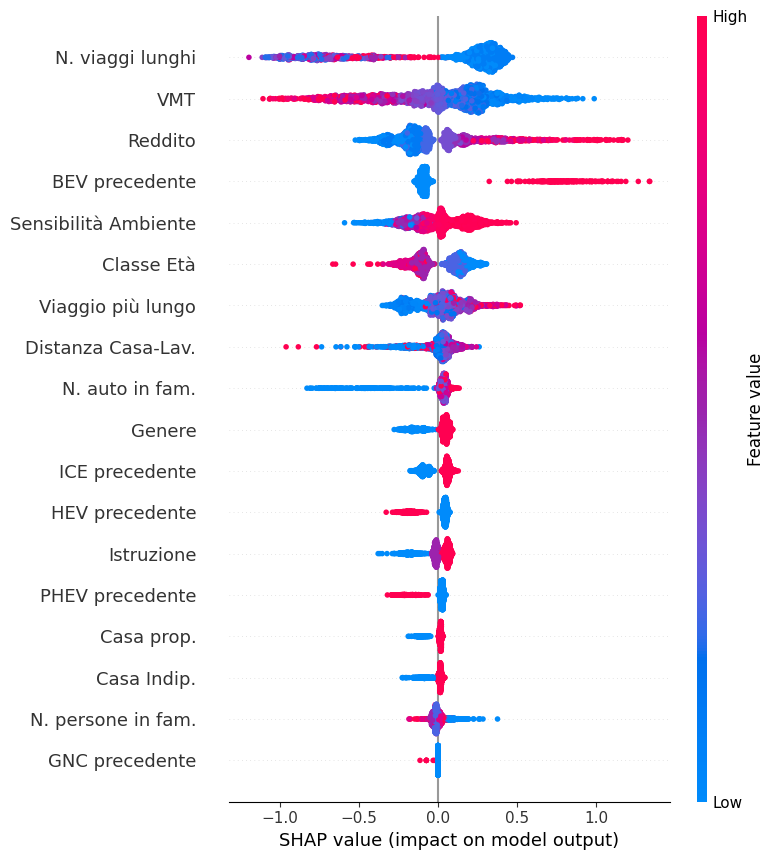

In [ ]:
plt.figure(figsize=(14, 10))
shap.summary_plot(shap_values, X_test, feature_names=abbreviated_columns, show=False)
plt.savefig('shap_summary_plot.png', dpi=300)
plt.show()

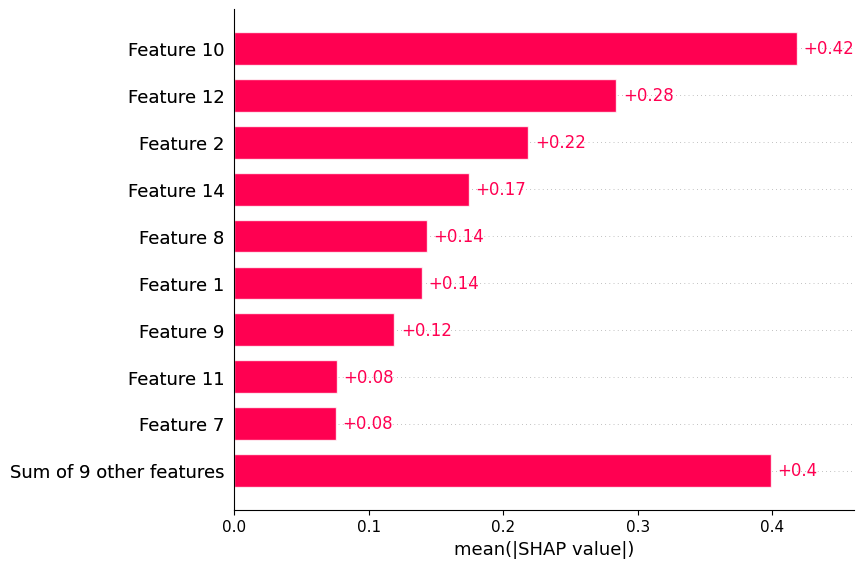

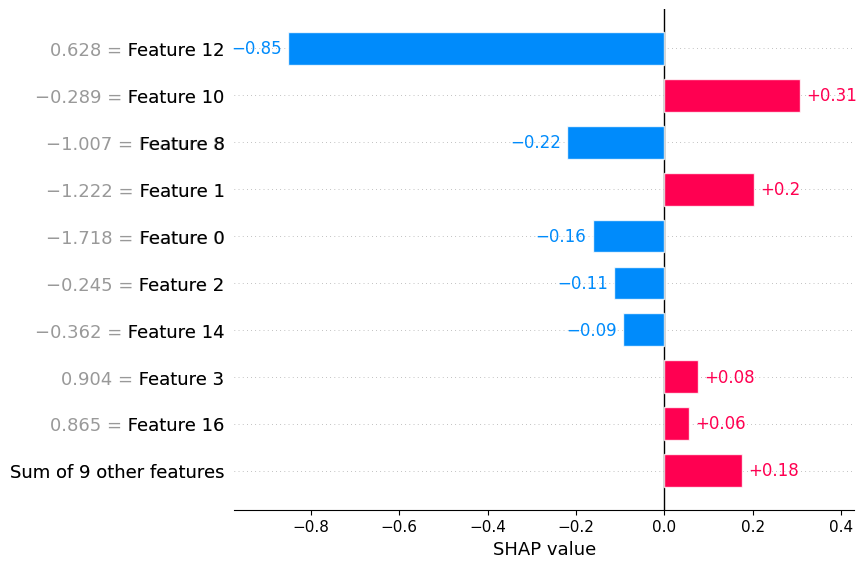

In [ ]:
shap_values_explanation = explainer(X_test)
shap.plots.bar(shap_values_explanation, show=True)
shap.plots.bar(shap_values_explanation[10], show=True) #Var: N. viaggi lunghi

In [ ]:
fig_imp_feat.write_image("Importanza_Features.pdf")
fig_shap_bar.write_image("Importanza_Features_SHAP.pdf")
#fig_shap_beeswarm.write_image("Importanza_Features_SHAP_beeswarm.pdf")

## 4.3. Gradient Boosting con var + imp

In [ ]:
X_reduced

In [ ]:
X_reduced_scaled = sc.fit_transform(X_reduced)
X_train_reduced, X_test_reduced, y_train_reduced, y_test_reduced = train_test_split(X_reduced_scaled, y, test_size=0.2, random_state=42)


```
Tempo per Grid Search +60 min
```

```
param_grid = {
    'n_estimators': [200, 250,300],  # Numero di alberi
    'learning_rate': [0.01, 0.05, 0.1, 1],  # Tasso di apprendimento
    'max_depth': [1, 2, 3],  # Profondità massima degli alberi
    'subsample': [0.5, 0.7, 0.8],  # Percentuale di dati da usare per ogni albero
    'min_samples_split': [2, 5, 10]  # Minimo numero di campioni richiesti per dividere un nodo
}
grid_search_gb_red = GridSearchCV(estimator=gb, param_grid=param_grid, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')
grid_search_gb_red.fit(X_train_reduced, y_train_reduced)
```

OUTPUT:

```
GradientBoostingClassifier(learning_rate=0.05, n_estimators=200, subsample=0.7)
```



In [ ]:
#SAVE MODEL su google drive and LOAD....
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting Reduced/'
"""
joblib.dump(grid_search_gb_red.best_params_, drive_path + 'best_params_gbred_gs.pkl')
joblib.dump(grid_search_gb_red.best_score_, drive_path + 'best_score_gbred_gs.pkl')
joblib.dump(grid_search_gb_red.best_estimator_, drive_path + 'best_estimator_gbred_gs.pkl')
joblib.dump(grid_search_gb_red, drive_path + 'best_model_gbred.pkl')
"""
best_params_gb_red = joblib.load(drive_path + 'best_params_gbred_gs.pkl')
best_score_gb_red = joblib.load(drive_path +'best_score_gbred_gs.pkl')
best_estimator_gb_red = joblib.load(drive_path +'best_estimator_gbred_gs.pkl')
best_model_gb_red = joblib.load(drive_path + 'best_model_gbred.pkl')

#MIGLIORI PARAMETRI E ACCURACY
print("Migliori parametri:", best_estimator_gb_red)
print(f"\nMiglior punteggio (accuracy): {best_score_gb_red:.4f}")
y_pred_gb_red_gs = best_estimator_gb_red.predict(X_test_reduced)
accuracy_gb_red_gs = accuracy_score(y_test_reduced, y_pred_gb_red_gs)
print(f"\nAccuratezza dell modello con Grid Search: {accuracy_gb_red_gs:.4f} \n")
best_estimator_gb_red

Migliori parametri: GradientBoostingClassifier(learning_rate=0.05, n_estimators=200, subsample=0.7)

Miglior punteggio (accuracy): 0.6763

Accuratezza dell modello con Grid Search: 0.6735 



GradientBoostingClassifier(learning_rate=0.05, n_estimators=200, subsample=0.7)

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Gradient Boosting Reduced/'

#DOWNLOAD MODEL
#"""
joblib.dump(cv_results_gb_red, drive_path + 'cv_results_gb_red.pkl')
"""
#UPLOAD MODEL

cv_results_gb_red = joblib.load(drive_path + 'cv_results_gb_red.pkl')
"""

"\n#UPLOAD MODEL\n\ncv_results_gb_red = joblib.load(drive_path + 'cv_results_gb_red.pkl')\n"

In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
cv_results_gb_red = cross_validate(best_estimator_gb_red, X_train_reduced, y_train_reduced, cv=stratified_kfold, return_estimator=True)


best_model_gb_red1  = cv_results_gb_red ['estimator'][np.argmax(cv_results_gb_red ['test_score'])]
y_pred_gb_red = best_model_gb_red1.predict(X_test_reduced)

test_accuracy_gb_red = accuracy_score(y_test_reduced, y_pred_gb_red)
print(f"Accuratezza finale sul test set: {test_accuracy_gb_red:.4f}")

Accuratezza finale sul test set: 0.6740


In [ ]:
n_splits = 15
stratified_kfold = StratifiedKFold(n_splits=n_splits)
train_size, train_score, test_score = learning_curve(best_estimator_gb_red, X_train_reduced, y_train_reduced, cv=stratified_kfold,n_jobs=-1,
                                                     train_sizes=np.linspace(0.1, 1.0, 25))

train_mean = np.mean(train_score, axis=1)
train_std = np.std(train_score, axis=1)
test_mean = np.mean(test_score, axis=1)
test_std = np.std(test_score, axis=1)

In [ ]:
test_mean

array([0.63894737, 0.64725146, 0.65578947, 0.65461988, 0.65824561,
       0.66222222, 0.66210526, 0.66526316, 0.66549708, 0.66374269,
       0.6671345 , 0.66725146, 0.66923977, 0.66619883, 0.67192982,
       0.66982456, 0.67239766, 0.67134503, 0.67146199, 0.67391813,
       0.67263158, 0.67146199, 0.67263158, 0.67298246, 0.6748538 ])

In [ ]:
fig_learning_curve = go.Figure()
fig_learning_curve.add_trace(go.Scatter(x=train_size, y=train_mean, mode='lines', name='Training Accuracy', line=dict(color='blue')))
fig_learning_curve.add_trace(go.Scatter(x=train_size, y=test_mean, mode='lines', name='Test Accuracy', line=dict(color='red')))
fig_learning_curve.add_trace(go.Scatter( #area di confidenza per la curva di train (Train Accuracy)
    x=np.concatenate([train_size, train_size[::-1]]),  # Unire le dimensioni per il riempimento
    y=np.concatenate([train_mean - train_std, (train_mean + train_std)[::-1]]),  # Unire i valori per la confidenza
    fill='toself',  # Riempimento sotto la curva
    fillcolor='rgba(0, 0, 255, 0.1)',  # Colore trasparente per l'area di confidenza
    line=dict(color='rgba(255, 255, 255, 0)'),  # Invisibile per l'area
    name='Training Accuracy Confidence Interval'))

fig_learning_curve.add_trace(go.Scatter( #area di confidenza per la curva di test (Test Accuracy)
    x=np.concatenate([train_size, train_size[::-1]]),  # Unire le dimensioni per il riempimento
    y=np.concatenate([test_mean - test_std, (test_mean + test_std)[::-1]]),  # Unire i valori per la confidenza
    fill='toself',  # Riempimento sotto la curva
    fillcolor='rgba(255, 0, 0, 0.1)',  # Colore trasparente per l'area di confidenza
    line=dict(color='rgba(255, 255, 255, 0)'),  # Invisibile per l'area
    name='Test Accuracy Confidence Interval'))

fig_learning_curve.update_layout(
    title= {'text': "Learning Curves",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title='Training Set Size',yaxis_title='Accuracy',showlegend=True,
    width=1200,height=800,xaxis=dict(showgrid=True,zeroline=False), yaxis=dict(showgrid=True,zeroline=False))

fig_learning_curve.show()

In [ ]:
print("Report di classificazione:")
class_repost_gb_red = classification_report(y_test_reduced, y_pred_gb_red)
print(class_repost_gb_red)

f1score_gb_red = f1_score(y_test_reduced, y_pred_gb_red)
recallscore_gb_red = recall_score(y_test_reduced, y_pred_gb_red)
precisionscore_gb_red = precision_score(y_test_reduced, y_pred_gb_red)
y_prob_gb_red = best_model_gb_red1.predict_proba(X_test_reduced)[:, 1]
fpr_gb_red, tpr_gb_red, thresholds_gb_red = roc_curve(y_test_reduced, y_prob_gb_red)
precision_gb_red, recall_gb_red, thresholds_p_gb_red = precision_recall_curve(y_test_reduced, y_prob_gb_red)
auc_gb_red = roc_auc_score(y_test_reduced, y_prob_gb_red)
print(f"\nF1 Score: {f1score_gb_red:.4f}")
print(f"\nRecall: {recallscore_gb_red:.4f}")
print(f"\nPrecision: {precisionscore_gb_red:.4f}")
print(f"\nAUC ROC (Area Under the Curve): {auc_gb_red:.4f}")

Report di classificazione:
              precision    recall  f1-score   support

         0.0       0.68      0.56      0.61       988
         1.0       0.67      0.77      0.72      1150

    accuracy                           0.67      2138
   macro avg       0.67      0.67      0.67      2138
weighted avg       0.67      0.67      0.67      2138


F1 Score: 0.7184

Recall: 0.7730

Precision: 0.6709

AUC ROC (Area Under the Curve): 0.7384


In [ ]:
cm_gb_red = confusion_matrix(y_test_reduced, y_pred_gb_red)
fig_cm_gb_red = go.Figure(data=go.Heatmap(z=cm_gb_red,x=list(set(y_pred_gb_red)),y=list(set(y_test_reduced)),colorscale='Blues',colorbar=dict(title='Conteggio'),))
for i in range(len(cm_gb_red)):
    for j in range(len(cm_gb_red[i])):
        cell_value = cm_gb_red[i][j]
        text_color = 'white' if cell_value > 700  else 'black'
        fig_cm_gb_red.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center" )

fig_cm_gb_red.update_layout(yaxis=dict(autorange='reversed', tickmode='array',  tickvals=sorted(set(y_test_reduced)),),
    xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_gb_red)),),
    title= {'text': "Matrice di Confusione",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Classe Predetta", yaxis_title="Classe Reale", width=600,height=600,)

In [ ]:
cm_gb_red

array([[552, 436],
       [261, 889]])

In [ ]:
fig_hist_gb_red = px.histogram(x=y_prob_gb_red, color=y_test, nbins=50,labels=dict(color='True Labels', x='Score'))
fig_hist_gb_red.show()

df_red = pd.DataFrame({'False Positive Rate': fpr_gb_red,'True Positive Rate': tpr_gb_red}, index=thresholds_gb_red)
df_red.index.name = "Thresholds"
df_red.columns.name = "Rate"

fig_riassunto_gb_red = make_subplots(rows=1, cols=3, row_heights=[1],shared_xaxes=True,shared_yaxes=True,
    subplot_titles=("TPR e FPR per threshold", f"ROC Curve (AUC={round(auc_gb_red,2):.2f})", f"PR Curve (AUC={round(auc(recall_gb_red, precision_gb_red),2):.2f})"))

fig_thresh_gb_red = px.line(df_red, title='TPR and FPR at every threshold',)
fig_thresh_gb_red.update_yaxes(scaleanchor="x", scaleratio=1)
fig_thresh_gb_red.update_xaxes(range=[0, 1], constrain='domain')
for d in fig_thresh_gb_red.data:  # Add traces from fig_thresh_gb1
    fig_riassunto_gb_red.add_trace(d, row=1, col=1)

fig_gb_red = px.area(x=fpr_gb_red, y=tpr_gb_red,title=f'ROC Curve (AUC={auc_gb_red:.4f})',labels=dict(x='False Positive Rate', y='True Positive Rate'))
fig_gb_red.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=0, y1=1)
fig_gb_red.update_yaxes(scaleanchor="x", scaleratio=1)
fig_gb_red.update_xaxes(constrain='domain')
for d in fig_gb_red.data:  # Add traces from fig_gb1
    fig_riassunto_gb_red.add_trace(d, row=1, col=2)

fig_precision_gb_red = px.area(x=recall_gb_red, y=precision_gb_red,title=f'Precision-Recall Curve (AUC={auc(recall_gb_red, precision_gb_red):.4f})',labels=dict(x='Recall', y='Precision'),)
fig_precision_gb_red.add_shape(type='line', line=dict(dash='dash'),x0=0, x1=1, y0=1, y1=0)
fig_precision_gb_red.update_yaxes(scaleanchor="x", scaleratio=1)
fig_precision_gb_red.update_xaxes(constrain='domain')
for d in fig_precision_gb_red.data:  # Add traces from fig_precision_gb1
    fig_riassunto_gb_red.add_trace(d, row=1, col=3)

diagonal_line_1 = go.Scatter(x=[0, 1], y=[0, 1],mode='lines',line=dict(dash='dash', color='black'))
diagonal_line_2 = go.Scatter(x=[0, 1], y=[1, 0],mode='lines',line=dict(dash='dash', color='black'))
fig_riassunto_gb_red.add_trace(diagonal_line_1, row=1, col=2)
fig_riassunto_gb_red.add_trace(diagonal_line_2, row=1, col=3)

fig_riassunto_gb_red.update_layout(height=500,  width=1200, showlegend=True)
fig_riassunto_gb_red.update_xaxes(title_text="Thresholds", row=1, col=1)
fig_riassunto_gb_red.update_yaxes(title_text="Value", row=1, col=1)
fig_riassunto_gb_red.update_xaxes(title_text="False Positive Rate", row=1, col=2)
fig_riassunto_gb_red.update_yaxes(title_text="True Positive Rate", row=1, col=2)
fig_riassunto_gb_red.update_xaxes(title_text="Recall", row=1, col=3)
fig_riassunto_gb_red.update_yaxes(title_text="Precision", row=1, col=3)

fig_riassunto_gb_red.show()

In [ ]:
#fig_riassunto_gb_red.write_image("Riassunto GB RedM.pdf")
#fig_hist_gb_red.write_image("True_Lable_GB_RedM.pdf")
#fig_cm_gb_red.write_image("CM_GB_RedM.png", scale=5)
#fig_learning_curve.write_image("Learning_Curve_GB_RedM.pdf")

# **5. Reti Neurali: DL**

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)
modellino =Sequential()
modellino.add(Input(shape=(X_train.shape[1],)))
modellino.add(Dense(1, activation="relu"))

modellino.add(Dense(200, activation="relu"))
modellino.add(Dense(1, activation = "sigmoid"))

modellino.compile(optimizer='adam', #. 'adam'    'SGD'
              loss='binary_crossentropy',
              metrics=['accuracy']
              )

modellino.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 1)                   │              19 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 200)                 │             400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             201 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 620 (2.42 KB)

 Trainable params: 620 (2.42 KB)

 Non-trainable params: 0 (0.00 B)

## 5.1. Modello di Base
Questo paragrafo descrive il primo modello ANN, che è piuttosto semplice e senza regolarizzazioni aggiuntive.

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'

#DOWNLOAD MODEL
"""
model1.save(drive_path + 'model1_full_model.keras')

"""
#UPLOAD MODEL

model_loaded_1 = load_model(drive_path + 'model1_full_model.keras')
#"""

/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:713: UserWarning:

Skipping variable loading for optimizer 'rmsprop', because it has 12 variables whereas the saved optimizer has 22 variables. 



In [ ]:
X_train.shape[1]

18

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

model1 = Sequential()
model1.add(Dense(16, input_dim=X_train.shape[1], activation="relu"))
model1.add(Dropout(0.2))
model1.add(Dense(64, activation="relu"))
model1.add(Dropout(0.2))
model1.add(Dense(128, activation="relu"))
model1.add(Dropout(0.2))
model1.add(Dense(64, activation="relu"))
model1.add(Dropout(0.2))
model1.add(Dense(1, activation="sigmoid")) #OR model.add(Dense(2, activation="softmax")

model1.compile(optimizer='adam', #. 'adam'    'SGD'
              loss='binary_crossentropy',
              metrics=['accuracy']
              )

model1.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 16)                  │             304 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 16)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           1,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,033 (70.44 KB)

 Trainable params: 18,033 (70.44 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
model1.save_weights('model1_weights.weights.keras')

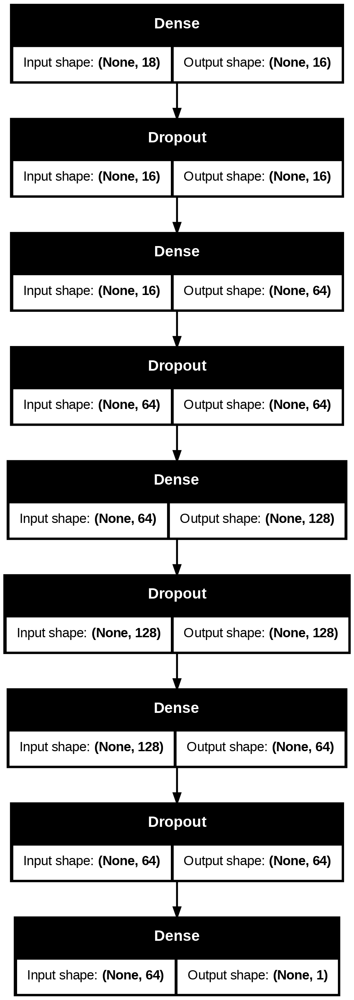

In [ ]:
plot_model(model1, show_shapes=True)

In [ ]:
epoche= 300
n_batch_size = 64
history1 = model1.fit(X_train,y_train,
                      validation_data=(X_test,y_test),
                      batch_size=n_batch_size,
                      verbose=2,
                      epochs=epoche)

Epoch 1/300
134/134 - 2s - 16ms/step - accuracy: 0.6972 - loss: 0.5830 - val_accuracy: 0.6333 - val_loss: 0.6528
Epoch 2/300
134/134 - 2s - 17ms/step - accuracy: 0.6956 - loss: 0.5807 - val_accuracy: 0.6319 - val_loss: 0.6501
Epoch 3/300
134/134 - 3s - 20ms/step - accuracy: 0.7021 - loss: 0.5776 - val_accuracy: 0.6272 - val_loss: 0.6609
Epoch 4/300
134/134 - 2s - 15ms/step - accuracy: 0.6995 - loss: 0.5819 - val_accuracy: 0.6305 - val_loss: 0.6534
Epoch 5/300
134/134 - 2s - 16ms/step - accuracy: 0.7005 - loss: 0.5749 - val_accuracy: 0.6338 - val_loss: 0.6539
Epoch 6/300
134/134 - 1s - 9ms/step - accuracy: 0.6982 - loss: 0.5801 - val_accuracy: 0.6296 - val_loss: 0.6589
Epoch 7/300
134/134 - 1s - 10ms/step - accuracy: 0.6981 - loss: 0.5769 - val_accuracy: 0.6333 - val_loss: 0.6580
Epoch 8/300
134/134 - 2s - 18ms/step - accuracy: 0.6973 - loss: 0.5831 - val_accuracy: 0.6352 - val_loss: 0.6553
Epoch 9/300
134/134 - 1s - 8ms/step - accuracy: 0.6971 - loss: 0.5808 - val_accuracy: 0.6366 - va

In [ ]:
print(f"I casi presenti nel dataset:{len(X)}, \n essendo che la batch size è di {n_batch_size}, serviranno {len(X)/n_batch_size} passaggi per completare un'epoca ")

I casi presenti nel dataset:10688, 
 essendo che la batch size è di 64, serviranno 167.0 passaggi per completare un'epoca 


In [ ]:
loss, acc = model1.evaluate(X_test, y_test)
print("Loss sul test set: %.4f" % loss)
print("Accuracy sul test set: %.4f" % acc)

67/67 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.6128 - loss: 0.6869
Loss sul test set: 0.6696
Accuracy sul test set: 0.6268


In [ ]:
loss1 = history1.history['loss']
val_loss1 = history1.history['val_loss']
accuracy1 = history1.history['accuracy']
val_accuracy1 = history1.history['val_accuracy']

fig_ann_1 = make_subplots(rows=2, cols=1,vertical_spacing=0.15,subplot_titles=("Loss and Validation Loss", "Accuracy and Validation Accuracy"),row_heights=[0.45, 0.45])
fig_ann_1.add_trace(go.Scatter(x=list(range(len(loss1))), y=loss1, mode='lines', name='Loss'),row=1, col=1)
fig_ann_1.add_trace(go.Scatter(x=list(range(len(val_loss1))), y=val_loss1, mode='lines', name='Validation Loss'),row=1, col=1)
fig_ann_1.add_trace(go.Scatter(x=list(range(len(accuracy1))), y=accuracy1, mode='lines', name='Accuracy'),row=2, col=1)
fig_ann_1.add_trace(go.Scatter(x=list(range(len(val_accuracy1))), y=val_accuracy1, mode='lines', name='Validation Accuracy'),row=2, col=1)

fig_ann_1.update_layout(
    title= {'text': "Loss, Validation Loss, Accuracy, and Validation Accuracy",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Epochs",showlegend=True,width=1200,height=800,)
fig_ann_1.show()

In [ ]:
df_ann_1_result = pd.DataFrame({'loss2': loss1, 'val_loss2': val_loss1,
                   'accuracy2': accuracy1, 'val_accuracy2': val_accuracy1})
#drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'
#df_ann_1_result.to_csv(drive_path + 'df_ann_1_result.csv', index=False)

In [ ]:
fig_ann_1.write_image("Loss_Validation_Loss_Accuracy_Validation_Accuracy.pdf")

Serve una early stop per prevenire l'overfitting, fermando l'addestramento quando le prestazioni sui dati di validazione smettono di migliorare, evitando così che il modello impari troppo specificamente dai dati di addestramento e perda capacità di generalizzazione.

Dopo le prime epoche l'accuratezza del train migliora, mentra quella del validation no, anzi tende a peggiorare.

In [ ]:
early_stop = EarlyStopping(monitor='val_loss',
                           min_delta=1e-6,
                           patience=10,
                           mode='auto',
                           restore_best_weights=True)
epoche= 300
n_batch_size = 64
history1_bis = model1.fit(X_train,y_train,
                      validation_data=(X_test,y_test),
                      callbacks=[early_stop],
                      batch_size=n_batch_size,
                      verbose=0,
                      epochs=epoche)

In [ ]:
loss, acc = model1.evaluate(X_test, y_test)
print("Loss sul test set: %.4f" % loss)
print("Accuracy sul test set: %.4f" % acc)

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6067 - loss: 0.6872
Loss sul test set: 0.6627
Accuracy sul test set: 0.6324


In [ ]:
pred = model1.predict(X_test)
predict_classes = (pred > 0.5).astype(int)
expected_classes = y_test.values
correct = accuracy_score(expected_classes,predict_classes)
print(f"Accuracy: {correct}")

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
Accuracy: 0.6323666978484564


In [ ]:
loss1_bis = history1_bis.history['loss']
val_loss1_bis = history1_bis.history['val_loss']
accuracy1_bis = history1_bis.history['accuracy']
val_accuracy1_bis = history1_bis.history['val_accuracy']

fig_ann_1_bis = make_subplots(rows=2, cols=1,vertical_spacing=0.15,row_heights=[0.45, 0.45])
fig_ann_1_bis.add_trace(go.Scatter(x=list(range(len(loss1_bis))), y=loss1_bis, mode='lines', name='Loss'),row=1, col=1)
fig_ann_1_bis.add_trace(go.Scatter(x=list(range(len(val_loss1_bis))), y=val_loss1_bis, mode='lines', name='Validation Loss'),row=1, col=1)
fig_ann_1_bis.add_trace(go.Scatter(x=list(range(len(accuracy1_bis))), y=accuracy1_bis, mode='lines', name='Accuracy'),row=2, col=1)
fig_ann_1_bis.add_trace(go.Scatter(x=list(range(len(val_accuracy1_bis))), y=val_accuracy1_bis, mode='lines', name='Validation Accuracy'),row=2, col=1)

fig_ann_1_bis.update_layout(
    title= {'text': "Loss, Validation Loss, Accuracy, and Validation Accuracy",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Epochs",showlegend=True,width=1200,height=800,)
fig_ann_1_bis.show()

In [ ]:
fig_ann_1_bis.write_image("Loss_Validation_Loss_Accuracy_Validation_Accuracy_bis.pdf")

In [ ]:
df_ann_1_bis_result = pd.DataFrame({'loss2': loss1_bis, 'val_loss2': val_loss1_bis,
                   'accuracy2': accuracy1_bis, 'val_accuracy2': val_accuracy1_bis})
#drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'
#df_ann_1_bis_result.to_csv(drive_path + 'df_ann_1_bis_result.csv', index=False)

In [ ]:
accuracy = accuracy_score(y_test, predict_classes)
report = classification_report(y_test, predict_classes)
conf_matrix = confusion_matrix(y_test, predict_classes)
print("Accuracy:", accuracy)
print("\nClassification Report:\n", report)
print("\nConfusion Matrix:\n", conf_matrix)

Accuracy: 0.6323666978484564

Classification Report:
               precision    recall  f1-score   support

         0.0       0.63      0.52      0.57       996
         1.0       0.64      0.73      0.68      1142

    accuracy                           0.63      2138
   macro avg       0.63      0.63      0.62      2138
weighted avg       0.63      0.63      0.63      2138


Confusion Matrix:
 [[517 479]
 [307 835]]


## 5.2. Feature Engineering

In [ ]:
###Preprocessing e Feature Engineering
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X_scaled)

selector = SelectKBest(score_func=f_classif, k='all')
X_selected = selector.fit_transform(X_poly, y)

In [ ]:
X_poly.shape

(10688, 189)

In [ ]:
from scikeras.wrappers import KerasClassifier

In [ ]:
def create_model(input_dim):
    model = Sequential()
    model.add(Input(shape=(input_dim,)))
    model.add(Dense(12, activation='relu'))
    model.add(Dense(8, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

k_values = range(1, X_poly.shape[1] + 1)

best_k = 0
best_score = 0

kf = KFold(n_splits=2, shuffle=True, random_state=42)

for k in k_values: # validazione incrociata per ogni valore di k
    selector = SelectKBest(score_func=f_classif, k=k)
    X_selected = selector.fit_transform(X_poly, y)

    fold_scores = []

    for train_index, test_index in kf.split(X_selected):
        X_train, X_test = X_selected[train_index], X_selected[test_index]
        y_train, y_test = y[train_index], y[test_index]

        input_dim = X_train.shape[1]
        model_fe = create_model(input_dim)
        early_stopping = EarlyStopping(monitor='loss', patience=3, restore_best_weights=True)
        model_fe.fit(X_train, y_train, epochs=50, batch_size=10, verbose=0, callbacks=[early_stopping])
        score = model_fe.evaluate(X_test, y_test, verbose=0)[1]
        fold_scores.append(score)

    mean_score = np.mean(fold_scores)

    if mean_score > best_score:
        best_score = mean_score
        best_k = k

print(f"Il miglior numero di caratteristiche (k) è: {best_k} con un punteggio di {best_score}")
selector = SelectKBest(score_func=f_classif, k=best_k)
X_selected = selector.fit_transform(X_poly, y)

scores = selector.scores_ # punteggi delle caratteristiche
print(f"Le feature selezionate sono: {X.columns[selector.get_support()].tolist()}")
print("\nPunteggi delle caratteristiche:", scores)

KeyboardInterrupt: 

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)

## 5.3. Modello con Regolarizzazioni e Riduzione del Learning Rate
 Qui viene descritto il secondo modello, che include le regolarizzazioni L1 e L2 e l'uso di Reduce Learning Rate. Inoltre per questo modello e il successivo è stata condotta una Feature Engineering.

In [ ]:


drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'

# Define custom_objects dictionary
custom_objects = {'LeakyReLU': LeakyReLU(negative_slope=0.3)}

# Load the model with custom_objects
model2 = load_model(drive_path + 'model2_full_model.keras', custom_objects=custom_objects)

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

model2 = Sequential()

Reg_l1= 0.001
Reg_l2 =0.001
DP_out = 0.3
#Input layer
model2.add(Input(shape=(X_train.shape[1],)))

#Hidden layer
model2.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2.add(Dropout(DP_out))
model2.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2.add(Dropout(DP_out))
model2.add(Dense(256, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2.add(Dropout(DP_out))
model2.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2.add(Dropout(DP_out))
model2.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2.add(BatchNormalization())
model2.add(Dropout(DP_out))

# Output layer
model2.add(Dense(1, activation="sigmoid"))

model2.compile(optimizer=Adam(learning_rate=0.001),loss='binary_crossentropy',metrics=['accuracy', AUC(), Precision(), Recall()])
model2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │          12,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 94,977 (371.00 KB)

 Trainable params: 94,849 (370.50 KB)

 Non-trainable params: 128 (512.00 B)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
early_stop = EarlyStopping(monitor='val_loss',min_delta=1e-5,patience=20,verbose=1,mode='auto',restore_best_weights=True)
epoche=400
n_batch_size =32
history2 = model2.fit(X_train,y_train,validation_data=(X_test,y_test),
                      epochs=epoche,batch_size=n_batch_size,verbose=1,
                      callbacks=[early_stop, reduce_lr])

Epoch 1/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 13s 17ms/step - accuracy: 0.5367 - auc: 0.5356 - loss: 7.1649 - precision: 0.5669 - recall: 0.6195 - val_accuracy: 0.5688 - val_auc: 0.6368 - val_loss: 4.9143 - val_precision: 0.5594 - val_recall: 0.9339 - learning_rate: 0.0010
Epoch 2/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - accuracy: 0.5632 - auc: 0.5741 - loss: 4.3219 - precision: 0.5816 - recall: 0.6941 - val_accuracy: 0.5435 - val_auc: 0.6578 - val_loss: 2.6808 - val_precision: 0.5410 - val_recall: 0.9983 - learning_rate: 0.0010
Epoch 3/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - accuracy: 0.6051 - auc: 0.6256 - loss: 2.3457 - precision: 0.6132 - recall: 0.7374 - val_accuracy: 0.5603 - val_auc: 0.6655 - val_loss: 1.5458 - val_precision: 0.5522 - val_recall: 0.9652 - learning_rate: 0.0010
Epoch 4/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - accuracy: 0.6242 - auc: 0.6602 - loss: 1.3815 - precision: 0.6248 - recall: 0.7685 - val_accuracy: 0.5926 - val_auc: 0.6744 - val_loss: 1.0

In [ ]:
print(f"I casi presenti nel dataset:{len(X)}, \n essendo che la batch size è di {n_batch_size}, serviranno {len(X)/n_batch_size} passaggi per completare un'epoca ")

I casi presenti nel dataset:10688, 
 essendo che la batch size è di 32, serviranno 334.0 passaggi per completare un'epoca 


In [ ]:
loss_model2, accuracy_model2, auc_model2, precision_model2, recall_model2 = model2.evaluate(X_test, y_test)
print(f"Metriche:\n  - Accuracy: {accuracy_model2},\n  - Loss: {loss_model2},\n  - AUC: {auc_model2},\n  - Precision: {precision_model2},\n  - Recall: {recall_model2}")

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.6583 - auc: 0.7108 - loss: 0.6470 - precision: 0.6735 - recall: 0.7279
Metriche:
  - Accuracy: 0.6534144282341003,
  - Loss: 0.6558919548988342,
  - AUC: 0.7023433446884155,
  - Precision: 0.6588966846466064,
  - Recall: 0.7373912930488586


In [ ]:
loss2 = history2.history['loss']
val_loss2 = history2.history['val_loss']
accuracy2 = history2.history['accuracy']
val_accuracy2 = history2.history['val_accuracy']

fig_ann_2 = make_subplots(rows=2, cols=1,vertical_spacing=0.15,subplot_titles=("Loss and Validation Loss", "Accuracy and Validation Accuracy"), row_heights=[0.45, 0.45])
fig_ann_2.add_trace(go.Scatter(x=list(range(len(loss2))), y=loss2, mode='lines', name='Loss'),row=1, col=1)
fig_ann_2.add_trace(go.Scatter(x=list(range(len(val_loss2))), y=val_loss2, mode='lines', name='Validation Loss'),row=1, col=1)
fig_ann_2.add_trace(go.Scatter(x=list(range(len(accuracy2))), y=accuracy2, mode='lines', name='Accuracy'),row=2, col=1)
fig_ann_2.add_trace(go.Scatter(x=list(range(len(val_accuracy2))), y=val_accuracy2, mode='lines', name='Validation Accuracy'),row=2, col=1)

fig_ann_2.update_layout(
    title= {'text': "Loss, Validation Loss, Accuracy, and Validation Accuracy",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Epochs",showlegend=True,width=1200,height=800,)
fig_ann_2.show()

In [ ]:
df_ann_2_result = pd.DataFrame({'loss2': loss2, 'val_loss2': val_loss2,
                   'accuracy2': accuracy2, 'val_accuracy2': val_accuracy2})
df_ann_2_result

,loss2,val_loss2,accuracy2,val_accuracy2
0,6.420903,4.914318,0.540702,0.568756
1,3.747075,2.680837,0.572281,0.543499
2,2.045278,1.545757,0.599064,0.560337
3,1.257670,1.053104,0.619298,0.592610
4,0.934507,0.844410,0.612515,0.630028
...,...,...,...,...
85,0.655473,0.656231,0.661988,0.647334
86,0.650026,0.656324,0.672398,0.646398
87,0.653561,0.656317,0.663977,0.647334
88,0.653937,0.656446,0.659649,0.649673


In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'
df_ann_2_result.to_csv(drive_path + 'df_ann_2_result.csv', index=False)

In [ ]:
y_pred_prob2 = model2.predict(X_test)
y_pred2 = (y_pred_prob2 > 0.5).astype(int)
cm2 = confusion_matrix(y_test, y_pred2)
#cm2

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


In [ ]:
#    [[549, 439],
#     [302, 848]]

In [ ]:
class_report_ann2 = classification_report(y_test, y_pred2)
print(class_report_ann2)

              precision    recall  f1-score   support

         0.0       0.63      0.56      0.59       988
         1.0       0.65      0.72      0.69      1150

    accuracy                           0.64      2138
   macro avg       0.64      0.64      0.64      2138
weighted avg       0.64      0.64      0.64      2138



In [ ]:
y_test_list = y_test.tolist()
y_pred_list2 = y_pred2.flatten().tolist()

fig_cm_ann2 = go.Figure(data=go.Heatmap(z=cm2, x=list(set(y_pred_list2)), y=list(set(y_test_list)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm2)):
    for j in range(len(cm2[i])):
        cell_value = cm2[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_ann2.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

fig_cm_ann2.update_layout(yaxis=dict(autorange='reversed', tickmode='array', tickvals=sorted(set(y_test_list))),
                     xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_list2))),
                     title={'text': "Matrice di Confusione: modello 2", 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                     xaxis_title="Classe Predetta", yaxis_title="Classe Reale", width=600, height=600)

fig_cm_ann2.show()

In [ ]:
print(f"Precision class_0.model1: {549/(302+549):.4f}")
print(f"Precision class_0.model2: {562/(320+562):.4f}")
print(f"\nPrecision class_1.model1: {848/(439+848):.4f}")
print(f"Precision class_1.model2: {830/(830+426):.4f}")
print("_________________________________")
print(f"\nRecall class_0.model1: {549/(439+549):.4f}")
print(f"Recall class_0.model2: {562/(426+562):.4f}")
print(f"\nRecall class_1.model1: {848/(302+848):.4f}")
print(f"Recall class_1.model2: {830/(830+320):.4f}")

Precision class_0.model1: 0.6451
Precision class_0.model2: 0.6372

Precision class_1.model1: 0.6589
Precision class_1.model2: 0.6608
_________________________________

Recall class_0.model1: 0.5557
Recall class_0.model2: 0.5688

Recall class_1.model1: 0.7374
Recall class_1.model2: 0.7217


In [ ]:
# Predizioni del modello
y_pred2_rv = model2.predict(X_test).ravel()

# Calcolo ROC curve e AUC
nn_fpr_keras, nn_tpr_keras, nn_thresholds_keras = roc_curve(y_test, y_pred2_rv)
auc_keras = auc(nn_fpr_keras, nn_tpr_keras)

fig_roc_ann2 = go.Figure()

fig_roc_ann2.add_trace(go.Scatter(
    x=nn_fpr_keras,
    y=nn_tpr_keras,
    mode='lines+markers',
    name='Neural Network (AUC = %0.3f)' % auc_keras,
    marker=dict(symbol='circle', size=3)))

fig_roc_ann2.update_layout(
    title={'text': f'ROC Curve: modello 2', 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',legend_title='Legenda' , width=600, height =450, showlegend=True)

fig_roc_ann2.show()

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


In [ ]:
fig_ann_2.write_image("Loss_Validation_Loss_Accuracy_Validation_Accuracy_ann2.pdf")
fig_roc_ann2.write_image("ROC_Curve_ann2.pdf")
fig_cm_ann2.write_image("Matrice_di_confusione_ann2.png", scale=5)

## 5.4. Modello Avanzato con AdamW e Rescheduler del Learning Rate.:
Questo paragrafo riguarda il terzo modello, che include le regolarizzazioni L1 e L2, l'ottimizzatore AdamW e il Rescheduler del Learning Rate.

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'

#DOWNLOAD MODEL
#"""
model3.save(drive_path + 'model3_full_model.keras')
model3.save_weights(drive_path + 'model3_weights.weights.h5')
"""
#UPLOAD MODEL

model3 = load_model(drive_path + 'model3_full_model.keras')
#"""

"\n#UPLOAD MODEL\n\nmodel3 = load_model(drive_path + 'model3_full_model.keras')\n#"

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

model3 = Sequential()

Reg_l1= 0.001
Reg_l2 =0.001
DP_out = 0.3
#Input layer
model3.add(Input(shape=(X_train.shape[1],)))

#Hidden layer
model3.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model3.add(Dropout(DP_out))
model3.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model3.add(Dropout(DP_out))
model3.add(Dense(256, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model3.add(Dropout(DP_out))
model3.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model3.add(Dropout(DP_out))
model3.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model3.add(BatchNormalization())
model3.add(Dropout(DP_out))

# Output layer
model3.add(Dense(1, activation="sigmoid"))
model3.compile(optimizer=AdamW(learning_rate=0.001),loss='binary_crossentropy',metrics=['accuracy', AUC(), Precision(), Recall()])
model3.summary()

####ADAMW
#incorpora la regolarizzazione L2 (anche chiamata weight decay) in modo più corretto.
#model2.compile(optimizer=AdamW(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │          12,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 94,977 (371.00 KB)

 Trainable params: 94,849 (370.50 KB)

 Non-trainable params: 128 (512.00 B)

In [ ]:
### Con learning Ratescheduler
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return float(tf.math.exp(-0.1).numpy()) * lr

reduce_lr = LearningRateScheduler(scheduler)
early_stop = EarlyStopping(monitor='val_loss', min_delta=1e-4, patience=5, verbose=1, mode='auto', restore_best_weights=True)

epoche = 400
n_batch_size = 32

history3 = model3.fit(X_train, y_train, validation_data=(X_test, y_test),
                      epochs=epoche, batch_size=n_batch_size, verbose=1,
                      callbacks=[early_stop, reduce_lr])

Epoch 1/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 14s 12ms/step - accuracy: 0.5299 - auc: 0.5338 - loss: 7.1635 - precision: 0.5625 - recall: 0.5996 - val_accuracy: 0.5458 - val_auc: 0.6205 - val_loss: 4.9359 - val_precision: 0.5426 - val_recall: 0.9922 - learning_rate: 0.0010
Epoch 2/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.5522 - auc: 0.5609 - loss: 4.3634 - precision: 0.5716 - recall: 0.6959 - val_accuracy: 0.5500 - val_auc: 0.6446 - val_loss: 2.7118 - val_precision: 0.5460 - val_recall: 0.9696 - learning_rate: 0.0010
Epoch 3/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 8s 9ms/step - accuracy: 0.5899 - auc: 0.6159 - loss: 2.3524 - precision: 0.5998 - recall: 0.7329 - val_accuracy: 0.5430 - val_auc: 0.6617 - val_loss: 1.5590 - val_precision: 0.5412 - val_recall: 0.9887 - learning_rate: 0.0010
Epoch 4/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - accuracy: 0.6174 - auc: 0.6464 - loss: 1.3777 - precision: 0.6190 - recall: 0.7659 - val_accuracy: 0.6183 - val_auc: 0.6787 - val_loss: 1.03

In [ ]:
loss_model3, accuracy_model3, auc_model3, precision_model3, recall_model3 = model3.evaluate(X_test, y_test)
print(f"\nMetriche del modello avanzato 3:\n  - Accuracy: {accuracy_model3:.4f},\n  - Loss: {loss_model3:.4f},\n  - AUC: {auc_model3:.4f},\n  - Precision: {precision_model3:.4f},\n  - Recall: {recall_model3:.4f}")
print("\n--------------------------------------------")
print(f"\n le metrriche del modello precedente 2 sono: \n  - Accuracy: {accuracy_model2:.4f},\n  - Loss: {loss_model2:.4f},\n  - AUC: {auc_model2:.4f},\n  - Precision: {precision_model2:.4f},\n  - Recall: {recall_model2:.4f}")

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6620 - auc: 0.7102 - loss: 0.6482 - precision: 0.6809 - recall: 0.7199

Metriche del modello avanzato 3:
  - Accuracy: 0.6511,
  - Loss: 0.6594,
  - AUC: 0.6952,
  - Precision: 0.6608,
  - Recall: 0.7217

--------------------------------------------

 le metrriche del modello precedente 2 sono: 
  - Accuracy: 0.6534,
  - Loss: 0.6559,
  - AUC: 0.7023,
  - Precision: 0.6589,
  - Recall: 0.7374


In [ ]:
loss3 = history3.history['loss']
val_loss3 = history3.history['val_loss']
accuracy3 = history3.history['accuracy']
val_accuracy3 = history3.history['val_accuracy']

fig_ann_3 = make_subplots(rows=2, cols=1, vertical_spacing=0.15, subplot_titles=("Loss and Validation Loss", "Accuracy and Validation Accuracy"), row_heights=[0.45, 0.45])
fig_ann_3.add_trace(go.Scatter(x=list(range(len(loss3))), y=loss3, mode='lines', name='Loss'), row=1, col=1)
fig_ann_3.add_trace(go.Scatter(x=list(range(len(val_loss3))), y=val_loss3, mode='lines', name='Validation Loss'), row=1, col=1)
fig_ann_3.add_trace(go.Scatter(x=list(range(len(accuracy3))), y=accuracy3, mode='lines', name='Accuracy'), row=2, col=1)
fig_ann_3.add_trace(go.Scatter(x=list(range(len(val_accuracy3))), y=val_accuracy3, mode='lines', name='Validation Accuracy'), row=2, col=1)

fig_ann_3.update_layout(
    title= {'text': "Loss, Validation Loss, Accuracy, and Validation Accuracy", 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Epochs", showlegend=True, width=1200, height=800)
fig_ann_3.show()

In [ ]:
y_pred_prob3 = model3.predict(X_test)
y_pred3 = (y_pred_prob3 > 0.5).astype(int)

cm3 = confusion_matrix(y_test, y_pred3)
cm3

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


array([[562, 426],
       [320, 830]])

In [ ]:
y_test_list = y_test.tolist()
y_pred_list3 = y_pred3.flatten().tolist()

fig_cm_ann3 = go.Figure(data=go.Heatmap(z=cm3, x=list(set(y_pred_list3)), y=list(set(y_test_list)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm3)):
    for j in range(len(cm3[i])):
        cell_value = cm3[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_ann3.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

fig_cm_ann3.update_layout(yaxis=dict(autorange='reversed', tickmode='array', tickvals=sorted(set(y_test_list))),
                     xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_list3))),
                     title={'text': "Matrice di Confusione: modello 3", 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                     xaxis_title="Classe Predetta", yaxis_title="Classe Reale", width=600, height=600)

fig_cm_ann3.show()

In [ ]:
# Predizioni del modello
y_pred3_rv = model3.predict(X_test).ravel()

# Calcolo ROC curve e AUC
nn_fpr_keras, nn_tpr_keras, nn_thresholds_keras = roc_curve(y_test, y_pred3_rv)
auc_keras = auc(nn_fpr_keras, nn_tpr_keras)

fig_roc_ann3 = go.Figure()

fig_roc_ann3.add_trace(go.Scatter(
    x=nn_fpr_keras,
    y=nn_tpr_keras,
    mode='lines+markers',
    name='Neural Network (AUC = %0.3f)' % auc_keras,
    marker=dict(symbol='circle', size=3)))

fig_roc_ann3.update_layout(
    title={'text': f'ROC Curve: modello 3', 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',legend_title='Legenda' , width=600, height =450, showlegend=True)

fig_roc_ann3.show()

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [ ]:
fig_ann_3.write_image("Loss_Validation_Loss_Accuracy_Validation_Accuracy_ann3.pdf")
fig_roc_ann3.write_image("ROC_Curve_ann3.pdf")
fig_cm_ann3.write_image("Matrice_di_confusione_ann3.png", scale=5)

In [ ]:
df_ann_3_result = pd.DataFrame({'loss3': loss3, 'val_loss3': val_loss3,'accuracy3': accuracy3, 'val_accuracy3': val_accuracy3})
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'
df_ann_3_result.to_csv(drive_path + 'df_ann_3_result.csv', index=False)

## 5.5. Modello RIDOTTO con Regolarizzazioni e Riduzione del Learning Rate

In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'

#DOWNLOAD MODEL
"""
model2_rid.save(drive_path + 'model2_rid_full_model.keras')
model2_rid.save_weights(drive_path + 'model2_rid_weights.weights.h5')
"""
#UPLOAD MODEL
custom_objects = {'LeakyReLU': LeakyReLU(negative_slope=0.3)}
model2_rid = load_model(drive_path + 'model2_rid_full_model.keras', custom_objects=custom_objects)
#"""

In [ ]:
###Preprocessing e Feature Engineering
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_reduced)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X_scaled)

selector = SelectKBest(score_func=f_classif, k='all')
X_selected = selector.fit_transform(X_poly, y)
X_train, X_test, y_train, y_test = train_test_split(X_poly, y, test_size=0.2, random_state=42)
print(X_poly.shape)

(10688, 90)


In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/Model_Reduced_FE/'

joblib.dump(scaler, drive_path + 'scaler.pkl')
joblib.dump(poly, drive_path + 'poly.pkl')
joblib.dump(selector, drive_path + 'selector.pkl')

['/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/Model_Reduced_FE/selector.pkl']

In [ ]:


drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'

# Define custom_objects dictionary
custom_objects = {'LeakyReLU': LeakyReLU(negative_slope=0.3)}

# Load the model with custom_objects
model2 = load_model(drive_path + 'model2_full_model.keras', custom_objects=custom_objects)

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

model2_rid = Sequential()

Reg_l1= 0.001
Reg_l2 =0.001
DP_out = 0.3
#Input layer
model2_rid.add(Input(shape=(X_train.shape[1],)))

#Hidden layer
model2_rid.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2_rid.add(Dropout(DP_out))
model2_rid.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2_rid.add(Dropout(DP_out))
model2_rid.add(Dense(256, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2_rid.add(Dropout(DP_out))
model2_rid.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2_rid.add(Dropout(DP_out))
model2_rid.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
model2_rid.add(BatchNormalization())
model2_rid.add(Dropout(DP_out))

# Output layer
model2_rid.add(Dense(1, activation="sigmoid"))

model2_rid.compile(optimizer=AdamW(learning_rate=0.001),loss='binary_crossentropy',metrics=['accuracy', AUC(), Precision(), Recall()])
model2_rid.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 64)                  │           5,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 64)                  │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 88,641 (346.25 KB)

 Trainable params: 88,513 (345.75 KB)

 Non-trainable params: 128 (512.00 B)

In [ ]:
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)
early_stop = EarlyStopping(monitor='val_loss',min_delta=1e-5,patience=20,verbose=1,mode='auto',restore_best_weights=True)
epoche=400
n_batch_size =32
history2_rid = model2_rid.fit(X_train,y_train,validation_data=(X_test,y_test),
                      epochs=epoche,batch_size=n_batch_size,verbose=1,
                      callbacks=[early_stop, reduce_lr])

Epoch 1/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 6s 8ms/step - accuracy: 0.5216 - auc: 0.5184 - loss: 7.0176 - precision: 0.5557 - recall: 0.5888 - val_accuracy: 0.5613 - val_auc: 0.6600 - val_loss: 5.0656 - val_precision: 0.5524 - val_recall: 0.9722 - learning_rate: 0.0010
Epoch 2/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - accuracy: 0.5764 - auc: 0.5924 - loss: 4.5262 - precision: 0.5931 - recall: 0.6970 - val_accuracy: 0.5599 - val_auc: 0.6711 - val_loss: 2.9609 - val_precision: 0.5509 - val_recall: 0.9835 - learning_rate: 0.0010
Epoch 3/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - accuracy: 0.5883 - auc: 0.6221 - loss: 2.6062 - precision: 0.6003 - recall: 0.7209 - val_accuracy: 0.5514 - val_auc: 0.6553 - val_loss: 1.7709 - val_precision: 0.5456 - val_recall: 0.9930 - learning_rate: 0.0010
Epoch 4/400
268/268 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6207 - auc: 0.6498 - loss: 1.5755 - precision: 0.6212 - recall: 0.7709 - val_accuracy: 0.5730 - val_auc: 0.6872 - val_loss: 1.1837 -

In [ ]:
print(f"I casi presenti nel dataset:{len(X)}, \n essendo che la batch size è di {n_batch_size}, serviranno {len(X)/n_batch_size} passaggi per completare un'epoca ")

I casi presenti nel dataset:10688, 
 essendo che la batch size è di 32, serviranno 334.0 passaggi per completare un'epoca 


In [ ]:
loss_model2_rid, accuracy_model2_rid, auc_model2_rid, precision_model2_rid, recall_model2_rid = model2_rid.evaluate(X_test, y_test)
print(f"Metriche:\n  - Accuracy: {accuracy_model2_rid:.4f},\n  - Loss: {loss_model2_rid:.4f},\n  - AUC: {auc_model2_rid:.4f},\n  - Precision: {precision_model2_rid:.4f},\n  - Recall: {recall_model2_rid:.4f}")

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6851 - auc: 0.7233 - loss: 0.6374 - precision: 0.6911 - recall: 0.7690
Metriche:
  - Accuracy: 0.6632,
  - Loss: 0.6499,
  - AUC: 0.7082,
  - Precision: 0.6604,
  - Recall: 0.7696


In [ ]:
loss2_rid = history2_rid.history['loss']
val_loss2_rid = history2_rid.history['val_loss']
accuracy2_rid = history2_rid.history['accuracy']
val_accuracy2_rid = history2_rid.history['val_accuracy']

fig_ann_2_rid = make_subplots(rows=2, cols=1,vertical_spacing=0.15,subplot_titles=("Loss and Validation Loss", "Accuracy and Validation Accuracy"), row_heights=[0.45, 0.45])
fig_ann_2_rid.add_trace(go.Scatter(x=list(range(len(loss2_rid))), y=loss2_rid, mode='lines', name='Loss'),row=1, col=1)
fig_ann_2_rid.add_trace(go.Scatter(x=list(range(len(val_loss2_rid))), y=val_loss2_rid, mode='lines', name='Validation Loss'),row=1, col=1)
fig_ann_2_rid.add_trace(go.Scatter(x=list(range(len(accuracy2_rid))), y=accuracy2_rid, mode='lines', name='Accuracy'),row=2, col=1)
fig_ann_2_rid.add_trace(go.Scatter(x=list(range(len(val_accuracy2_rid))), y=val_accuracy2_rid, mode='lines', name='Validation Accuracy'),row=2, col=1)

fig_ann_2_rid.update_layout(
    title= {'text': "MODELLO RIDOTTO: Loss, Validation Loss, Accuracy, and Validation Accuracy",'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Epochs",showlegend=True,width=1200,height=800,)
fig_ann_2_rid.show()

In [ ]:
# Valutazione del modello
results = model2_rid.evaluate(X_test, y_test)
results

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.6851 - auc: 0.7233 - loss: 0.6374 - precision: 0.6911 - recall: 0.7690


[0.6499229669570923,
 0.663236677646637,
 0.7082406282424927,
 0.6604477763175964,
 0.769565224647522]

In [ ]:
df_ann_2_rid_result = pd.DataFrame({'loss2': loss2_rid, 'val_loss2': val_loss2_rid,
                   'accuracy2': accuracy2_rid, 'val_accuracy2': val_accuracy2_rid})
df_ann_2_rid_result

,loss2,val_loss2,accuracy2,val_accuracy2
0,6.385058,5.065587,0.538129,0.561272
1,3.986795,2.960859,0.583626,0.559869
2,2.292605,1.770930,0.599415,0.551450
3,1.424911,1.183706,0.621988,0.572965
4,1.028061,0.920667,0.616959,0.591207
...,...,...,...,...
106,0.661241,0.650073,0.645965,0.663704
107,0.656203,0.650007,0.657076,0.663704
108,0.657969,0.649982,0.646550,0.663237
109,0.656567,0.649976,0.656608,0.664172


In [ ]:
drive_path = '/content/drive/MyDrive/Tesi/Machine Learning/Saved Model/Tensorflow/'
df_ann_2_rid_result.to_csv(drive_path + 'df_ann_2_rid_result.csv', index=False)

In [ ]:
y_pred_prob2_rid = model2_rid.predict(X_test)
y_pred2_rid = (y_pred_prob2_rid > 0.5).astype(int)
cm2_rid = confusion_matrix(y_test, y_pred2_rid)
cm2_rid

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([[533, 455],
       [265, 885]])

In [ ]:
class_report_ann2_rid = classification_report(y_test, y_pred2_rid)
print(class_report_ann2_rid)

              precision    recall  f1-score   support

         0.0       0.67      0.54      0.60       988
         1.0       0.66      0.77      0.71      1150

    accuracy                           0.66      2138
   macro avg       0.66      0.65      0.65      2138
weighted avg       0.66      0.66      0.66      2138



In [ ]:
y_test_list = y_test.tolist()
y_pred_list2_rid = y_pred2_rid.flatten().tolist()

fig_cm_ann2_rid = go.Figure(data=go.Heatmap(z=cm2_rid, x=list(set(y_pred_list2_rid)), y=list(set(y_test_list)), colorscale='Blues', colorbar=dict(title='Conteggio')))
for i in range(len(cm2_rid)):
    for j in range(len(cm2_rid[i])):
        cell_value = cm2_rid[i][j]
        text_color = 'white' if cell_value > 700 else 'black'
        fig_cm_ann2_rid.add_annotation(x=j, y=i, text=str(cell_value), showarrow=False, font=dict(size=16, color=text_color), align="center")

fig_cm_ann2_rid.update_layout(yaxis=dict(autorange='reversed', tickmode='array', tickvals=sorted(set(y_test_list))),
                     xaxis=dict(tickmode='array', tickvals=sorted(set(y_pred_list2_rid))),
                     title={'text': "Matrice di Confusione: modello ridotto", 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
                     xaxis_title="Classe Predetta", yaxis_title="Classe Reale", width=600, height=600)

fig_cm_ann2_rid.show()

In [ ]:
print(f"Precision class_0.model1: {549/(302+549):.4f}")
print(f"Precision class_0.model2: {562/(320+562):.4f}")
print(f"\nPrecision class_1.model1: {848/(439+848):.4f}")
print(f"Precision class_1.model2: {830/(830+426):.4f}")
print("_________________________________")
print(f"\nRecall class_0.model1: {549/(439+549):.4f}")
print(f"Recall class_0.model2: {562/(426+562):.4f}")
print(f"\nRecall class_1.model1: {848/(302+848):.4f}")
print(f"Recall class_1.model2: {830/(830+320):.4f}")

Precision class_0.model1: 0.6451
Precision class_0.model2: 0.6372

Precision class_1.model1: 0.6589
Precision class_1.model2: 0.6608
_________________________________

Recall class_0.model1: 0.5557
Recall class_0.model2: 0.5688

Recall class_1.model1: 0.7374
Recall class_1.model2: 0.7217


In [ ]:
# Predizioni del modello
y_pred2_rv_rid = model2_rid.predict(X_test).ravel()

# Calcolo ROC curve e AUC
nn_fpr_keras, nn_tpr_keras, nn_thresholds_keras = roc_curve(y_test, y_pred2_rv_rid)
auc_keras = auc(nn_fpr_keras, nn_tpr_keras)

fig_roc_ann2_rid = go.Figure()

fig_roc_ann2_rid.add_trace(go.Scatter(
    x=nn_fpr_keras,
    y=nn_tpr_keras,
    mode='lines+markers',
    name='Neural Network (AUC = %0.3f)' % auc_keras,
    marker=dict(symbol='circle', size=3)))

fig_roc_ann2_rid.update_layout(
    title={'text': f'ROC Curve: modello 2', 'x': 0.5, 'xanchor': 'center', 'font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title='False Positive Rate',yaxis_title='True Positive Rate',legend_title='Legenda' , width=600, height =450, showlegend=True)

fig_roc_ann2_rid.show()

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step


In [ ]:
fig_ann_2_rid.write_image("Loss_Validation_Loss_Accuracy_Validation_Accuracy_ann2_rid.pdf")
fig_roc_ann2_rid.write_image("ROC_Curve_ann2_rid.pdf")
fig_cm_ann2_rid.write_image("Matrice_di_confusione_ann2_rid.png", scale=5)

## 5.k. *Prova K-fold CV*

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(42)

def modello_ann():
    model = Sequential()
    Reg_l1= 0.001
    Reg_l2 =0.001
    DP_out = 0.3
    model.add(Input(shape=(X_train.shape[1],)))
    model.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2))) # Define input shape here
    model.add(Dropout(DP_out))
    model.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
    model.add(Dropout(DP_out))
    model.add(Dense(256, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
    model.add(Dropout(DP_out))
    model.add(Dense(128, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
    model.add(Dropout(DP_out))
    model.add(Dense(64, activation=LeakyReLU(negative_slope=0.3), kernel_regularizer=l1_l2(l1=Reg_l1, l2=Reg_l2)))
    model.add(Dropout(DP_out))

    model.add(Dense(1, activation="sigmoid"))

    model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

    return model

epoche = 300
model = KerasClassifier(model=modello_ann,
                        epochs = epoche,
                        batch_size=32,
                        verbose=0)

In [ ]:
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=667)

results = []
precision_results = []
recall_results = []
f1_results = []
roc_auc_results = []


for train_index, val_index in kfold.split(X_train, y_train):
    X_train_fold, X_val_fold = X_train[train_index], X_train[val_index]
    y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

    # Assuming 'model' is your KerasClassifier instance
    history = model.fit(X_train_fold, y_train_fold, epochs=100, batch_size=32, validation_data=(X_val_fold, y_val_fold))

    # Access the underlying Keras model's history
    val_accuracy = history.history_['val_accuracy'][-1]
    results.append(val_accuracy)

    # Predizioni sul fold di validazione
    y_pred = model.predict(X_train[val_index]).ravel()
    y_pred_class = (y_pred > 0.5).astype(int)
    precision_results.append(precision_score(y_train.iloc[val_index], y_pred_class))
    recall_results.append(recall_score(y_train.iloc[val_index], y_pred_class))
    f1_results.append(f1_score(y_train.iloc[val_index], y_pred_class))
    roc_auc_results.append(roc_auc_score(y_train.iloc[val_index], y_pred))

print(f"Media accuratezza cross-validation: {np.mean(results):.4f}")
print(f"Deviazione standard dell'accuratezza: {np.std(results):.4f}")
print(f"\nPrecision media: {np.mean(precision_results):.4f}")
print(f"Recall media: {np.mean(recall_results):.4f}")
print(f"F1-score medio: {np.mean(f1_results):.4f}")
print(f"AUC-ROC medio: {np.mean(roc_auc_results):.4f}")

Media accuratezza cross-validation: 0.6151
Deviazione standard dell'accuratezza: 0.0470

Precision media: 0.6220
Recall media: 0.8159
F1-score medio: 0.6969
AUC-ROC medio: 0.5956


In [ ]:
final_model = modello_ann()  # Funzione che costruisce il modello

final_model.summary()

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_126 (Dense)                    │ (None, 64)                  │           1,280 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_105 (Dropout)                │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_127 (Dense)                    │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_106 (Dropout)                │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_128 (Dense)                    │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_107 (Dropout)                │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_129 (Dense)                    │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_108 (Dropout)                │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_130 (Dense)                    │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_109 (Dropout)                │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_131 (Dense)                    │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 83,841 (327.50 KB)

 Trainable params: 83,841 (327.50 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Allena il modello finale sull'intero dataset (train + test)
early_stop = EarlyStopping(monitor='val_loss',
                           min_delta=1e-3, # soglia di miglioramento minima
                           patience=100,
                           verbose=1,
                           mode='auto',
                           restore_best_weights=True
                           )

history = final_model.fit(X_train, y_train,
                          epochs=600,
                          batch_size=32,
                          callbacks=[early_stop],
                          validation_data=(X_test, y_test), verbose=1)

Epoch 1/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.5680 - loss: 4.0065 - val_accuracy: 0.5491 - val_loss: 0.8261
Epoch 2/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.5767 - loss: 0.7779 - val_accuracy: 0.6109 - val_loss: 0.7157
Epoch 3/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - accuracy: 0.6117 - loss: 0.7150 - val_accuracy: 0.6249 - val_loss: 0.7012
Epoch 4/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6197 - loss: 0.7009 - val_accuracy: 0.6183 - val_loss: 0.6995
Epoch 5/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6232 - loss: 0.6966 - val_accuracy: 0.6272 - val_loss: 0.6949
Epoch 6/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6141 - loss: 0.6976 - val_accuracy: 0.6286 - val_loss: 0.6923
Epoch 7/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6170 - loss: 0.6964 - val_accuracy: 0.6272 - val_loss: 0.6924
Epoch 8/600
268/268 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.6168 - loss: 0.6995 - val_accu

In [ ]:
final_loss, final_accuracy = final_model.evaluate(X_test, y_test)
print(f"Loss finale: {final_loss}")
print(f"Accuratezza finale: {final_accuracy}")

67/67 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6234 - loss: 0.6857
Loss finale: 0.6760731935501099
Accuratezza finale: 0.6318989992141724


In [ ]:
# @title
loss3 = history.history['loss']
val_loss3 = history.history['val_loss']
accuracy3 = history.history['accuracy']
val_accuracy3 = history.history['val_accuracy']

fig = make_subplots(
    rows=2, cols=1,
    #shared_xaxes=True,
    vertical_spacing=0.15,
    subplot_titles=("Loss and Validation Loss", "Accuracy and Validation Accuracy"),
    row_heights=[0.45, 0.45]
)

fig.add_trace(
    go.Scatter(x=list(range(len(loss3))), y=loss3, mode='lines', name='Loss'),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(len(val_loss3))), y=val_loss3, mode='lines', name='Validation Loss'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=list(range(len(accuracy3))), y=accuracy3, mode='lines', name='Accuracy'),
    row=2, col=1
)
fig.add_trace(
    go.Scatter(x=list(range(len(val_accuracy3))), y=val_accuracy3, mode='lines', name='Validation Accuracy'),
    row=2, col=1
)

fig.update_layout(
    title={'text': "Loss, Validation Loss, Accuracy, e Validation Accuracy",
           'x': 0.5, 'xanchor': 'center','font': {'size': 20, 'family': 'Arial', 'weight': 'bold'}},
    xaxis_title="Epochs",
    showlegend=True,
    height=900
)

fig.show()